In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 331s - loss: 2.4570e-04
Epoch 2/10
 - 323s - loss: 2.8114e-05
Epoch 3/10
 - 322s - loss: 2.1035e-05
Epoch 4/10
 - 323s - loss: 1.9609e-05
Epoch 5/10
 - 322s - loss: 1.8281e-05
Epoch 6/10
 - 322s - loss: 1.7745e-05
Epoch 7/10
 - 325s - loss: 1.7184e-05
Epoch 8/10
 - 326s - loss: 1.6462e-05
Epoch 9/10
 - 331s - loss: 1.6389e-05
Epoch 10/10
 - 340s - loss: 1.6153e-05


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.2702 RMSE


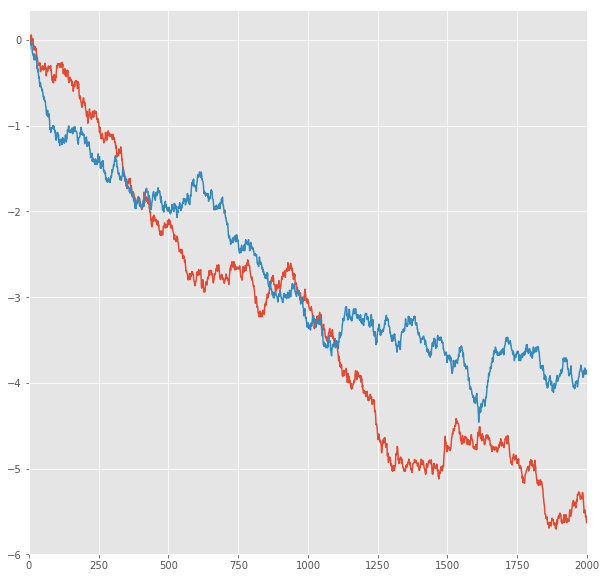

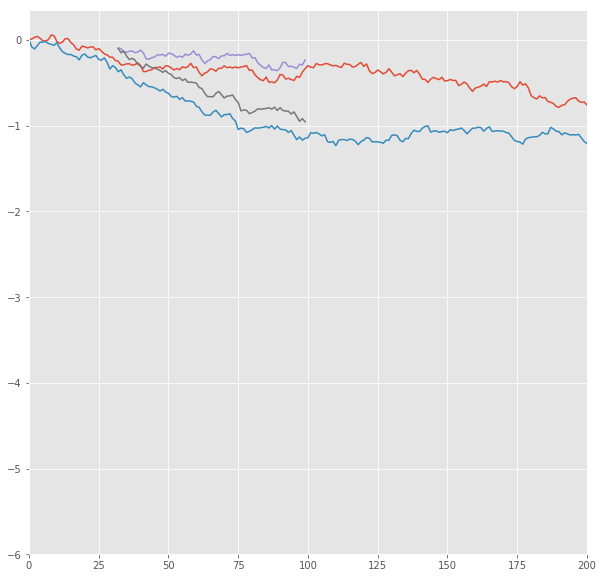

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.2882 RMSE
Predict Score for 1 -steps forecast: 0.5430 RMSE
Error Test Score for 1 -steps forecast: 0.1220 RMSE
RT Test Score for 1 -steps forecast: 0.1630 RMSE
Error Test Corr for 1 -steps forecast: 0.9588
RT Test Corr for 1 -steps forecast: 0.9125


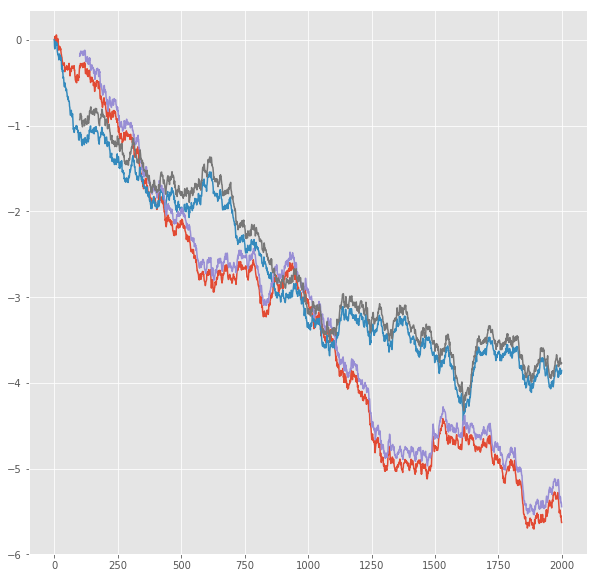

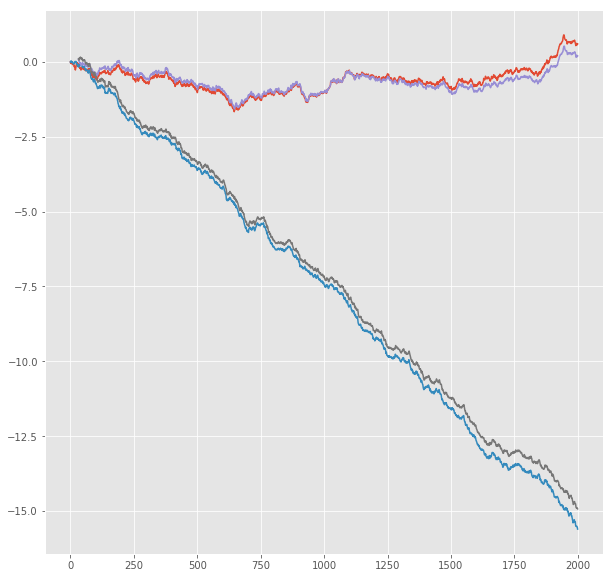

R^2 score for regression on Error: 0.9193
k = 0.9858


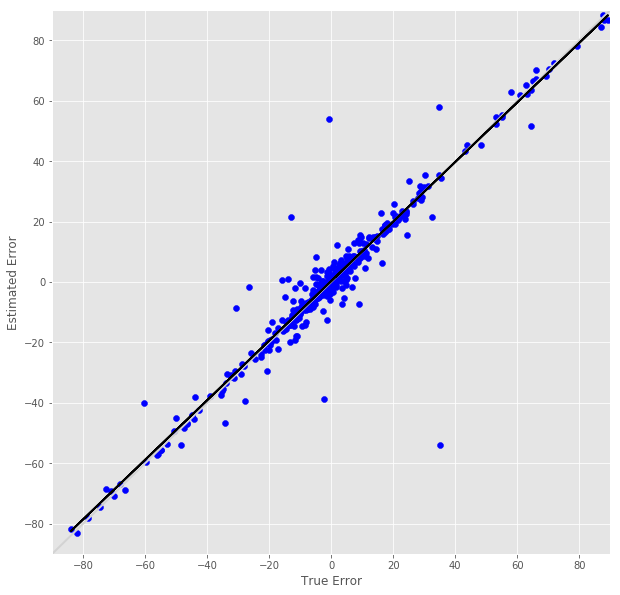

R^2 score for regression on RT: 0.8327
k = 0.9375


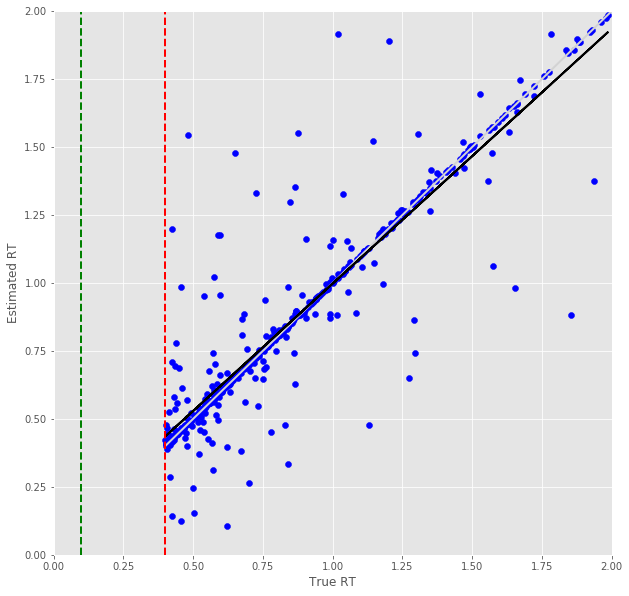

Error Prediction Score: 0.0978 RMSE
RT Prediction Score: 0.1334 RMSE
Error Prediction Corr: 0.9830
RT Prediction Corr: 0.9271
R^2 score for regression on Error: 0.9662
k = 1.0152


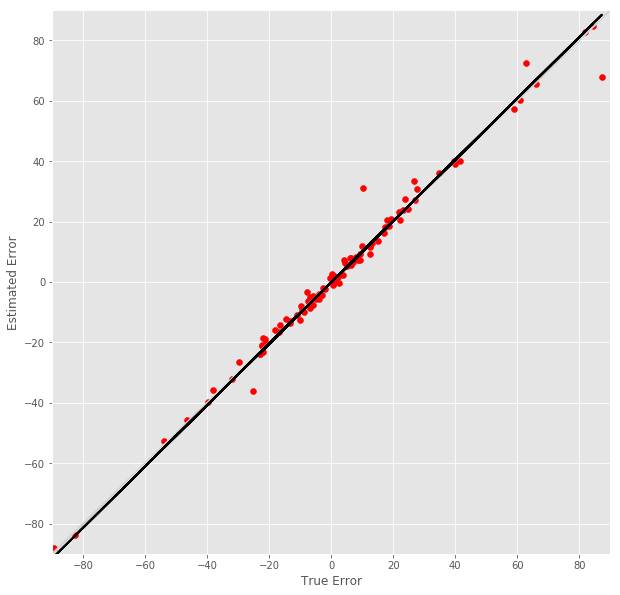

R^2 score for regression on RT: 0.8596
k = 0.9666


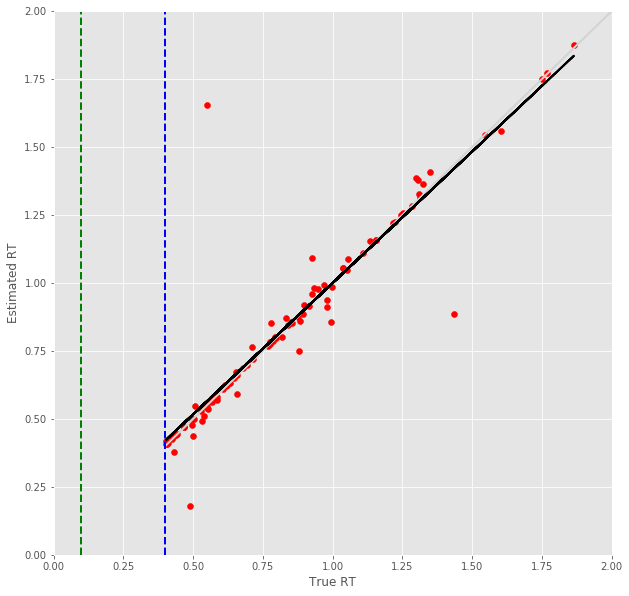

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.5076 RMSE
Predict Score for 2 -steps forecast: 0.8413 RMSE
Error Test Score for 2 -steps forecast: 0.2273 RMSE
RT Test Score for 2 -steps forecast: 0.2802 RMSE
Error Test Corr for 2 -steps forecast: 0.8800
RT Test Corr for 2 -steps forecast: 0.7524


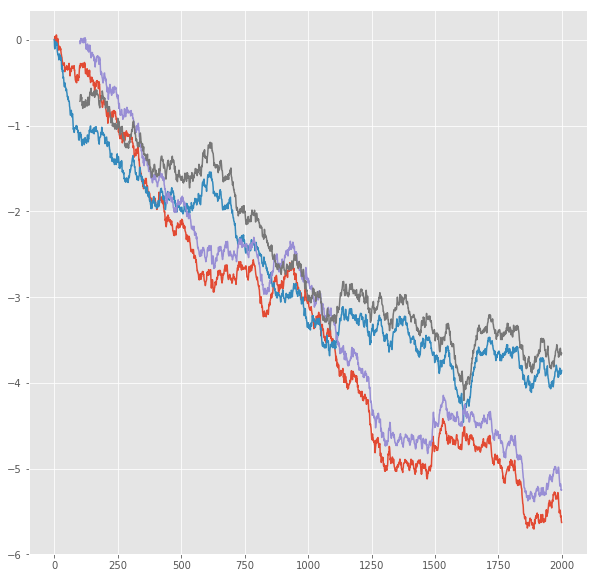

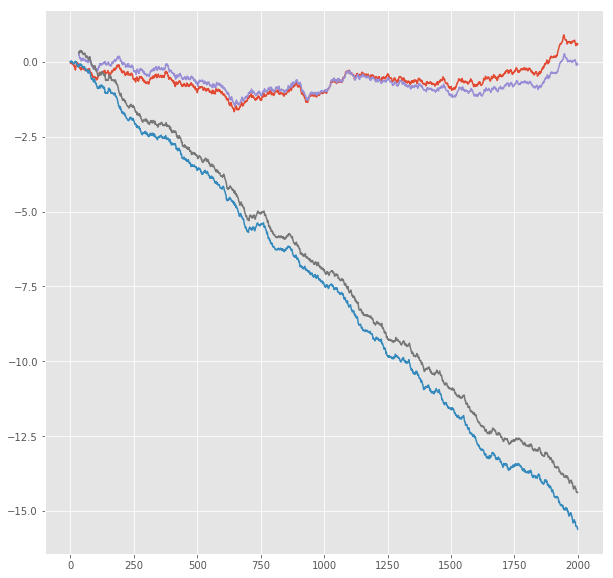

R^2 score for regression on Error: 0.7744
k = 0.9828


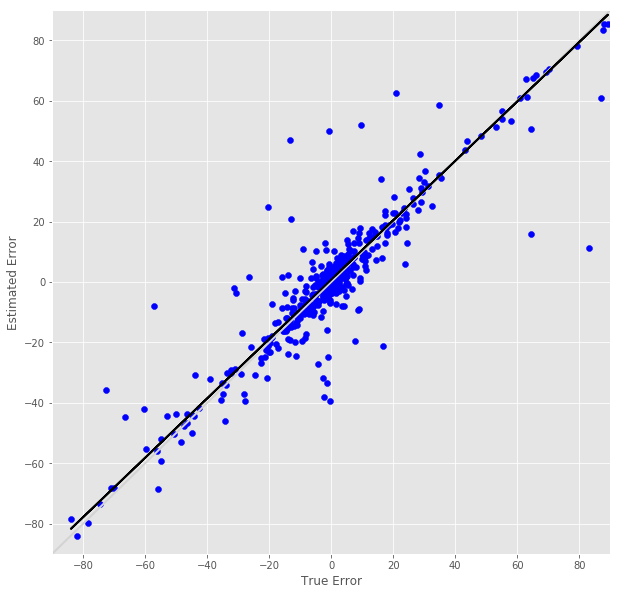

R^2 score for regression on RT: 0.5661
k = 0.8027


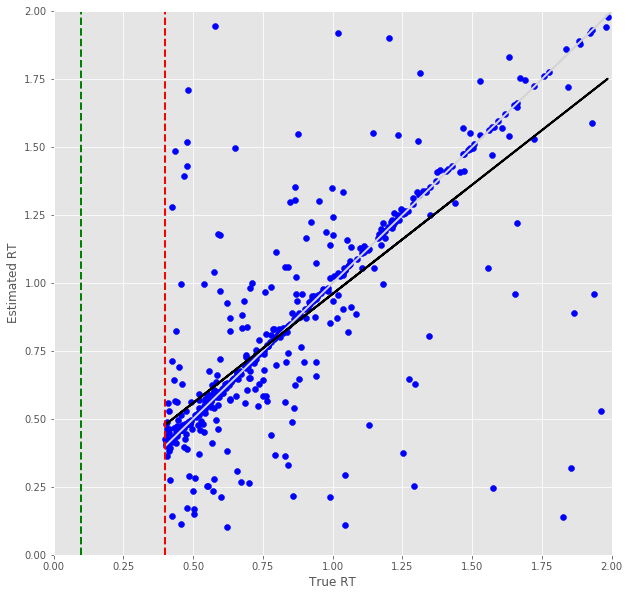

Error Prediction Score: 0.1209 RMSE
RT Prediction Score: 0.1526 RMSE
Error Prediction Corr: 0.9727
RT Prediction Corr: 0.9098
R^2 score for regression on Error: 0.9461
k = 1.0197


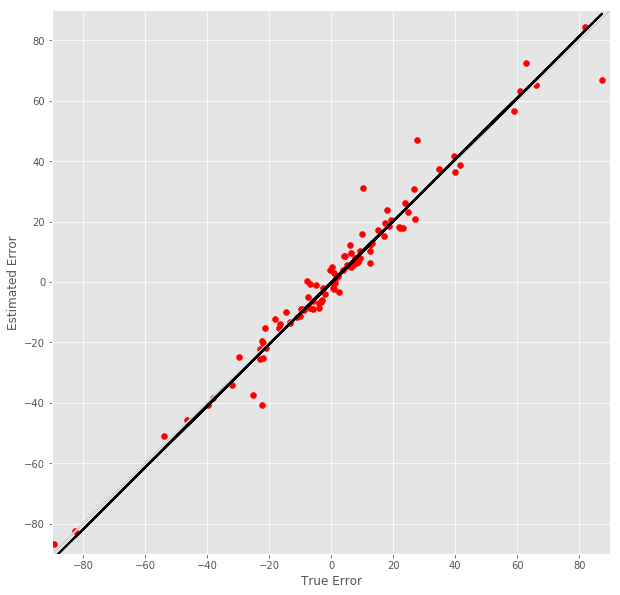

R^2 score for regression on RT: 0.8277
k = 0.9841


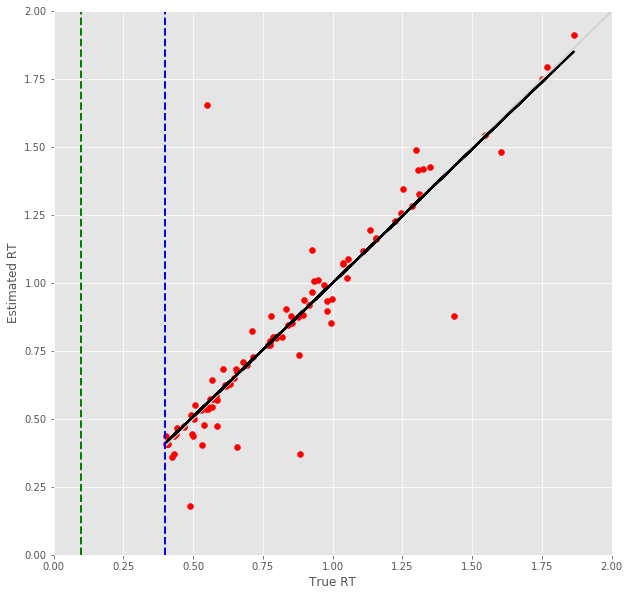

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.7315 RMSE
Predict Score for 3 -steps forecast: 1.1457 RMSE
Error Test Score for 3 -steps forecast: 0.2749 RMSE
RT Test Score for 3 -steps forecast: 0.3373 RMSE
Error Test Corr for 3 -steps forecast: 0.8367
RT Test Corr for 3 -steps forecast: 0.6675


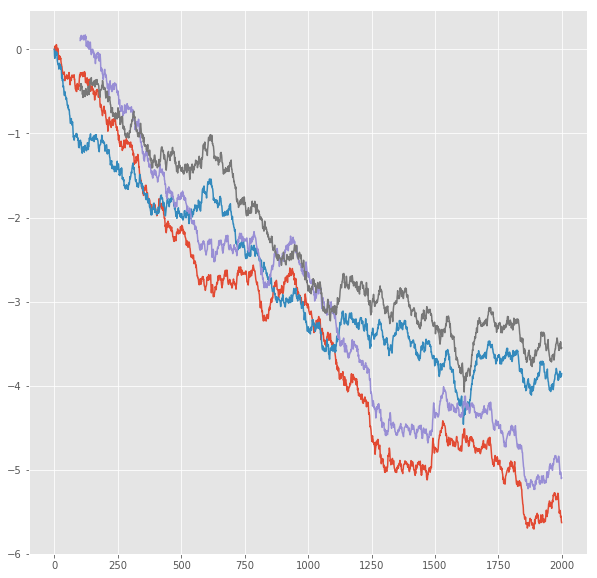

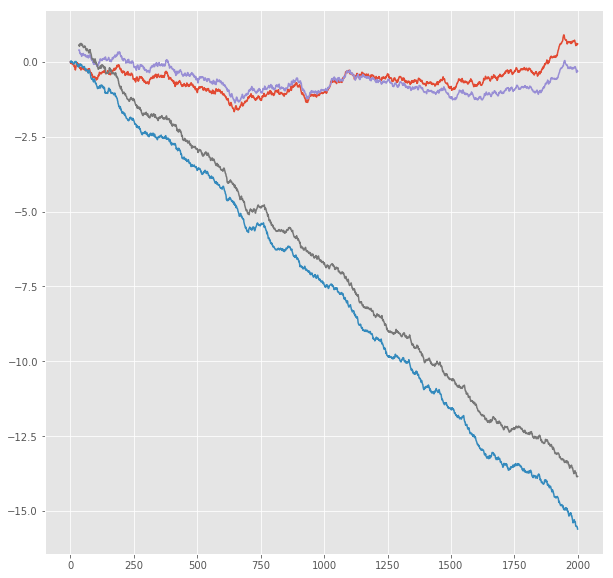

R^2 score for regression on Error: 0.7000
k = 0.9517


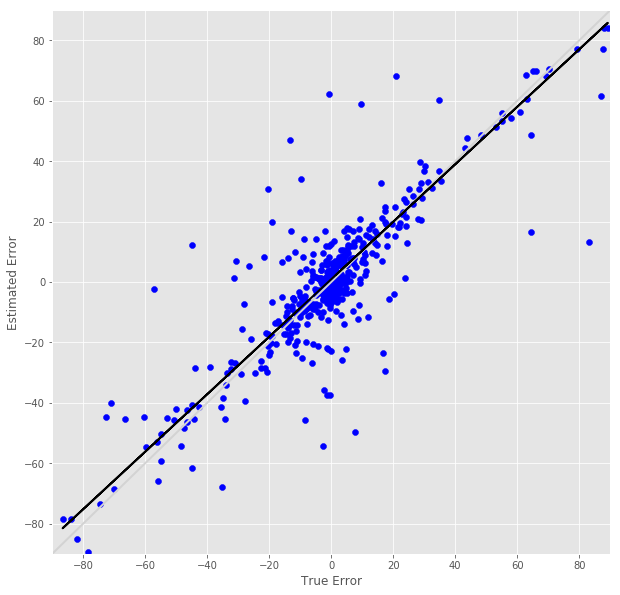

R^2 score for regression on RT: 0.4456
k = 0.7302


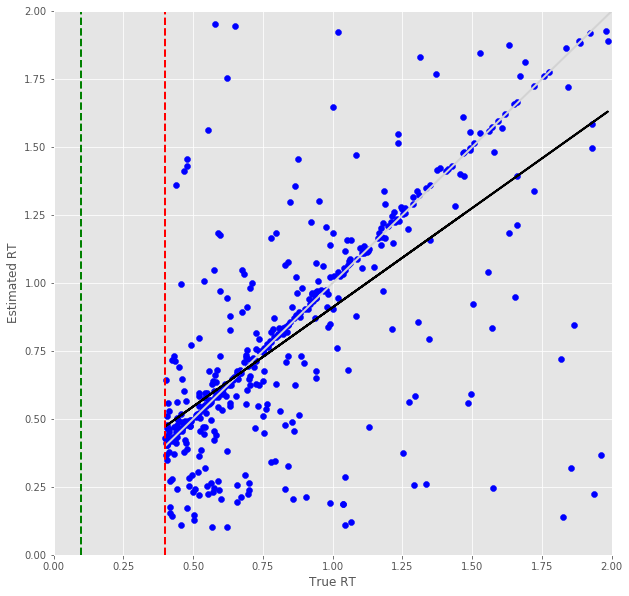

Error Prediction Score: 0.1645 RMSE
RT Prediction Score: 0.1862 RMSE
Error Prediction Corr: 0.9485
RT Prediction Corr: 0.8659
R^2 score for regression on Error: 0.8996
k = 0.9939


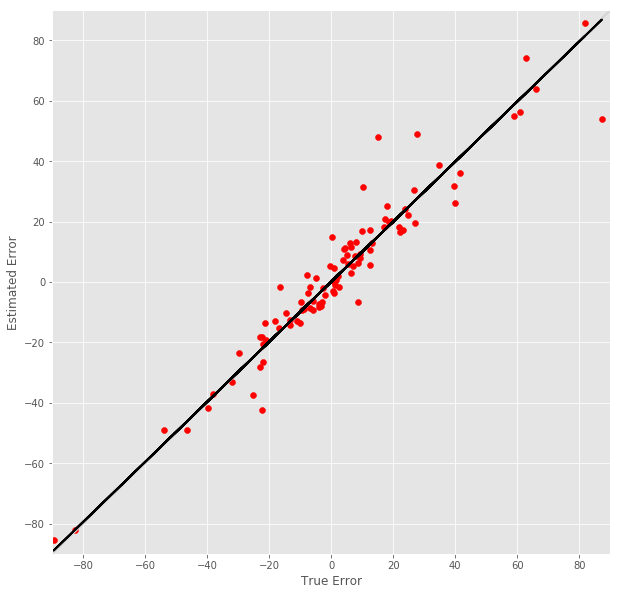

R^2 score for regression on RT: 0.7499
k = 0.9429


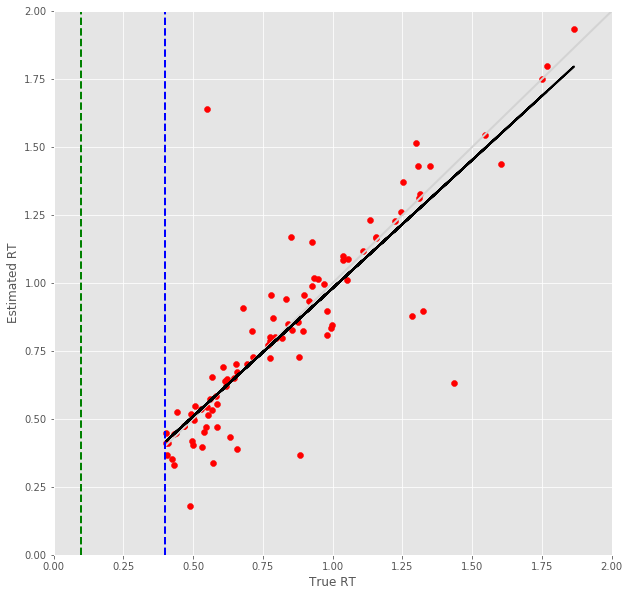

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.9632 RMSE
Predict Score for 4 -steps forecast: 1.4433 RMSE
Error Test Score for 4 -steps forecast: 0.3212 RMSE
RT Test Score for 4 -steps forecast: 0.3838 RMSE
Error Test Corr for 4 -steps forecast: 0.7969
RT Test Corr for 4 -steps forecast: 0.5917


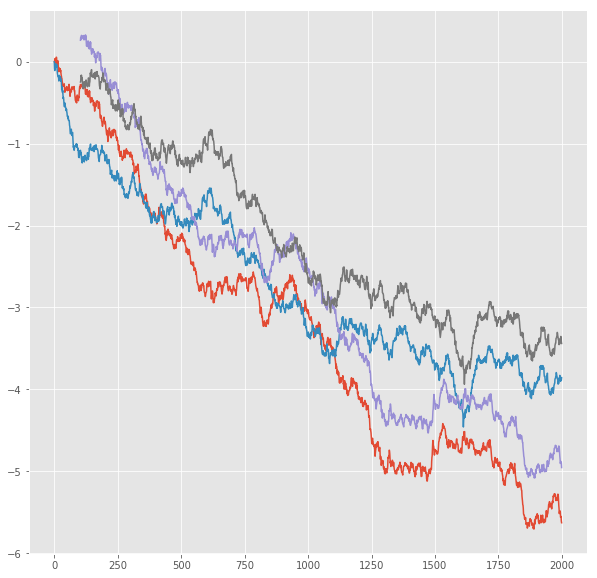

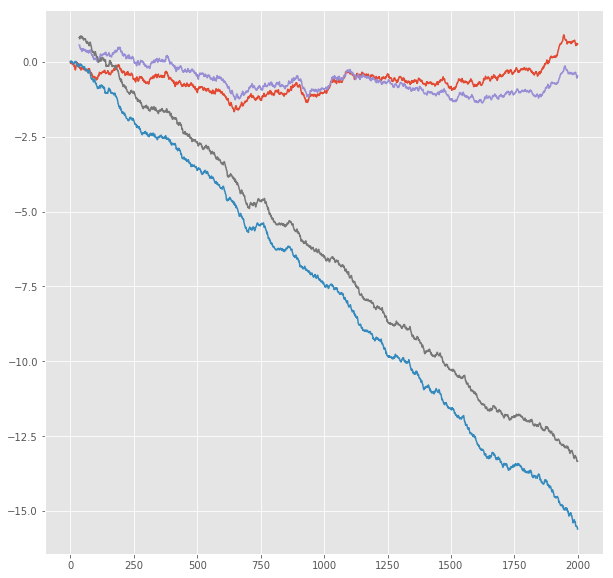

R^2 score for regression on Error: 0.6351
k = 0.9456


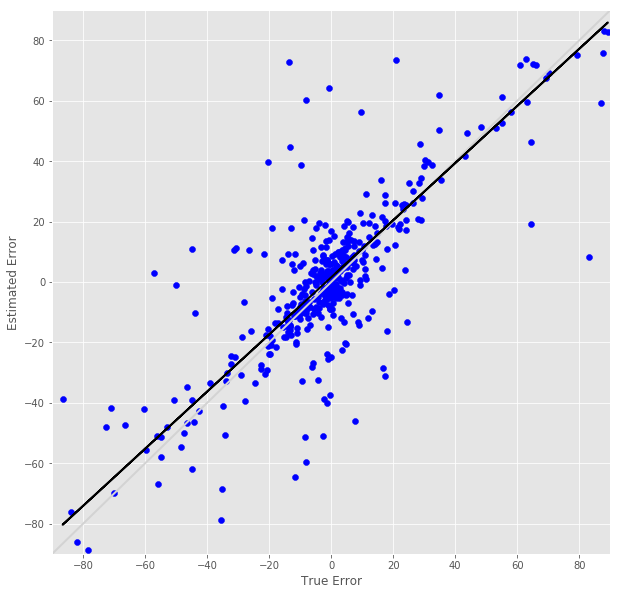

R^2 score for regression on RT: 0.3502
k = 0.6509


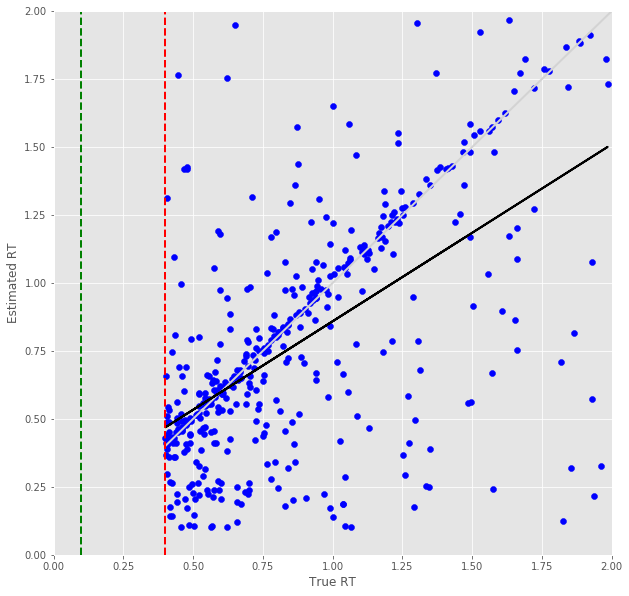

Error Prediction Score: 0.2671 RMSE
RT Prediction Score: 0.2229 RMSE
Error Prediction Corr: 0.8665
RT Prediction Corr: 0.8319
R^2 score for regression on Error: 0.7508
k = 0.9276


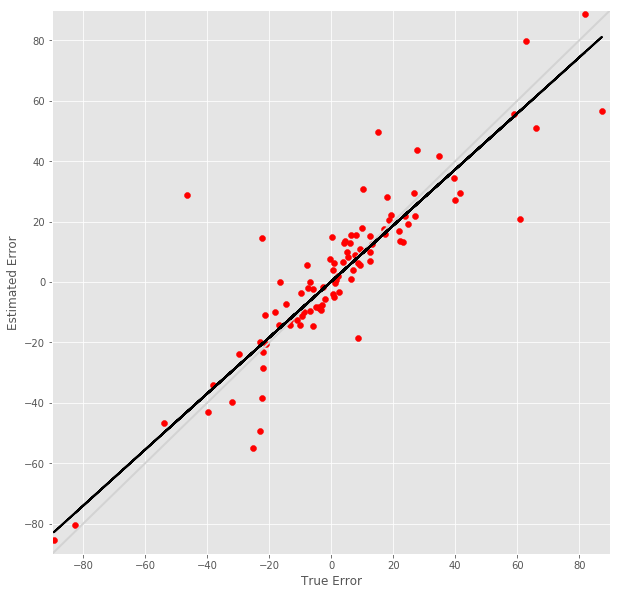

R^2 score for regression on RT: 0.6920
k = 0.9693


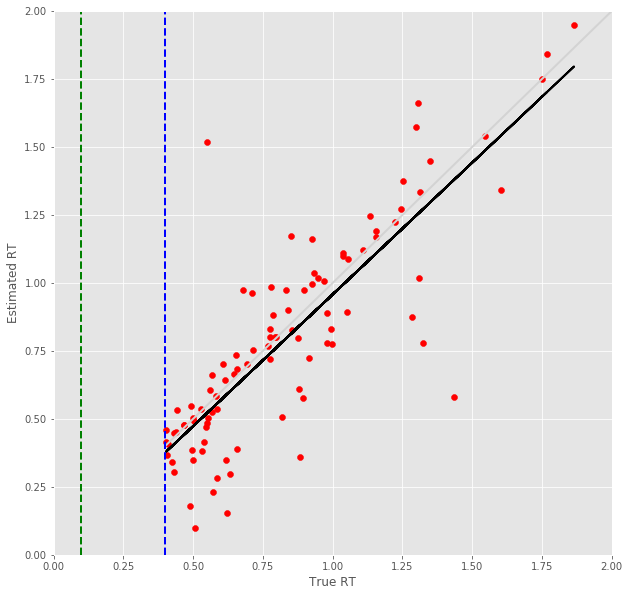

5 -step(s) forecast:
Test Score for 5 -steps forecast: 1.1996 RMSE
Predict Score for 5 -steps forecast: 1.7339 RMSE
Error Test Score for 5 -steps forecast: 0.3755 RMSE
RT Test Score for 5 -steps forecast: 0.4547 RMSE
Error Test Corr for 5 -steps forecast: 0.7485
RT Test Corr for 5 -steps forecast: 0.4672


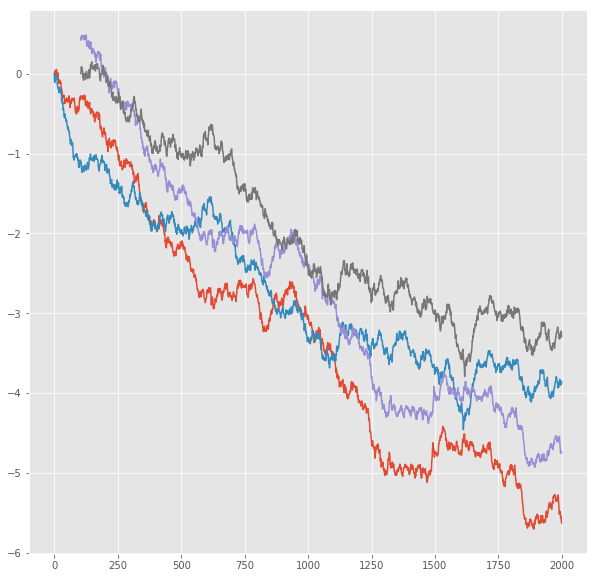

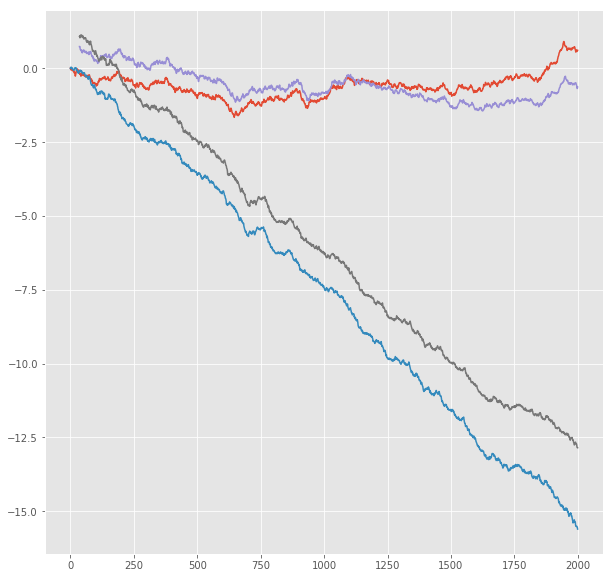

R^2 score for regression on Error: 0.5602
k = 0.9301


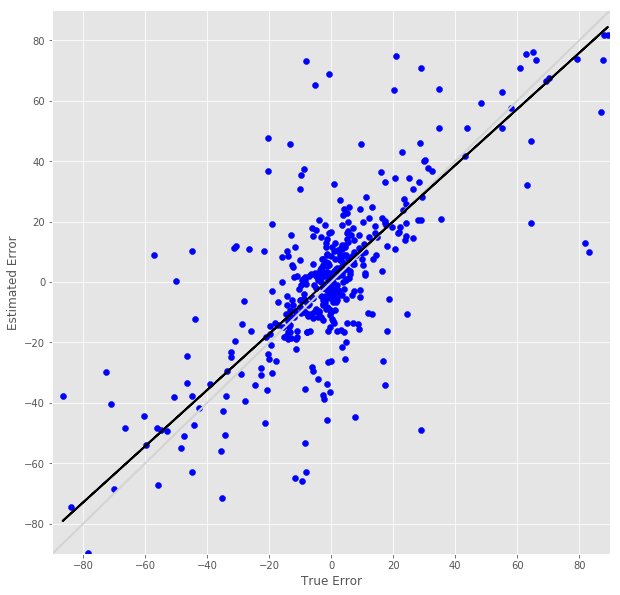

R^2 score for regression on RT: 0.2183
k = 0.5374


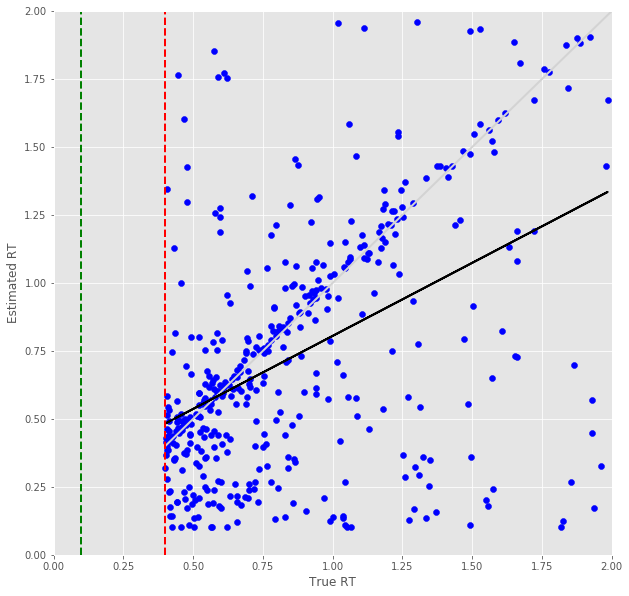

Error Prediction Score: 0.2927 RMSE
RT Prediction Score: 0.2631 RMSE
Error Prediction Corr: 0.8414
RT Prediction Corr: 0.7952
R^2 score for regression on Error: 0.7079
k = 0.9089


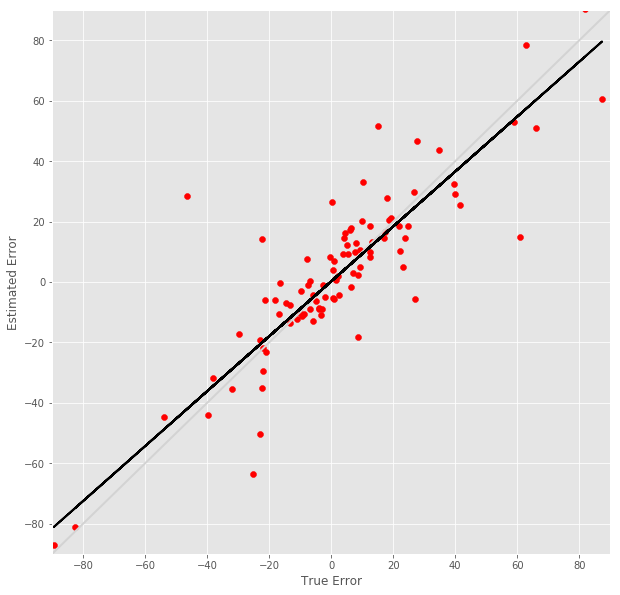

R^2 score for regression on RT: 0.6324
k = 1.0065


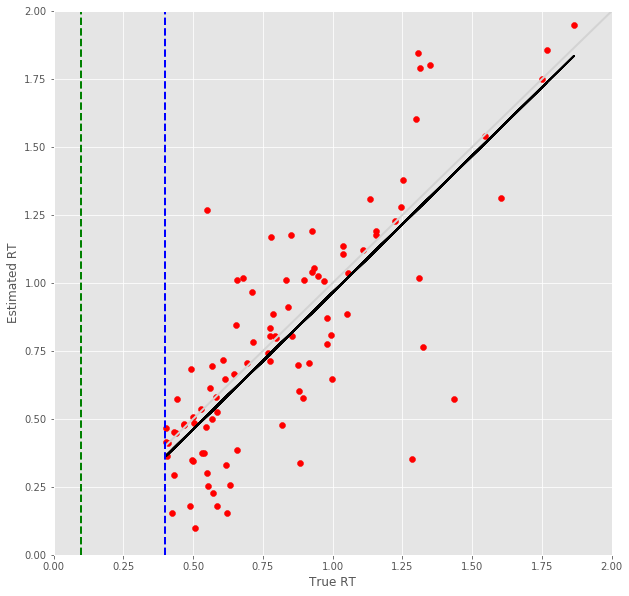

6 -step(s) forecast:
Test Score for 6 -steps forecast: 1.4390 RMSE
Predict Score for 6 -steps forecast: 2.0191 RMSE
Error Test Score for 6 -steps forecast: 0.4418 RMSE
RT Test Score for 6 -steps forecast: 0.5050 RMSE
Error Test Corr for 6 -steps forecast: 0.6869
RT Test Corr for 6 -steps forecast: 0.3732


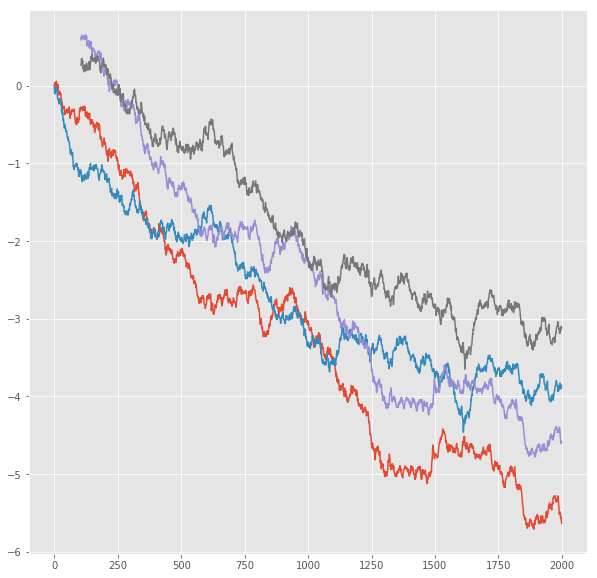

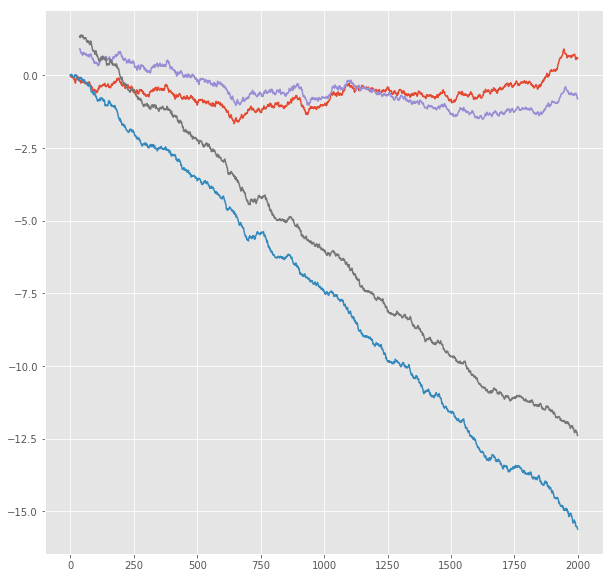

R^2 score for regression on Error: 0.4719
k = 0.9033


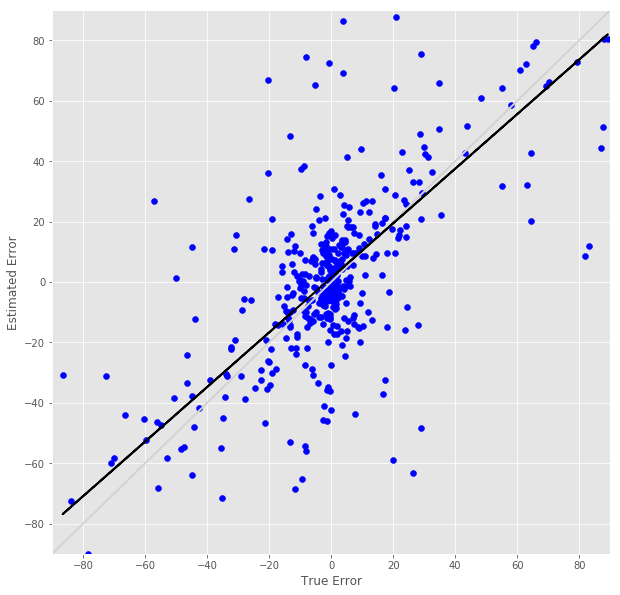

R^2 score for regression on RT: 0.1393
k = 0.4361


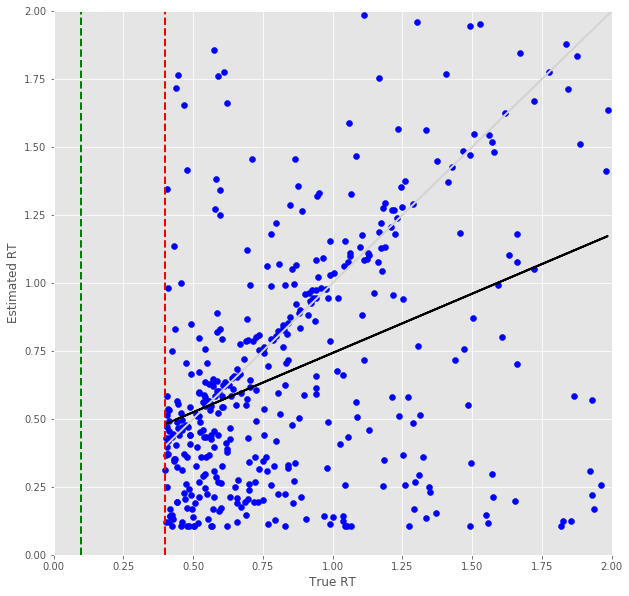

Error Prediction Score: 0.3118 RMSE
RT Prediction Score: 0.3155 RMSE
Error Prediction Corr: 0.8275
RT Prediction Corr: 0.7014
R^2 score for regression on Error: 0.6847
k = 0.9191


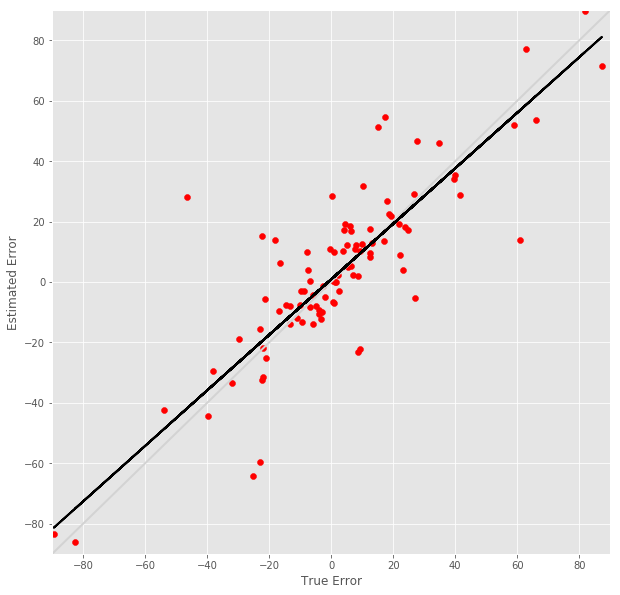

R^2 score for regression on RT: 0.4919
k = 0.8956


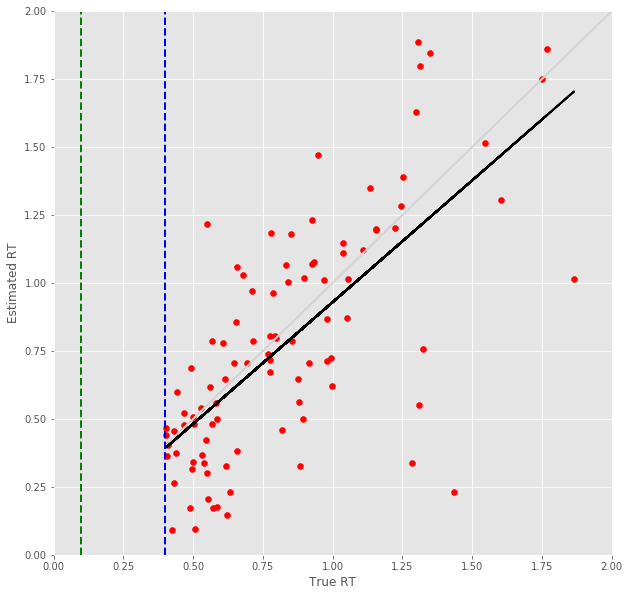

7 -step(s) forecast:
Test Score for 7 -steps forecast: 1.6804 RMSE
Predict Score for 7 -steps forecast: 2.2995 RMSE
Error Test Score for 7 -steps forecast: 0.4849 RMSE
RT Test Score for 7 -steps forecast: 0.5393 RMSE
Error Test Corr for 7 -steps forecast: 0.6565
RT Test Corr for 7 -steps forecast: 0.3100


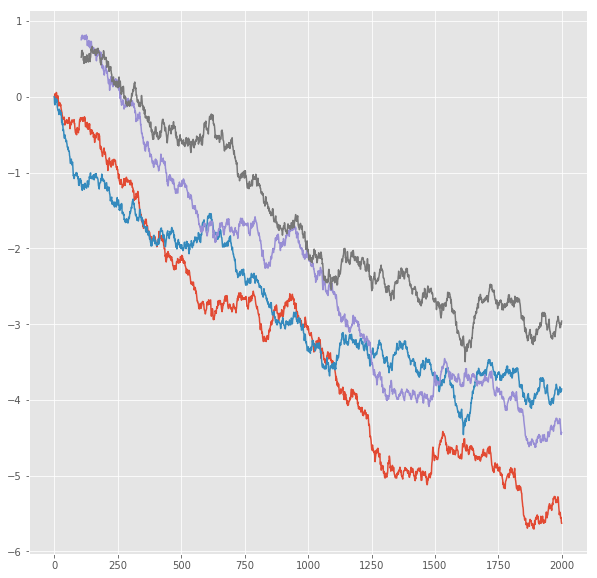

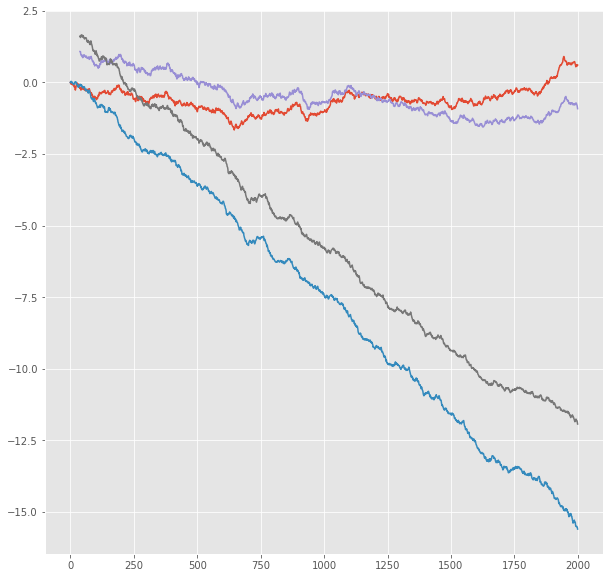

R^2 score for regression on Error: 0.4310
k = 0.9078


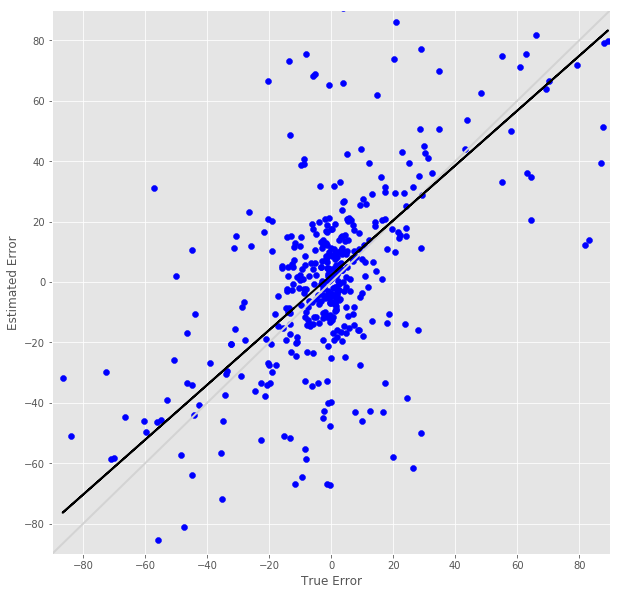

R^2 score for regression on RT: 0.0961
k = 0.3579


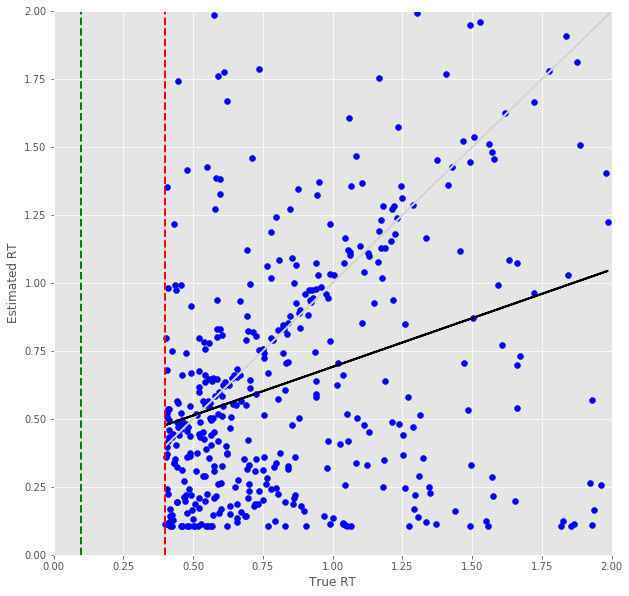

Error Prediction Score: 0.3567 RMSE
RT Prediction Score: 0.3489 RMSE
Error Prediction Corr: 0.7930
RT Prediction Corr: 0.6718
R^2 score for regression on Error: 0.6288
k = 0.9334


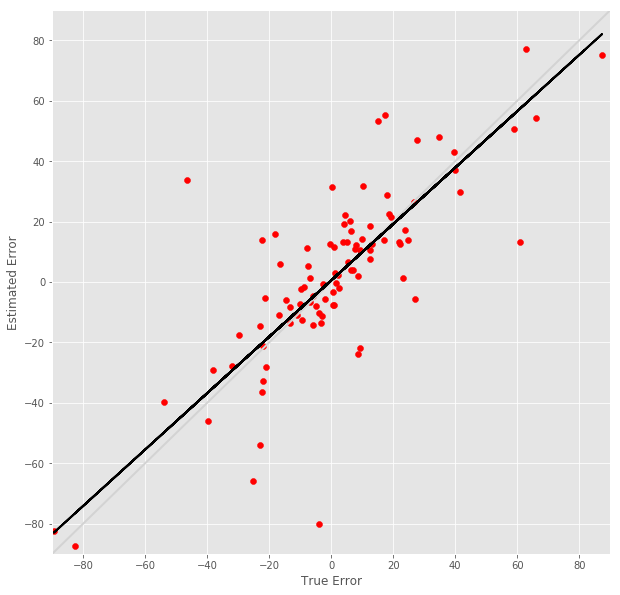

R^2 score for regression on RT: 0.4513
k = 0.9095


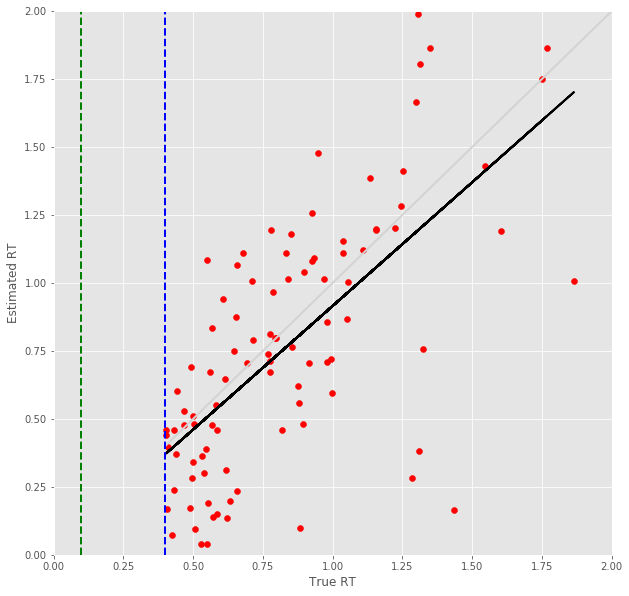

8 -step(s) forecast:
Test Score for 8 -steps forecast: 1.9237 RMSE
Predict Score for 8 -steps forecast: 2.5755 RMSE
Error Test Score for 8 -steps forecast: 0.5137 RMSE
RT Test Score for 8 -steps forecast: 0.5797 RMSE
Error Test Corr for 8 -steps forecast: 0.6270
RT Test Corr for 8 -steps forecast: 0.2705


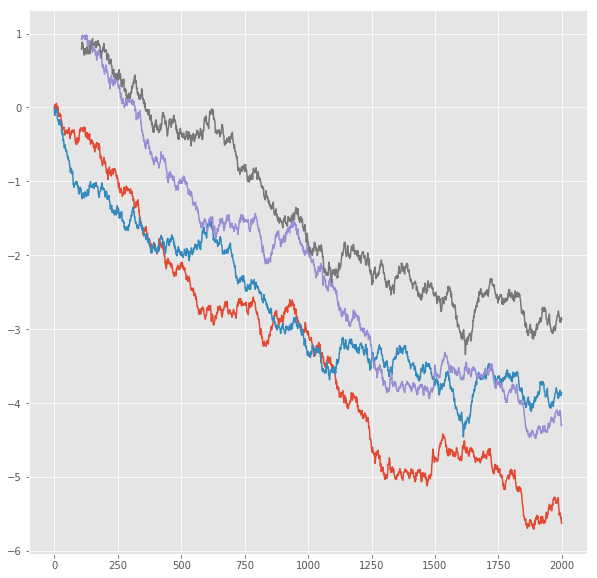

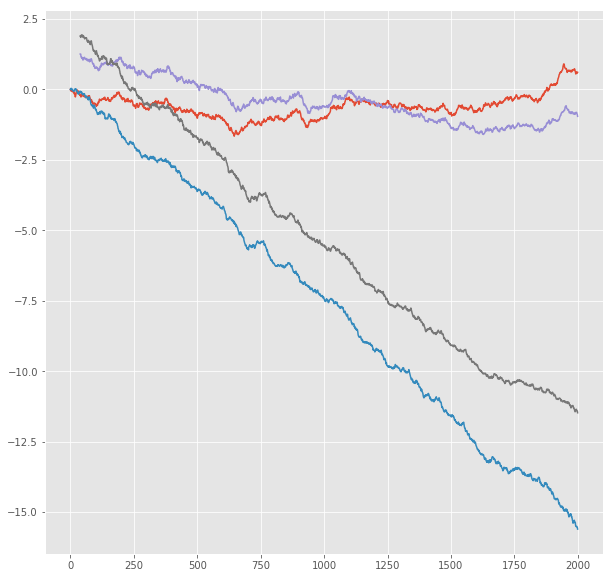

R^2 score for regression on Error: 0.3932
k = 0.8773


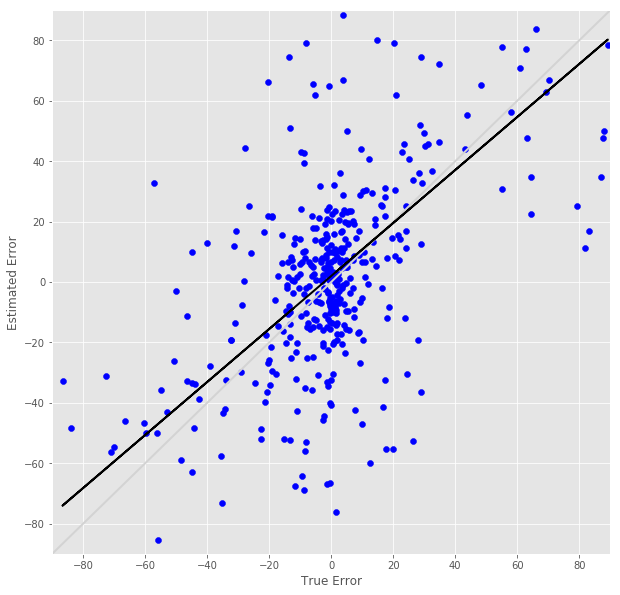

R^2 score for regression on RT: 0.0732
k = 0.3188


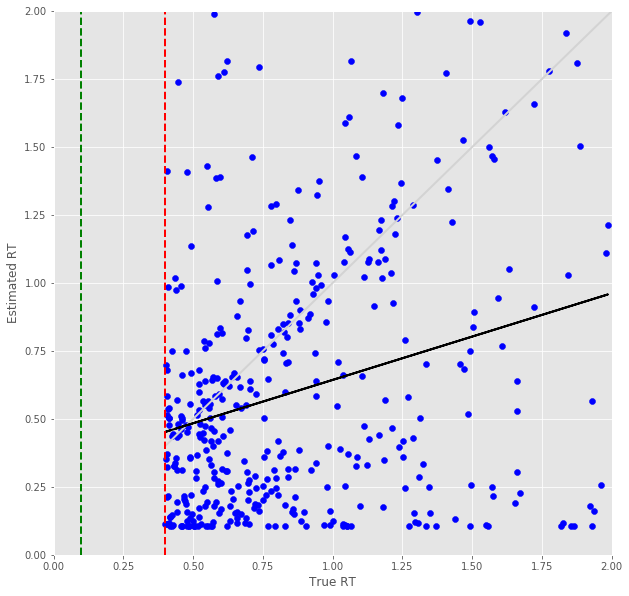

Error Prediction Score: 0.4338 RMSE
RT Prediction Score: 0.3846 RMSE
Error Prediction Corr: 0.7056
RT Prediction Corr: 0.5865
R^2 score for regression on Error: 0.4979
k = 0.8516


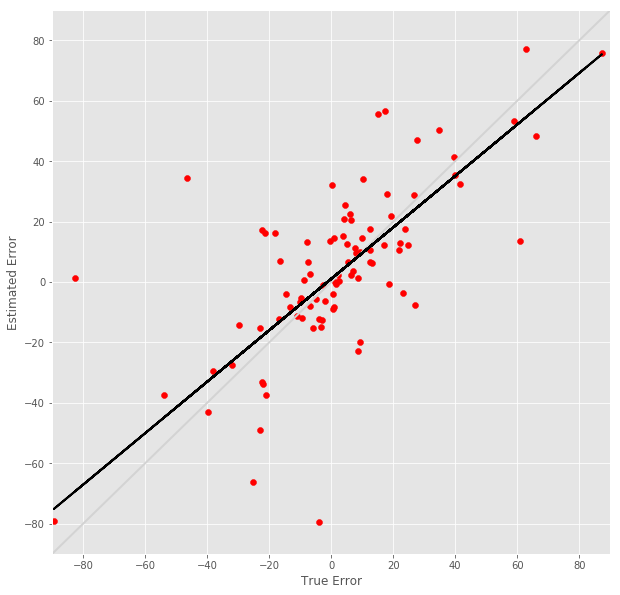

R^2 score for regression on RT: 0.3440
k = 0.7729


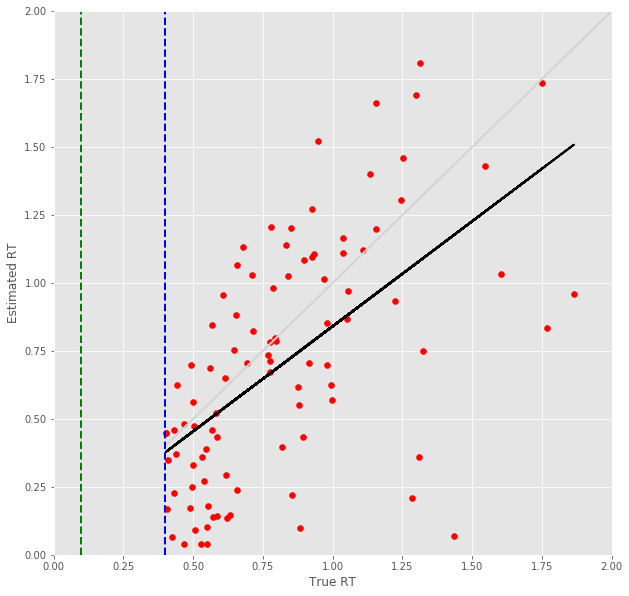

9 -step(s) forecast:
Test Score for 9 -steps forecast: 2.1689 RMSE
Predict Score for 9 -steps forecast: 2.8477 RMSE
Error Test Score for 9 -steps forecast: 0.5572 RMSE
RT Test Score for 9 -steps forecast: 0.6122 RMSE
Error Test Corr for 9 -steps forecast: 0.6047
RT Test Corr for 9 -steps forecast: 0.2545


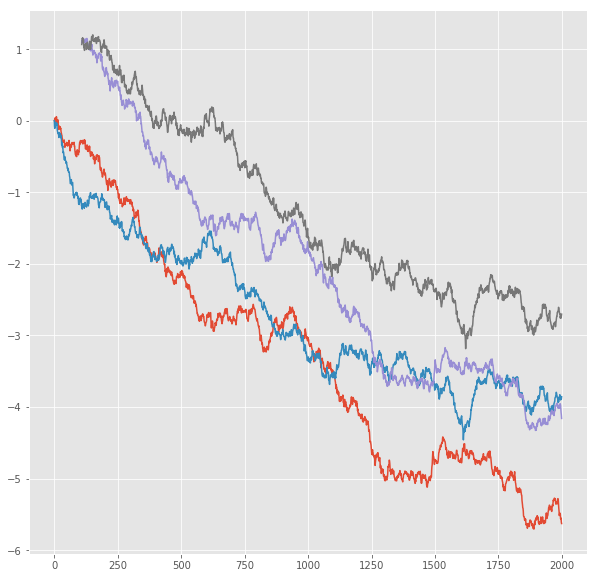

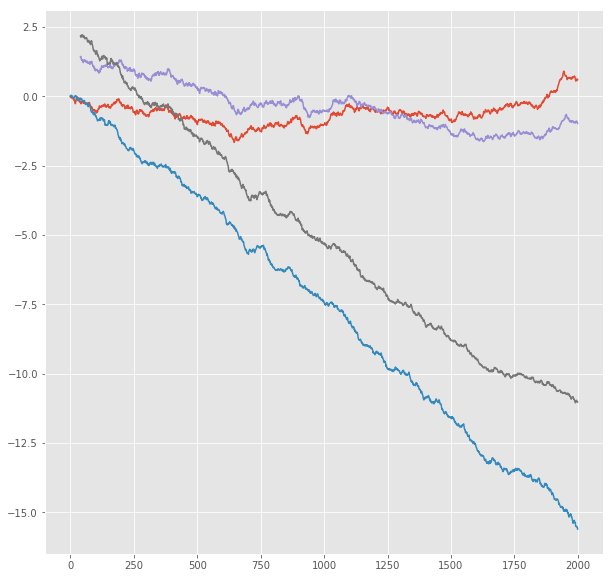

R^2 score for regression on Error: 0.3657
k = 0.8995


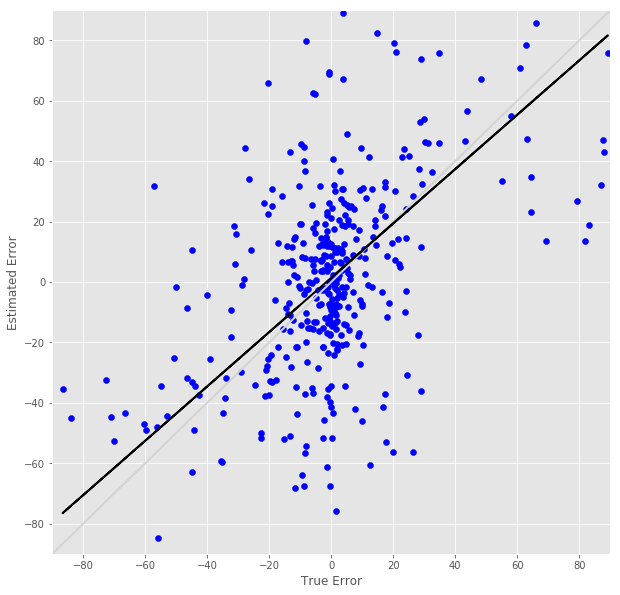

R^2 score for regression on RT: 0.0648
k = 0.3008


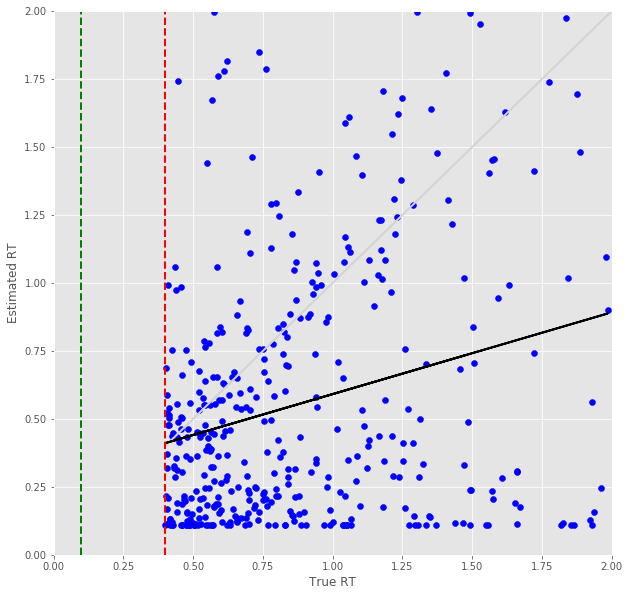

Error Prediction Score: 0.4683 RMSE
RT Prediction Score: 0.4274 RMSE
Error Prediction Corr: 0.6712
RT Prediction Corr: 0.5451
R^2 score for regression on Error: 0.4505
k = 0.8357


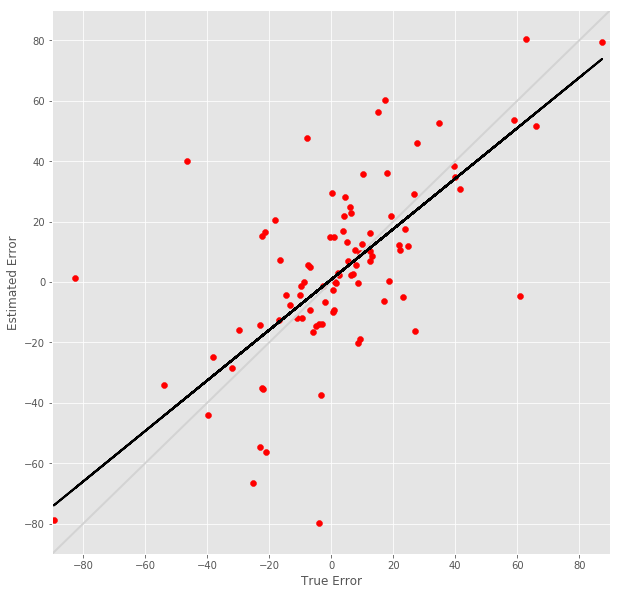

R^2 score for regression on RT: 0.2972
k = 0.7616


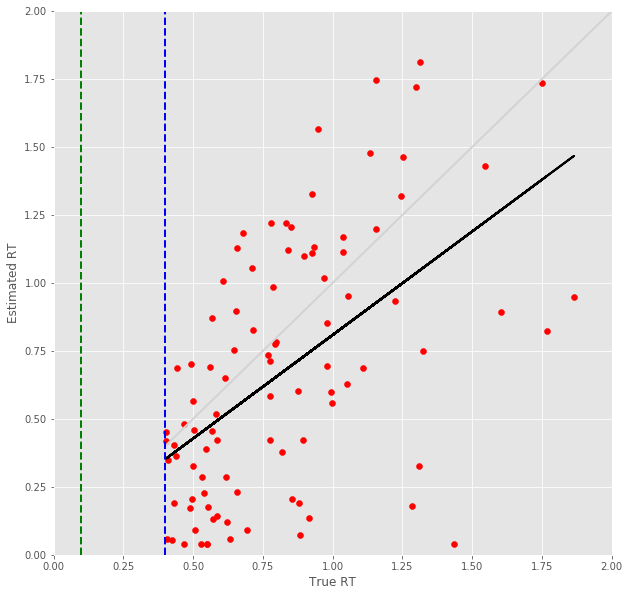

10 -step(s) forecast:
Test Score for 10 -steps forecast: 2.4160 RMSE
Predict Score for 10 -steps forecast: 3.1165 RMSE
Error Test Score for 10 -steps forecast: 0.5934 RMSE
RT Test Score for 10 -steps forecast: 0.6377 RMSE
Error Test Corr for 10 -steps forecast: 0.5794
RT Test Corr for 10 -steps forecast: 0.2119


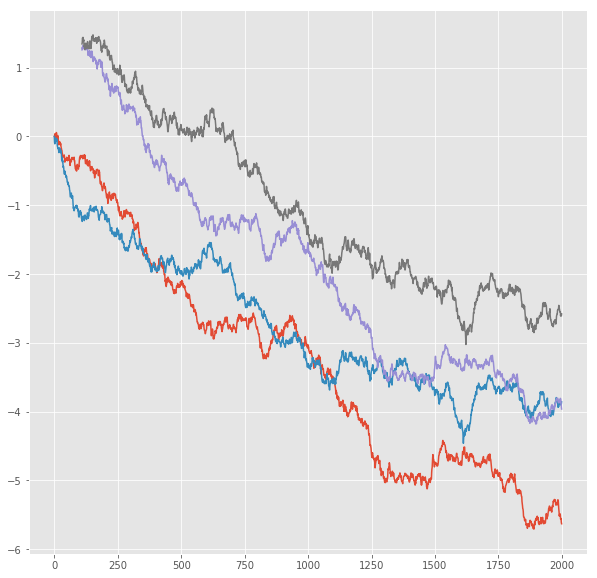

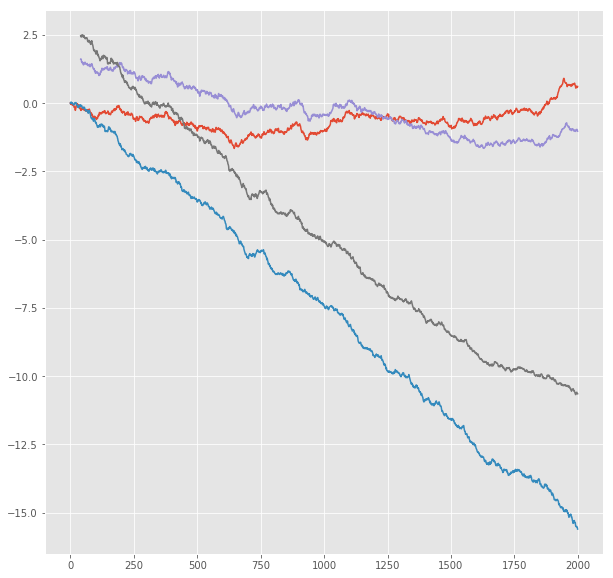

R^2 score for regression on Error: 0.3357
k = 0.8926


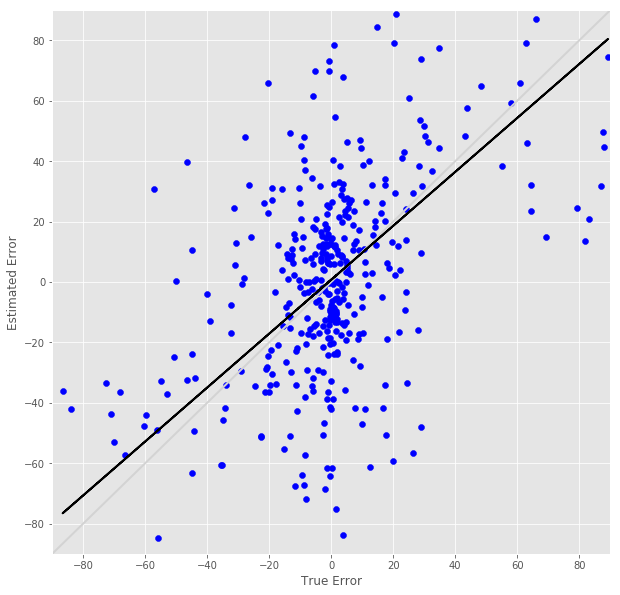

R^2 score for regression on RT: 0.0449
k = 0.2349


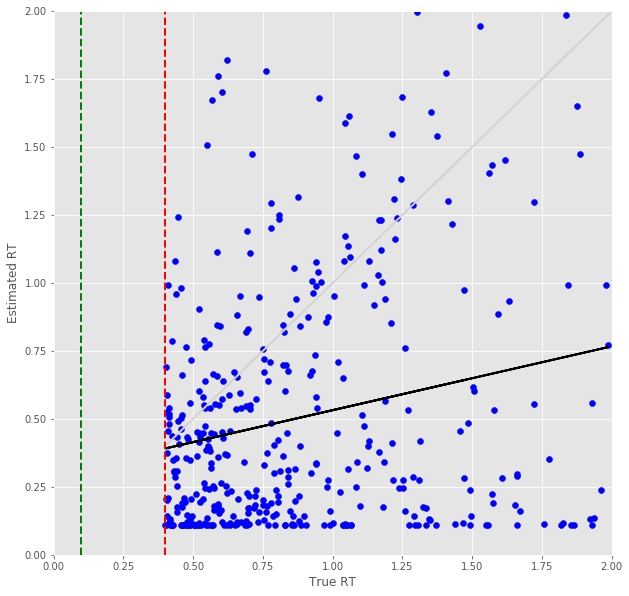

Error Prediction Score: 0.5006 RMSE
RT Prediction Score: 0.4619 RMSE
Error Prediction Corr: 0.6560
RT Prediction Corr: 0.4796
R^2 score for regression on Error: 0.4304
k = 0.8593


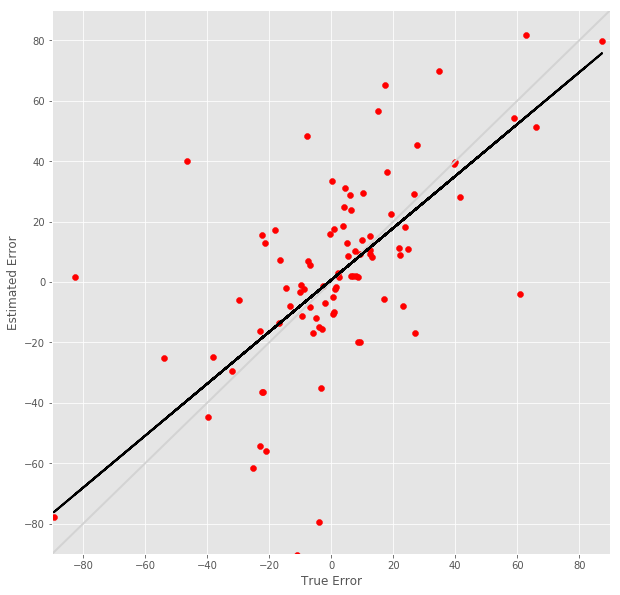

R^2 score for regression on RT: 0.2300
k = 0.6720


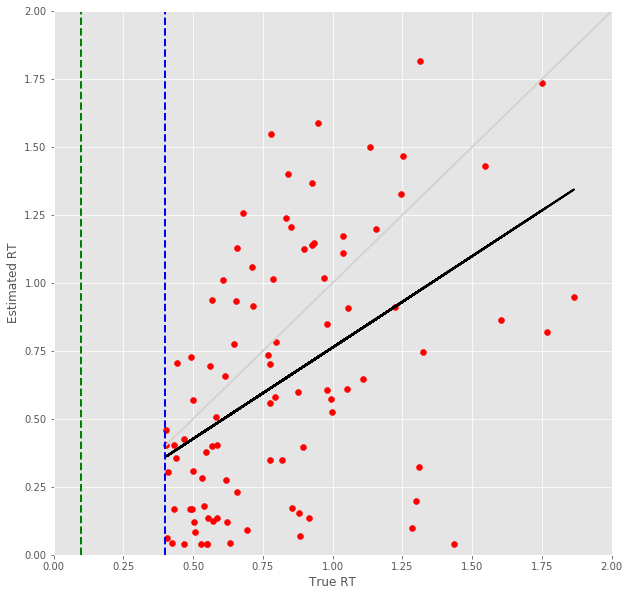

11 -step(s) forecast:
Test Score for 11 -steps forecast: 2.6651 RMSE
Predict Score for 11 -steps forecast: 3.3825 RMSE
Error Test Score for 11 -steps forecast: 0.6253 RMSE
RT Test Score for 11 -steps forecast: 0.6776 RMSE
Error Test Corr for 11 -steps forecast: 0.5623
RT Test Corr for 11 -steps forecast: 0.1471


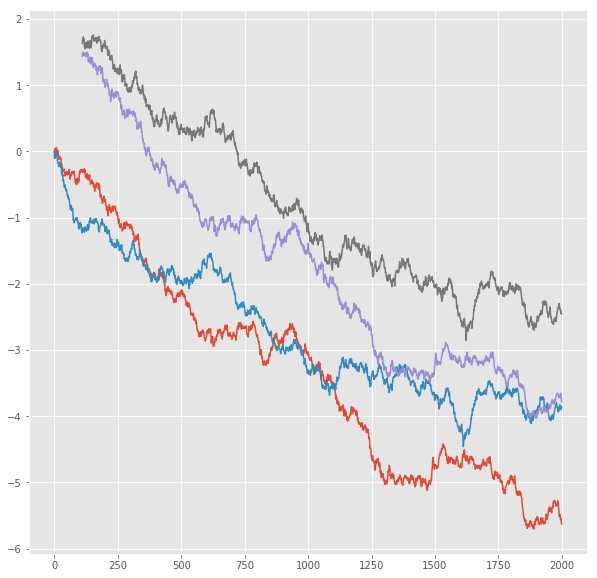

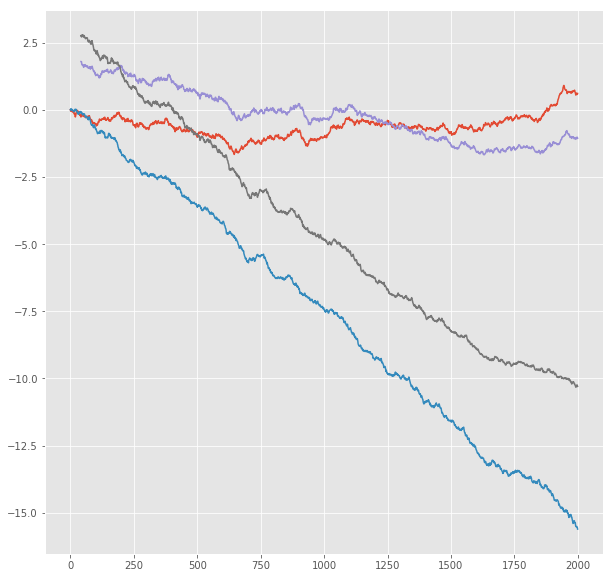

R^2 score for regression on Error: 0.3162
k = 0.8988


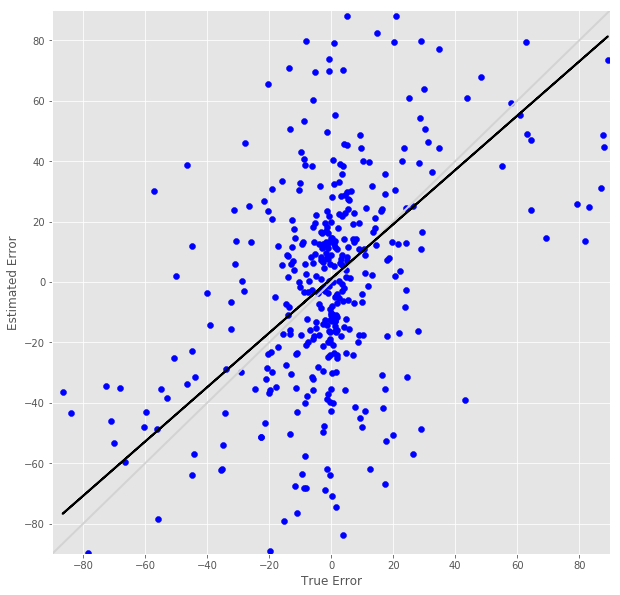

R^2 score for regression on RT: 0.0216
k = 0.1590


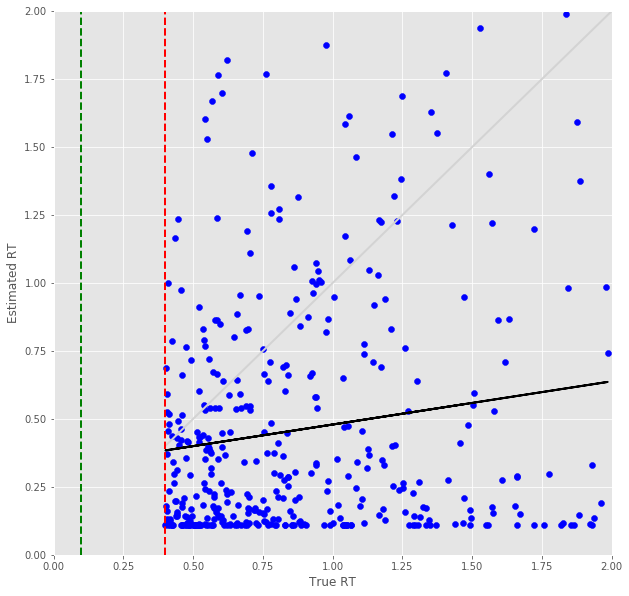

Error Prediction Score: 0.5098 RMSE
RT Prediction Score: 0.4863 RMSE
Error Prediction Corr: 0.6513
RT Prediction Corr: 0.4463
R^2 score for regression on Error: 0.4242
k = 0.8651


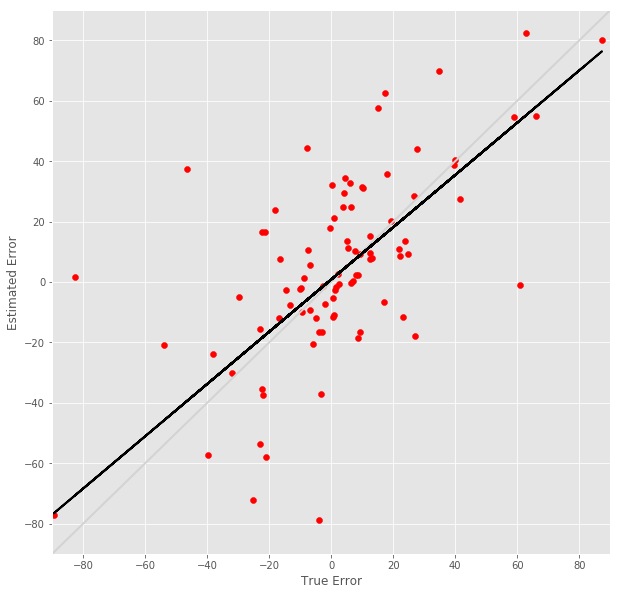

R^2 score for regression on RT: 0.1992
k = 0.6273


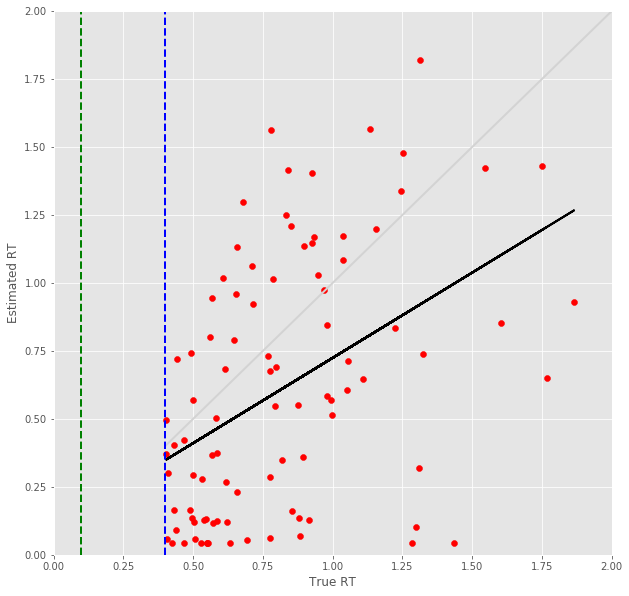

12 -step(s) forecast:
Test Score for 12 -steps forecast: 2.9161 RMSE
Predict Score for 12 -steps forecast: 3.6461 RMSE
Error Test Score for 12 -steps forecast: 0.6406 RMSE
RT Test Score for 12 -steps forecast: 0.7064 RMSE
Error Test Corr for 12 -steps forecast: 0.5521
RT Test Corr for 12 -steps forecast: 0.0917


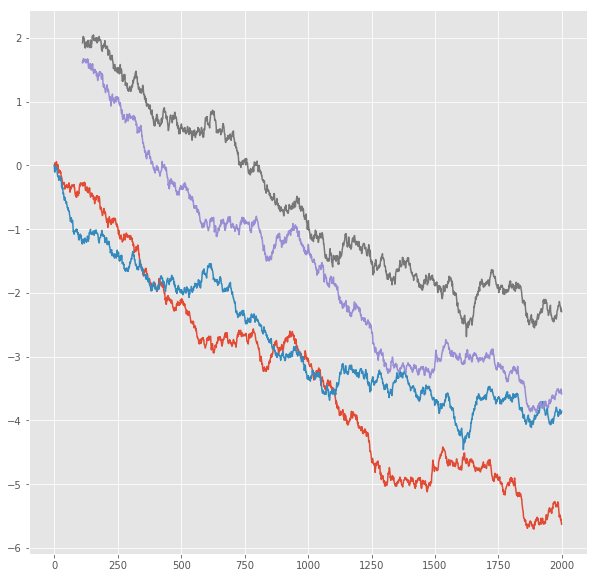

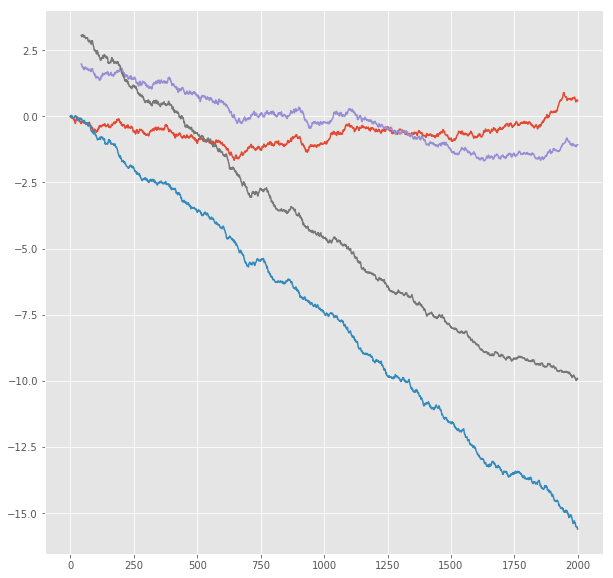

R^2 score for regression on Error: 0.3048
k = 0.8948


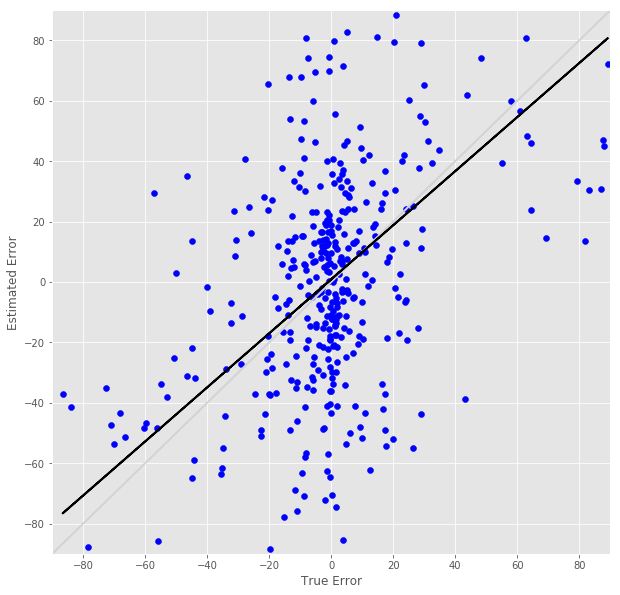

R^2 score for regression on RT: 0.0084
k = 0.0936


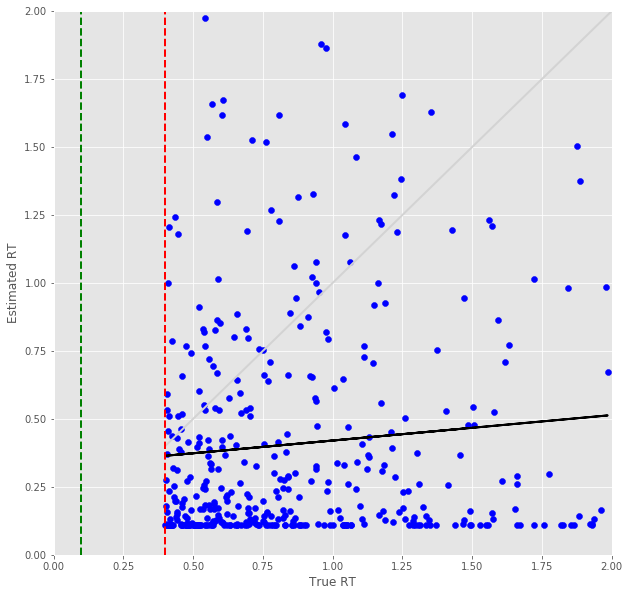

Error Prediction Score: 0.5836 RMSE
RT Prediction Score: 0.5378 RMSE
Error Prediction Corr: 0.5754
RT Prediction Corr: 0.4053
R^2 score for regression on Error: 0.3311
k = 0.8108


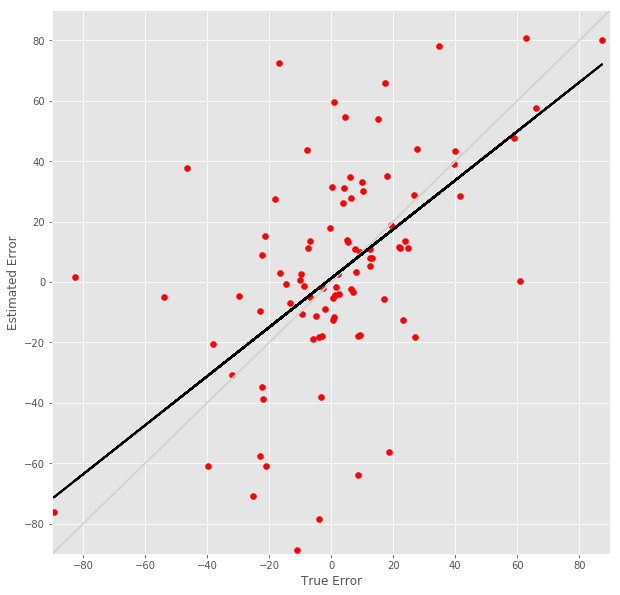

R^2 score for regression on RT: 0.1643
k = 0.5725


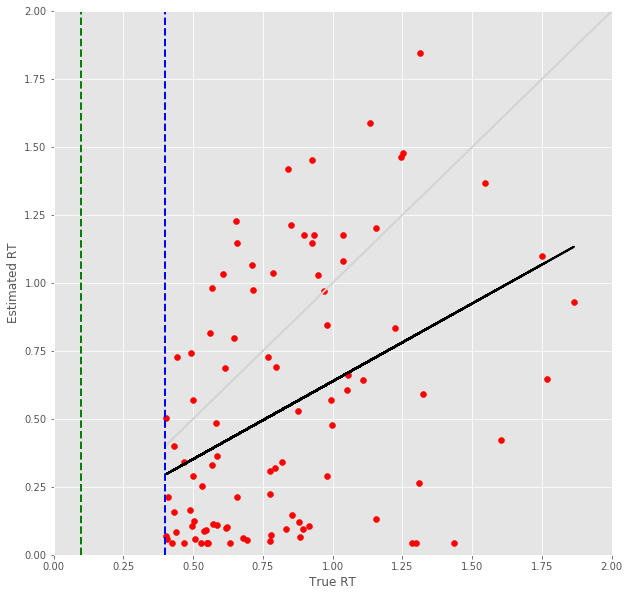

13 -step(s) forecast:
Test Score for 13 -steps forecast: 3.1688 RMSE
Predict Score for 13 -steps forecast: 3.9076 RMSE
Error Test Score for 13 -steps forecast: 0.6748 RMSE
RT Test Score for 13 -steps forecast: 0.7205 RMSE
Error Test Corr for 13 -steps forecast: 0.5308
RT Test Corr for 13 -steps forecast: 0.1105


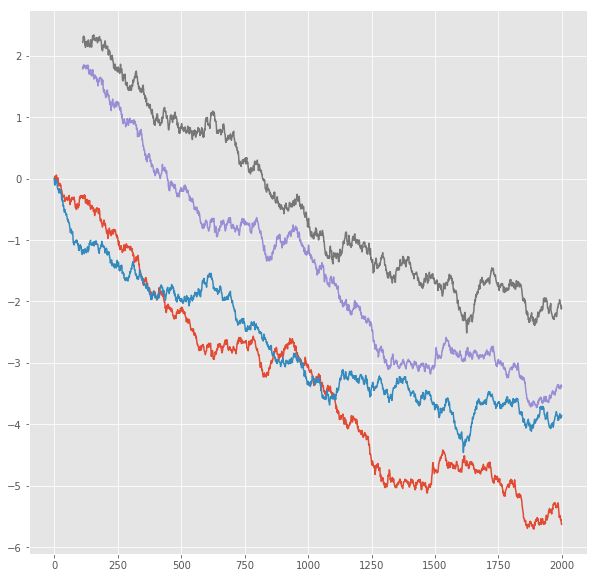

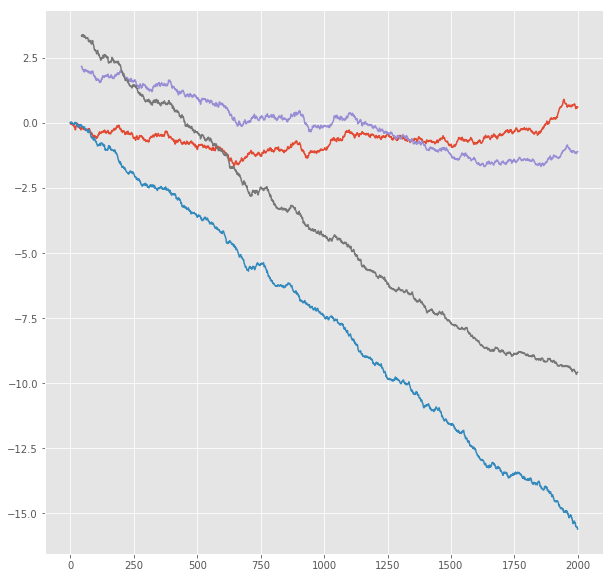

R^2 score for regression on Error: 0.2818
k = 0.8906


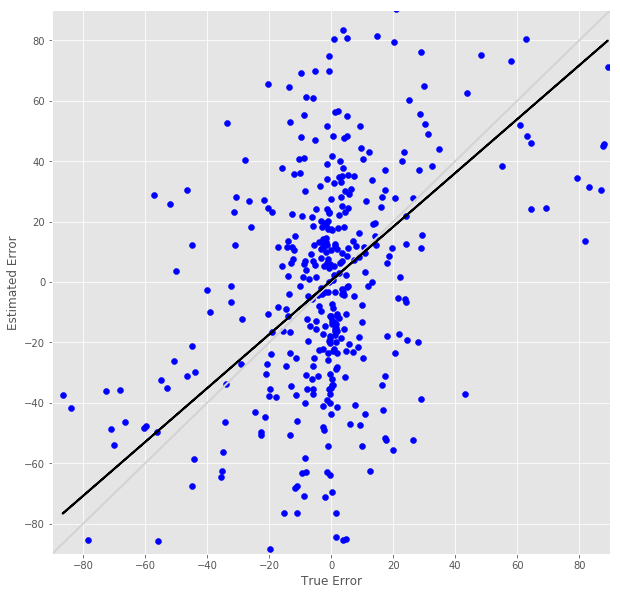

R^2 score for regression on RT: 0.0122
k = 0.1077


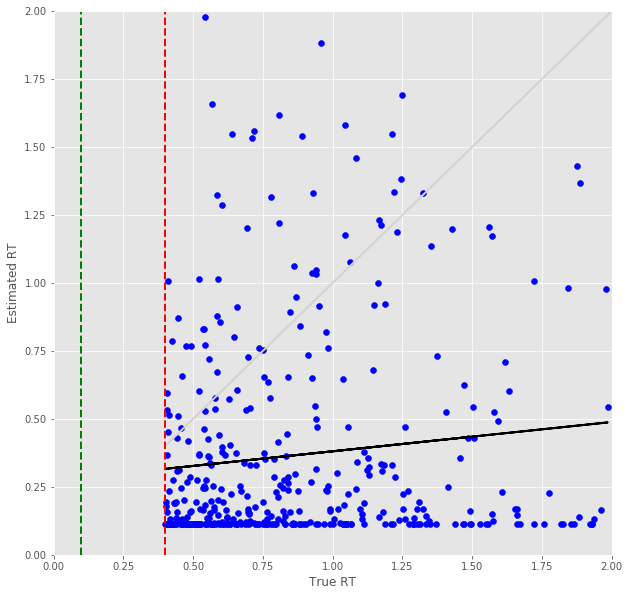

Error Prediction Score: 0.6192 RMSE
RT Prediction Score: 0.5844 RMSE
Error Prediction Corr: 0.5512
RT Prediction Corr: 0.3488
R^2 score for regression on Error: 0.3039
k = 0.8088


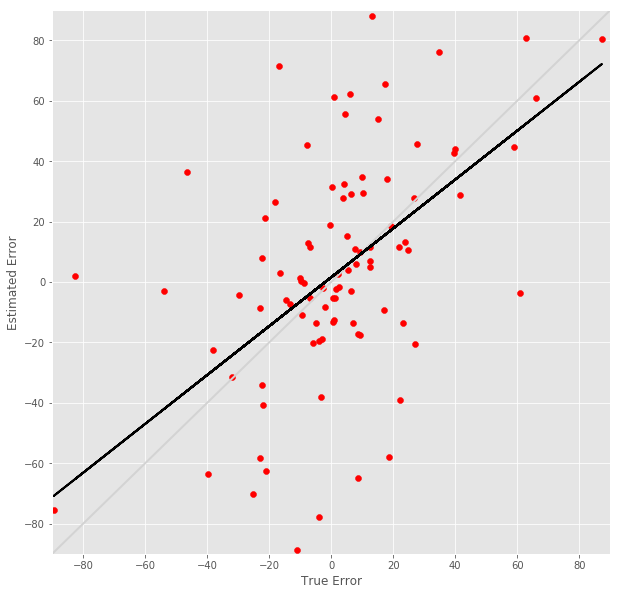

R^2 score for regression on RT: 0.1216
k = 0.5115


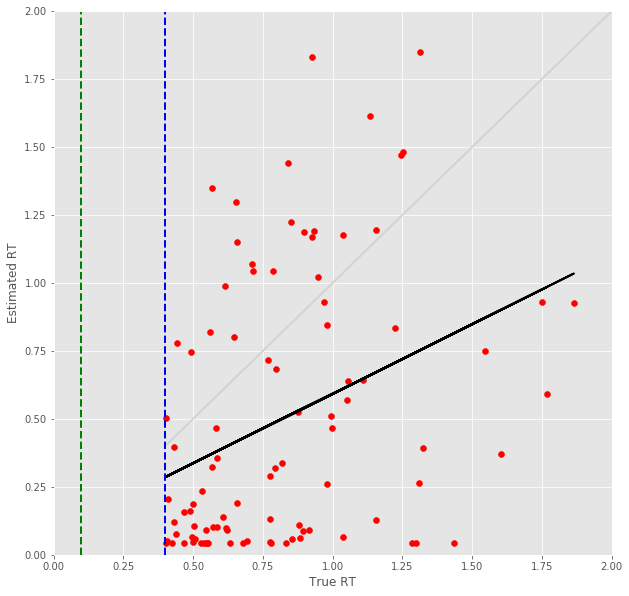

14 -step(s) forecast:
Test Score for 14 -steps forecast: 3.4230 RMSE
Predict Score for 14 -steps forecast: 4.1673 RMSE
Error Test Score for 14 -steps forecast: 0.6957 RMSE
RT Test Score for 14 -steps forecast: 0.7442 RMSE
Error Test Corr for 14 -steps forecast: 0.5142
RT Test Corr for 14 -steps forecast: 0.0628


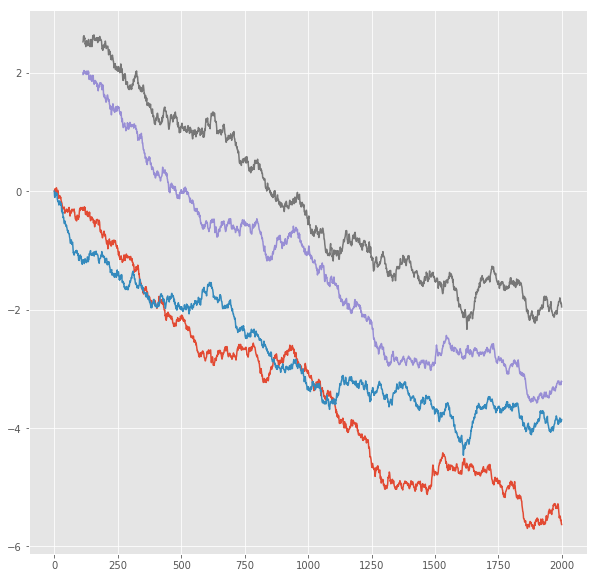

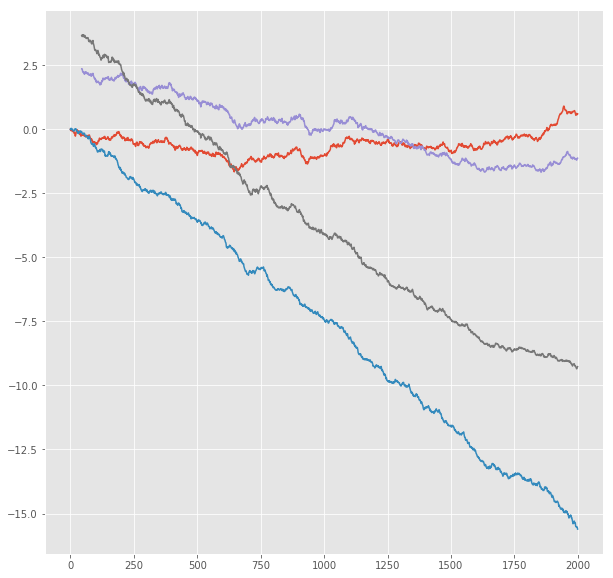

R^2 score for regression on Error: 0.2644
k = 0.8811


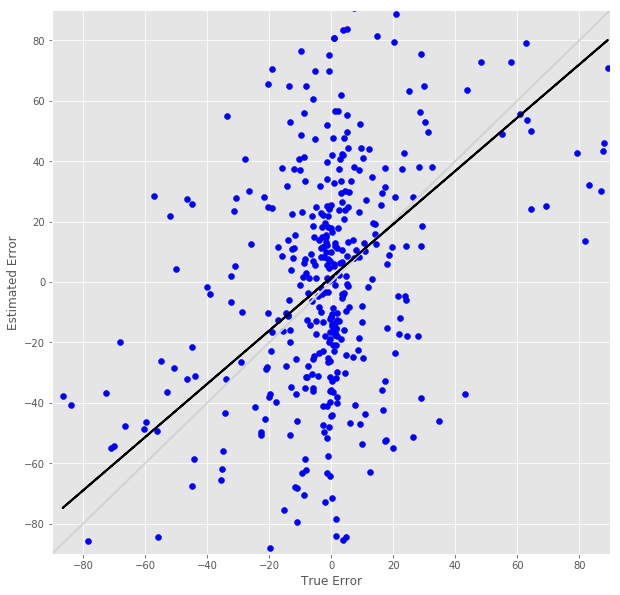

R^2 score for regression on RT: 0.0039
k = 0.0585


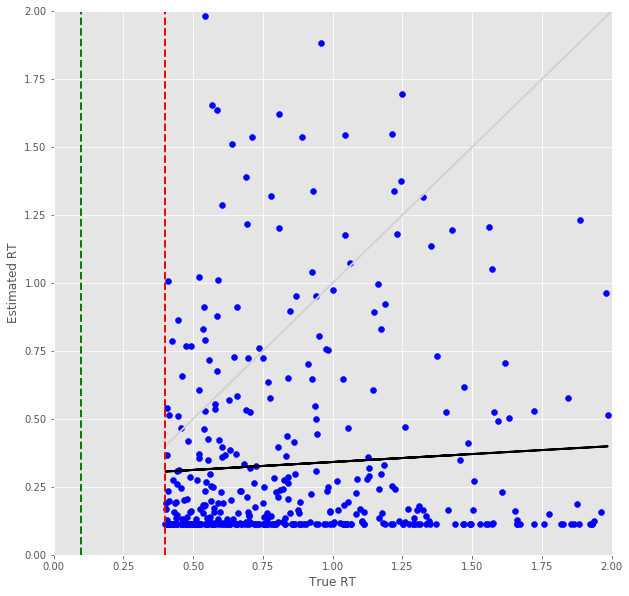

Error Prediction Score: 0.6656 RMSE
RT Prediction Score: 0.6255 RMSE
Error Prediction Corr: 0.5353
RT Prediction Corr: 0.3410
R^2 score for regression on Error: 0.2866
k = 0.8347


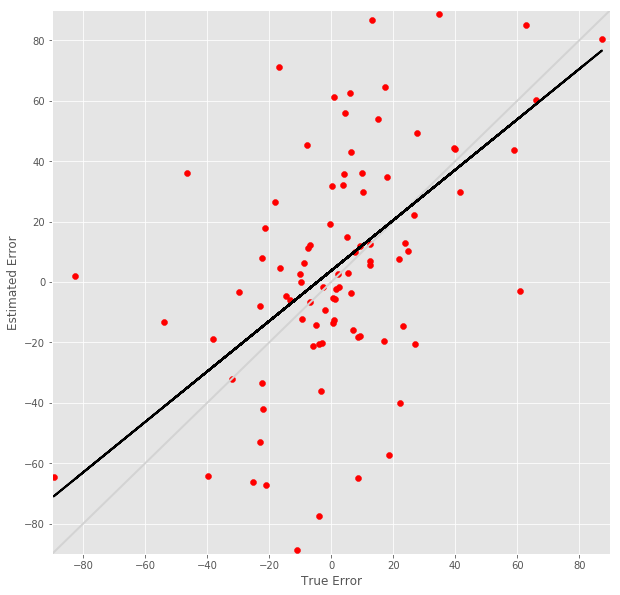

R^2 score for regression on RT: 0.1163
k = 0.5225


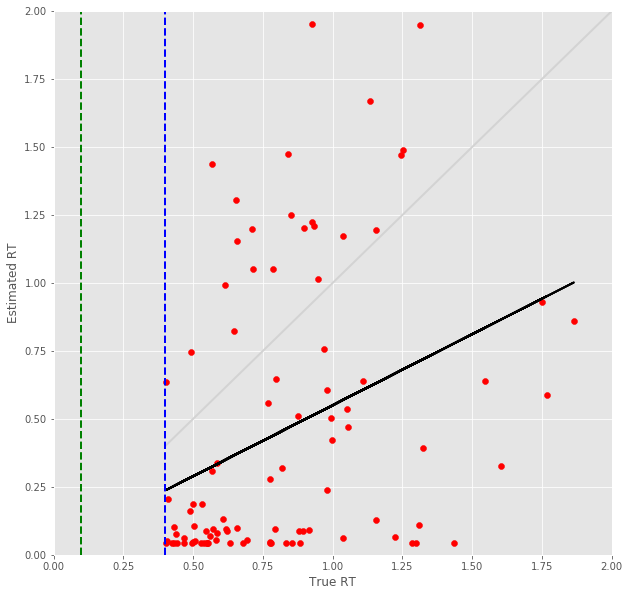

15 -step(s) forecast:
Test Score for 15 -steps forecast: 3.6783 RMSE
Predict Score for 15 -steps forecast: 4.4252 RMSE
Error Test Score for 15 -steps forecast: 0.7148 RMSE
RT Test Score for 15 -steps forecast: 0.7590 RMSE
Error Test Corr for 15 -steps forecast: 0.5131
RT Test Corr for 15 -steps forecast: 0.0493


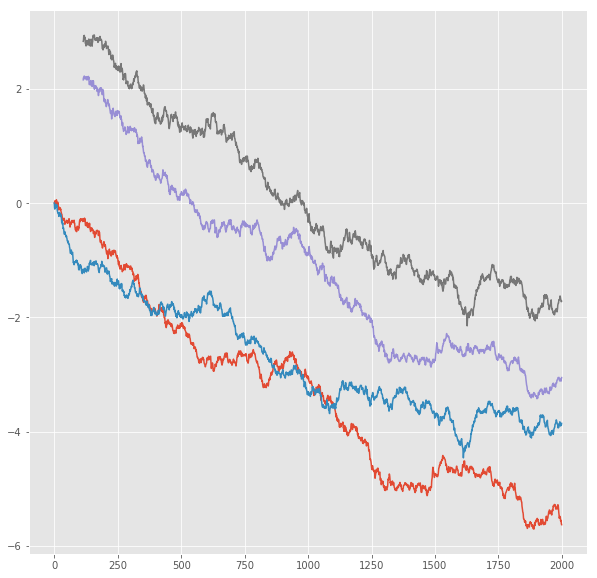

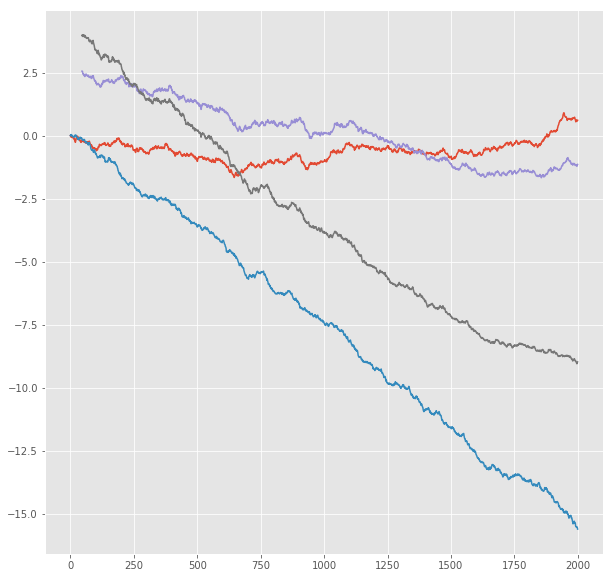

R^2 score for regression on Error: 0.2633
k = 0.9041


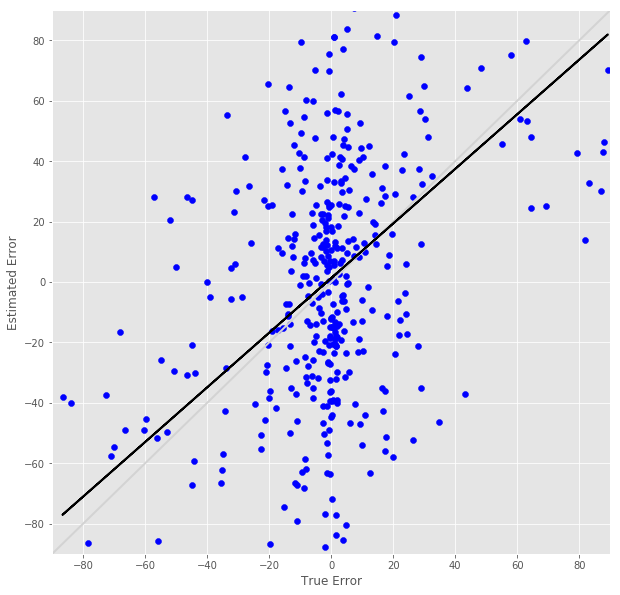

R^2 score for regression on RT: 0.0024
k = 0.0436


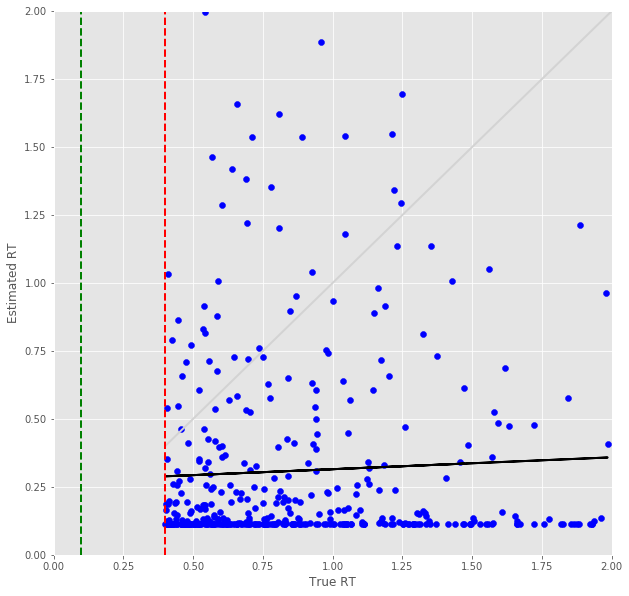

Error Prediction Score: 0.6715 RMSE
RT Prediction Score: 0.6741 RMSE
Error Prediction Corr: 0.5532
RT Prediction Corr: 0.2658
R^2 score for regression on Error: 0.3060
k = 0.8450


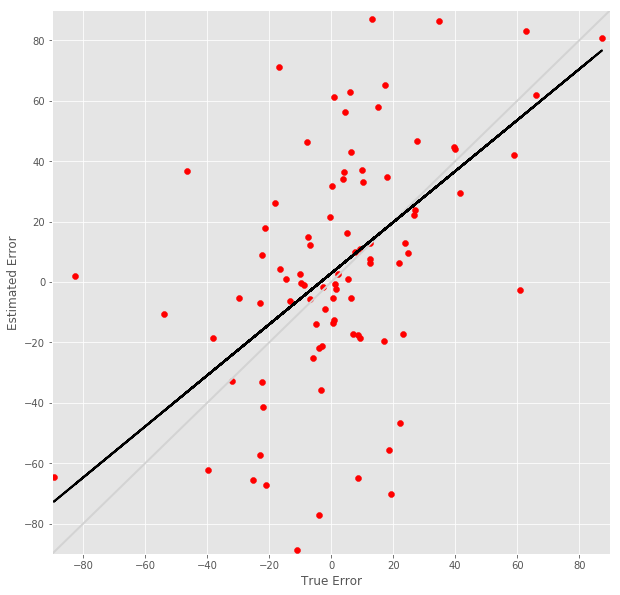

R^2 score for regression on RT: 0.0706
k = 0.4306


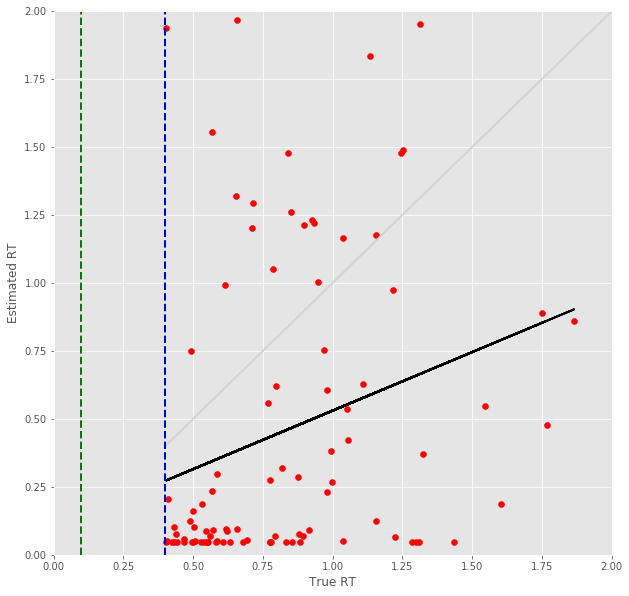

16 -step(s) forecast:
Test Score for 16 -steps forecast: 3.9346 RMSE
Predict Score for 16 -steps forecast: 4.6815 RMSE
Error Test Score for 16 -steps forecast: 0.7306 RMSE
RT Test Score for 16 -steps forecast: 0.7721 RMSE
Error Test Corr for 16 -steps forecast: 0.5030
RT Test Corr for 16 -steps forecast: 0.0574


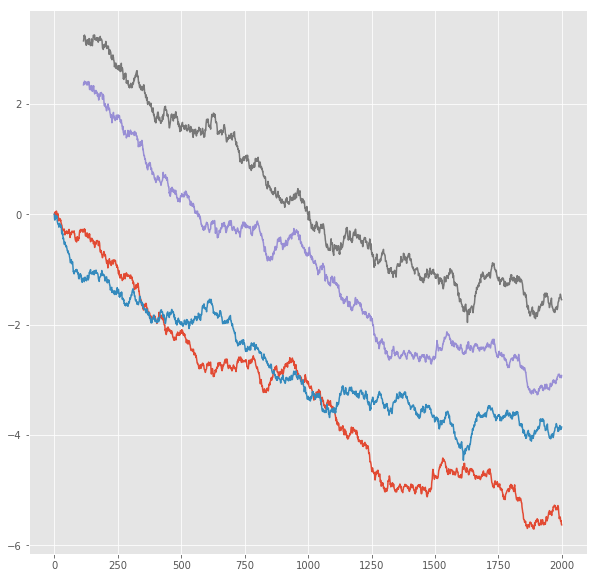

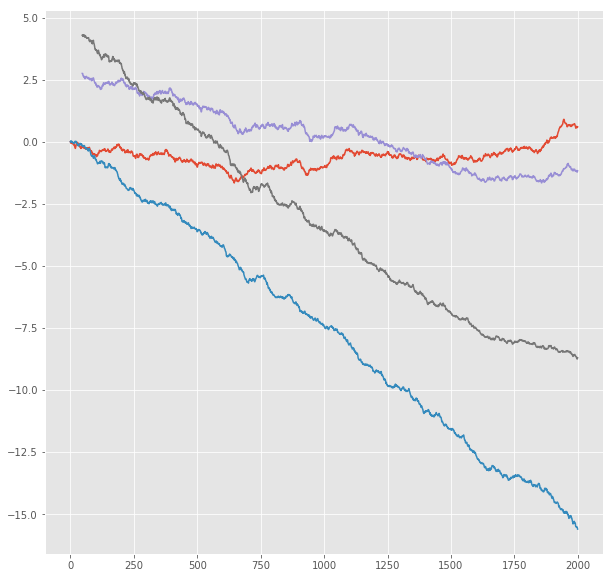

R^2 score for regression on Error: 0.2530
k = 0.9001


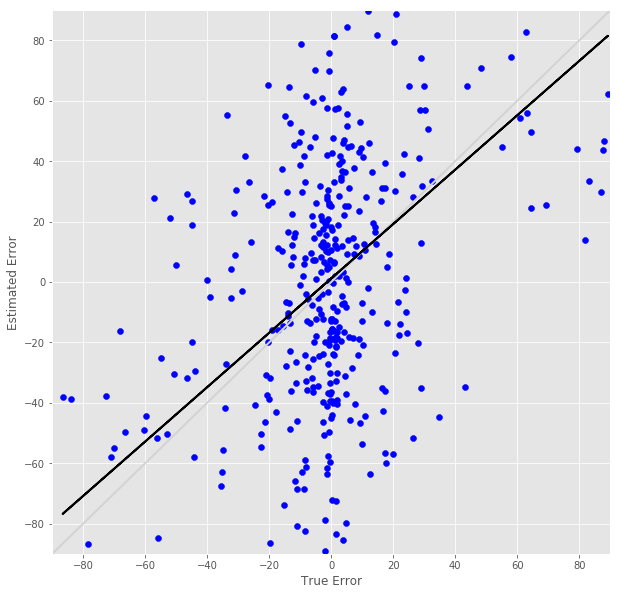

R^2 score for regression on RT: 0.0033
k = 0.0464


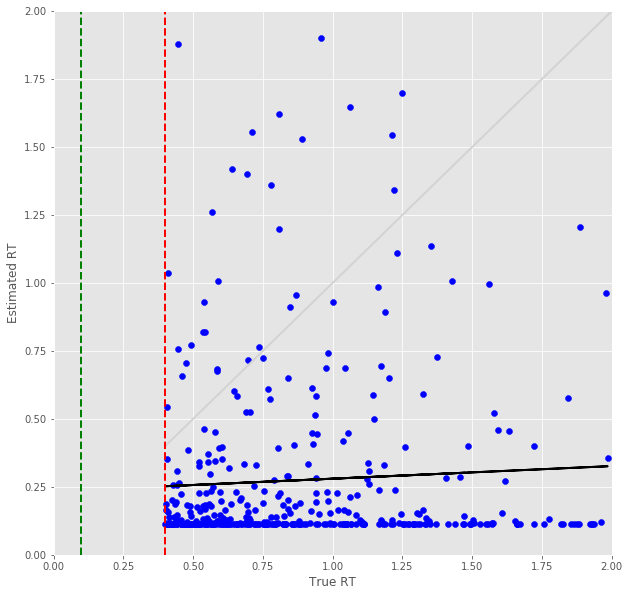

Error Prediction Score: 0.6863 RMSE
RT Prediction Score: 0.6651 RMSE
Error Prediction Corr: 0.5472
RT Prediction Corr: 0.3496
R^2 score for regression on Error: 0.2995
k = 0.8448


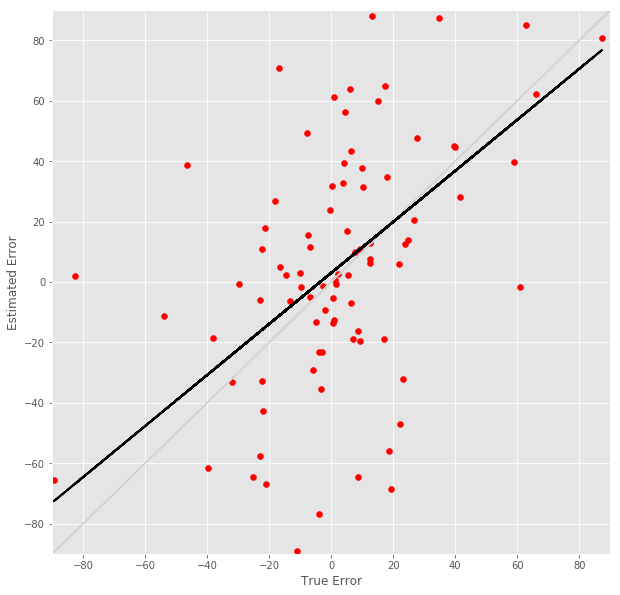

R^2 score for regression on RT: 0.1222
k = 0.5354


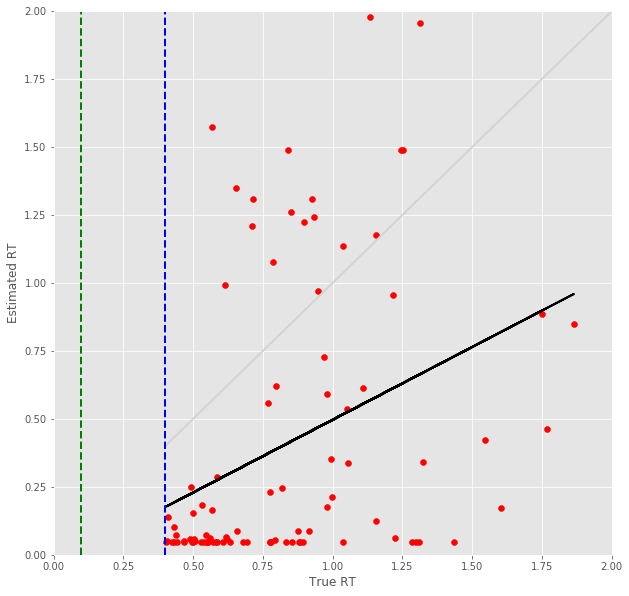

17 -step(s) forecast:
Test Score for 17 -steps forecast: 4.1916 RMSE
Predict Score for 17 -steps forecast: 4.9362 RMSE
Error Test Score for 17 -steps forecast: 0.7413 RMSE
RT Test Score for 17 -steps forecast: 0.7792 RMSE
Error Test Corr for 17 -steps forecast: 0.4989
RT Test Corr for 17 -steps forecast: 0.0878


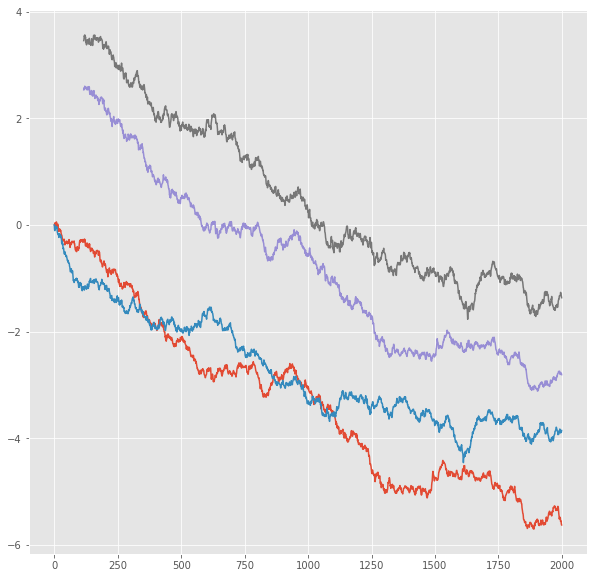

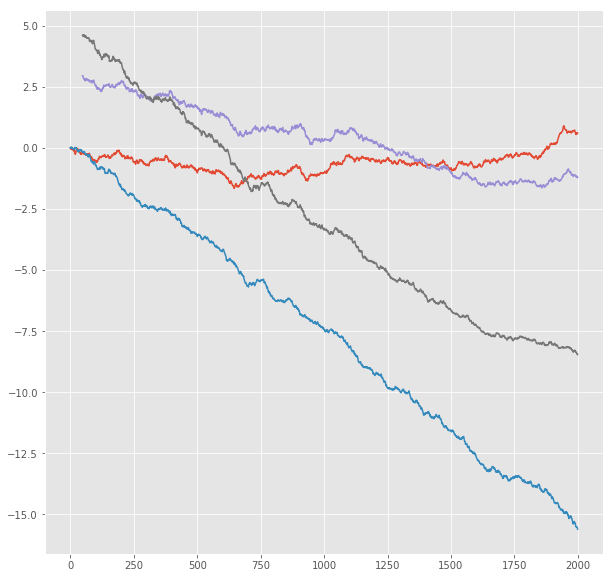

R^2 score for regression on Error: 0.2489
k = 0.9033


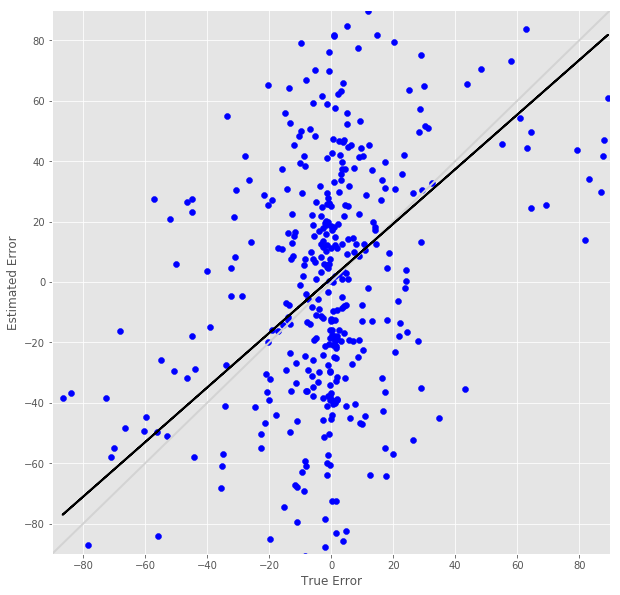

R^2 score for regression on RT: 0.0077
k = 0.0643


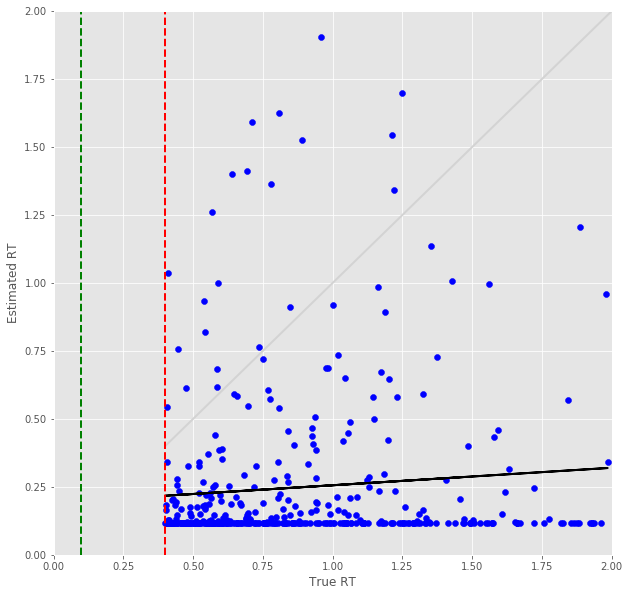

Error Prediction Score: 0.7218 RMSE
RT Prediction Score: 0.6788 RMSE
Error Prediction Corr: 0.5168
RT Prediction Corr: 0.3498
R^2 score for regression on Error: 0.2671
k = 0.8195


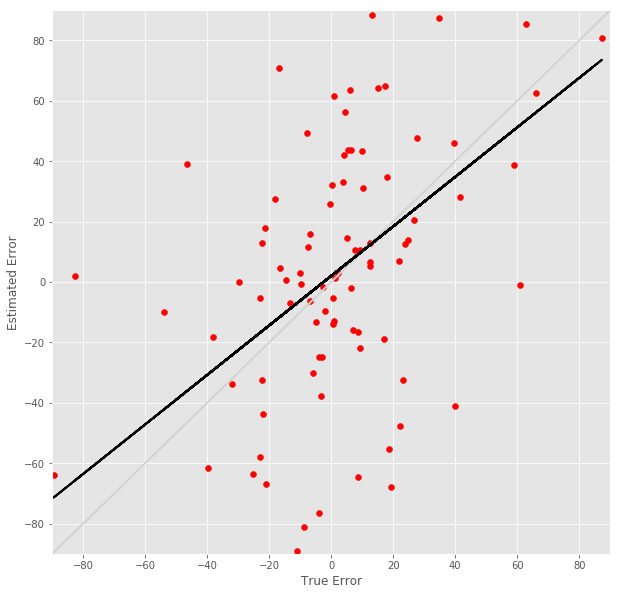

R^2 score for regression on RT: 0.1223
k = 0.4945


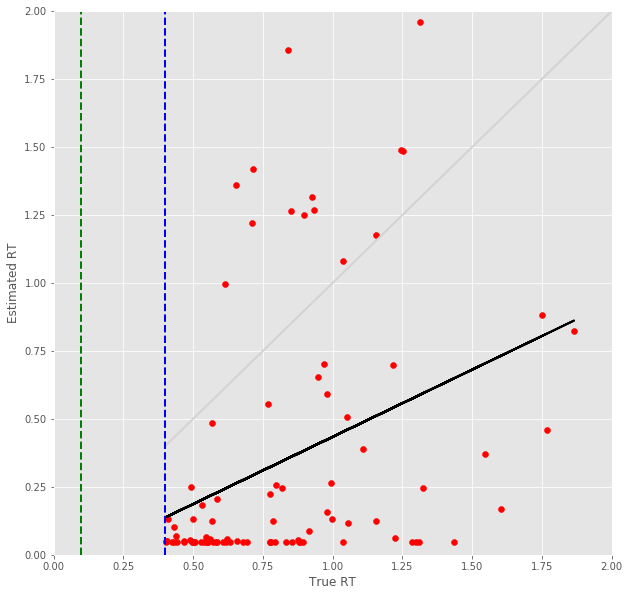

18 -step(s) forecast:
Test Score for 18 -steps forecast: 4.4489 RMSE
Predict Score for 18 -steps forecast: 5.1893 RMSE
Error Test Score for 18 -steps forecast: 0.7608 RMSE
RT Test Score for 18 -steps forecast: 0.7952 RMSE
Error Test Corr for 18 -steps forecast: 0.4843
RT Test Corr for 18 -steps forecast: 0.0395


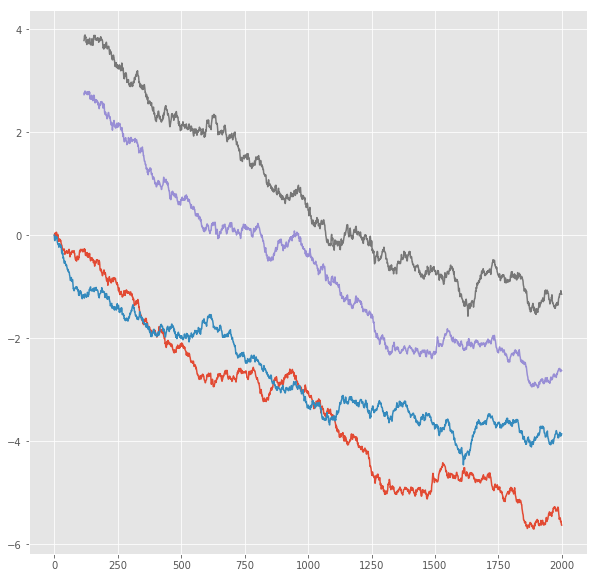

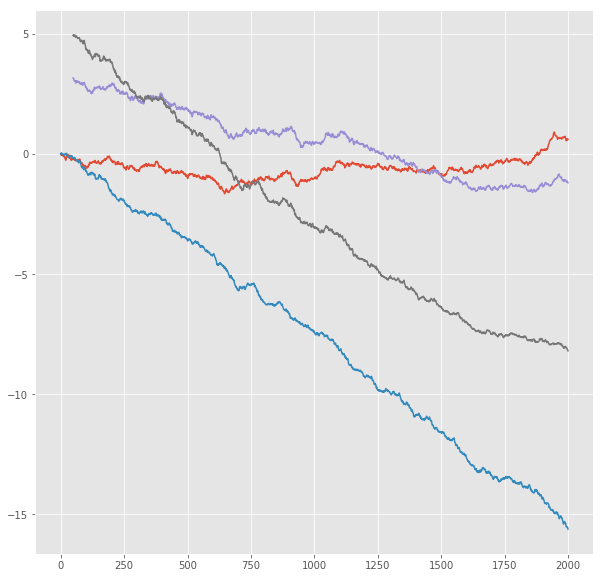

R^2 score for regression on Error: 0.2345
k = 0.8932


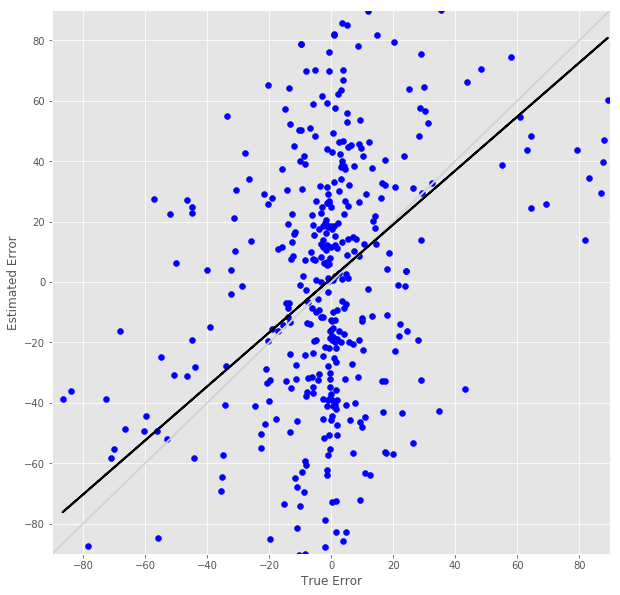

R^2 score for regression on RT: 0.0016
k = 0.0254


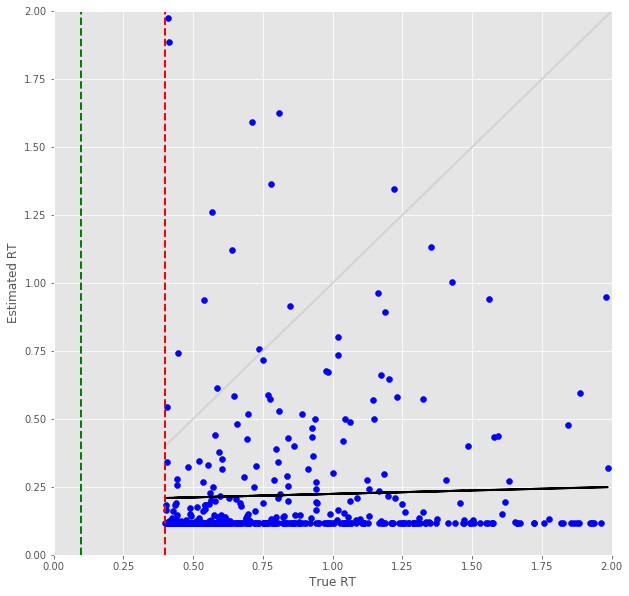

Error Prediction Score: 0.7697 RMSE
RT Prediction Score: 0.7235 RMSE
Error Prediction Corr: 0.5069
RT Prediction Corr: 0.3035
R^2 score for regression on Error: 0.2570
k = 0.8533


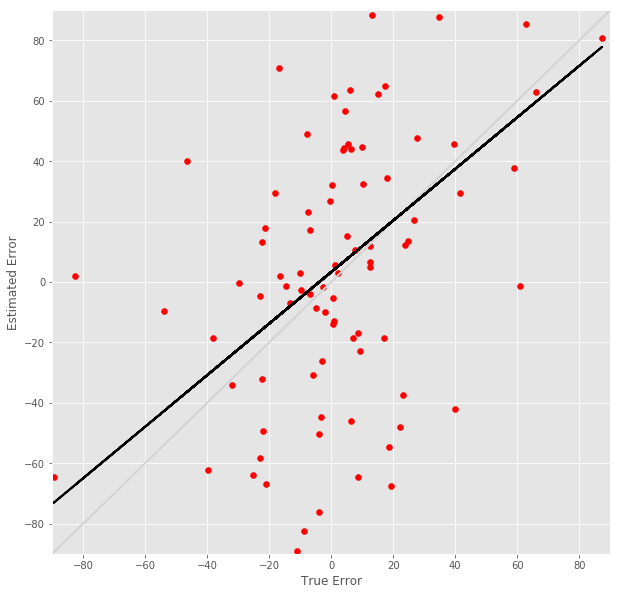

R^2 score for regression on RT: 0.0921
k = 0.3785


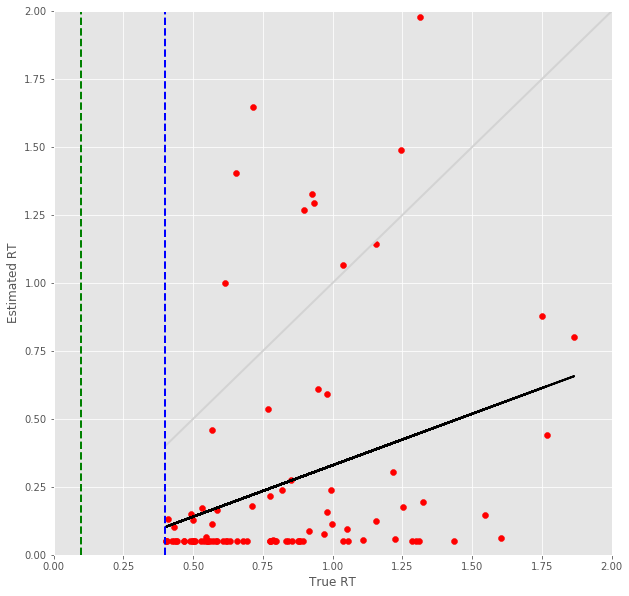

19 -step(s) forecast:
Test Score for 19 -steps forecast: 4.7064 RMSE
Predict Score for 19 -steps forecast: 5.4408 RMSE
Error Test Score for 19 -steps forecast: 0.7747 RMSE
RT Test Score for 19 -steps forecast: 0.8042 RMSE
Error Test Corr for 19 -steps forecast: 0.4791
RT Test Corr for 19 -steps forecast: 0.0274


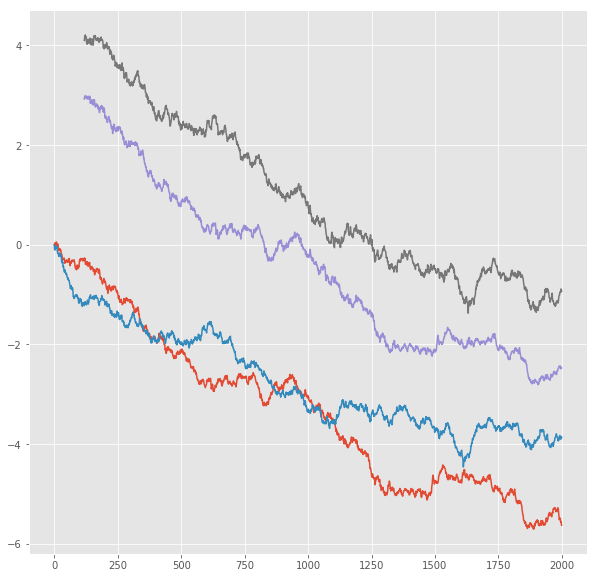

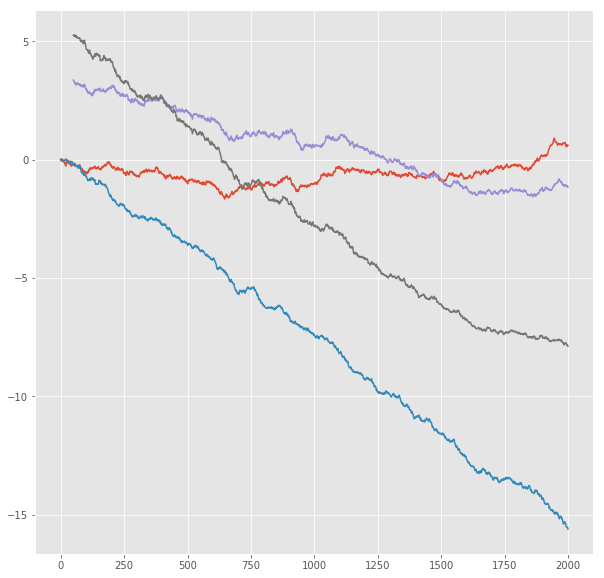

R^2 score for regression on Error: 0.2295
k = 0.9015


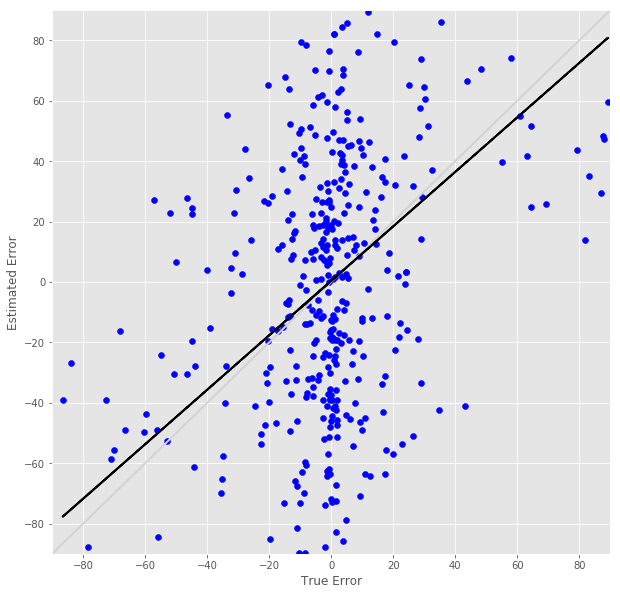

R^2 score for regression on RT: 0.0008
k = 0.0161


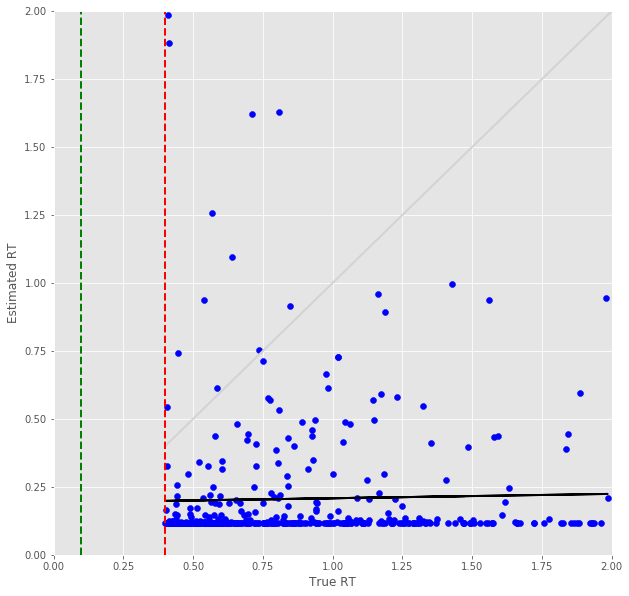

Error Prediction Score: 0.7850 RMSE
RT Prediction Score: 0.7519 RMSE
Error Prediction Corr: 0.5027
RT Prediction Corr: 0.2653
R^2 score for regression on Error: 0.2527
k = 0.8622


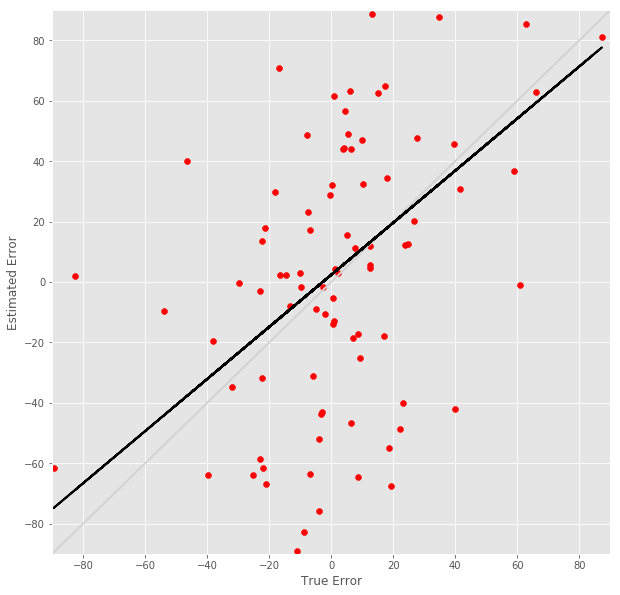

R^2 score for regression on RT: 0.0704
k = 0.3015


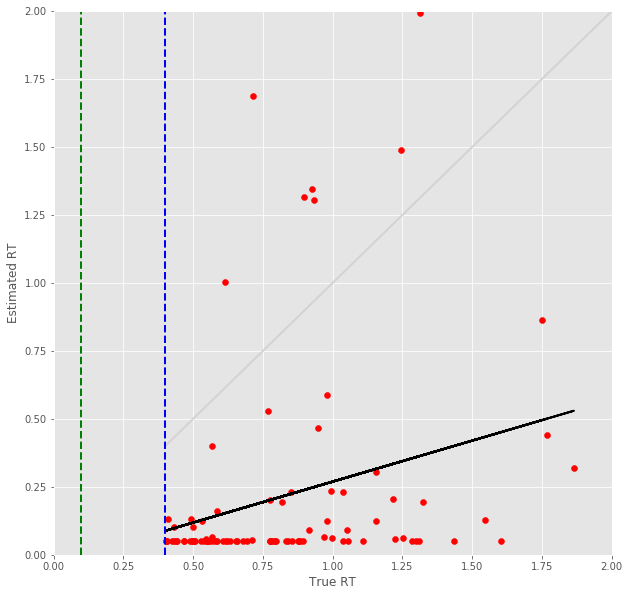

20 -step(s) forecast:
Test Score for 20 -steps forecast: 4.9638 RMSE
Predict Score for 20 -steps forecast: 5.6907 RMSE
Error Test Score for 20 -steps forecast: 0.7828 RMSE
RT Test Score for 20 -steps forecast: 0.8108 RMSE
Error Test Corr for 20 -steps forecast: 0.4651
RT Test Corr for 20 -steps forecast: -0.0193


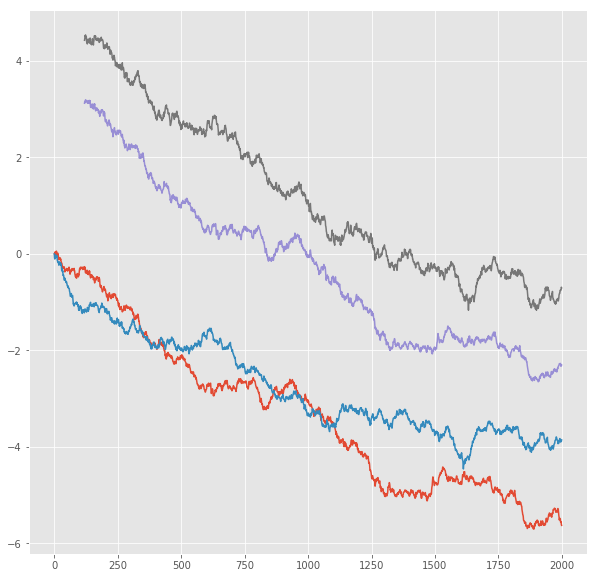

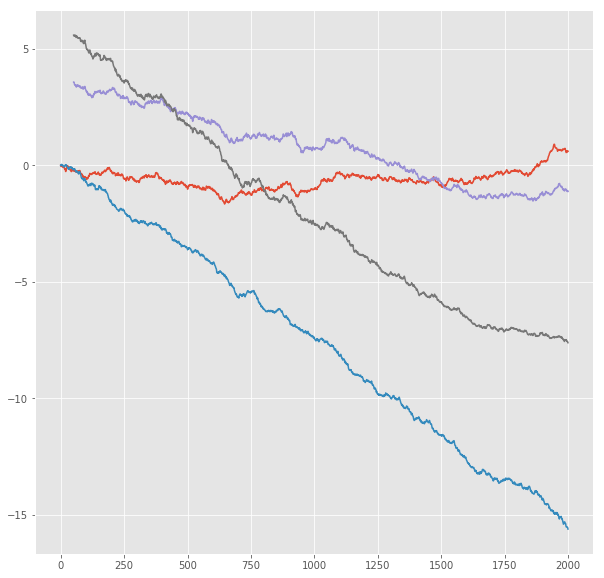

R^2 score for regression on Error: 0.2164
k = 0.8815


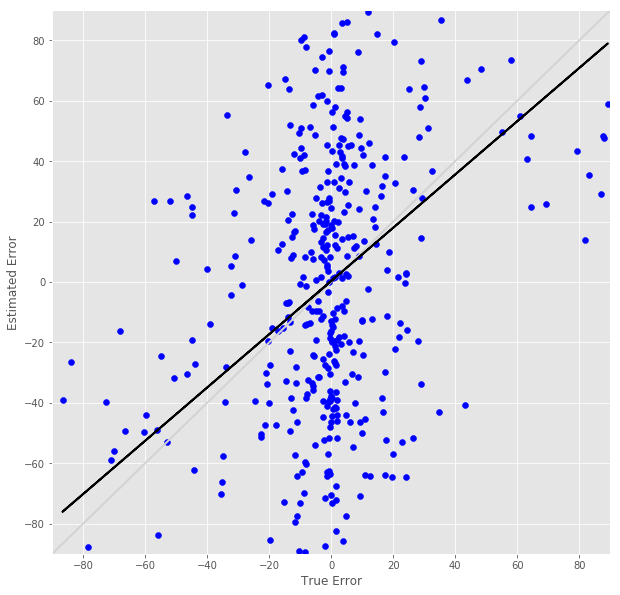

R^2 score for regression on RT: 0.0004
k = -0.0107


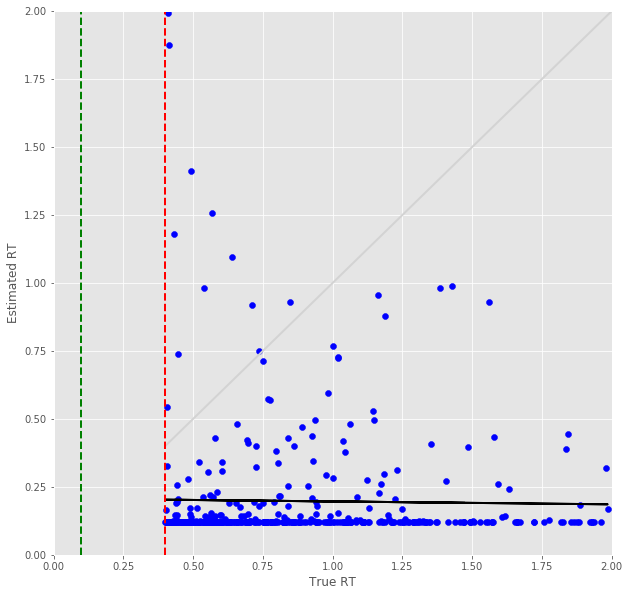

Error Prediction Score: 0.8251 RMSE
RT Prediction Score: 0.7898 RMSE
Error Prediction Corr: 0.4872
RT Prediction Corr: 0.2270
R^2 score for regression on Error: 0.2374
k = 0.8811


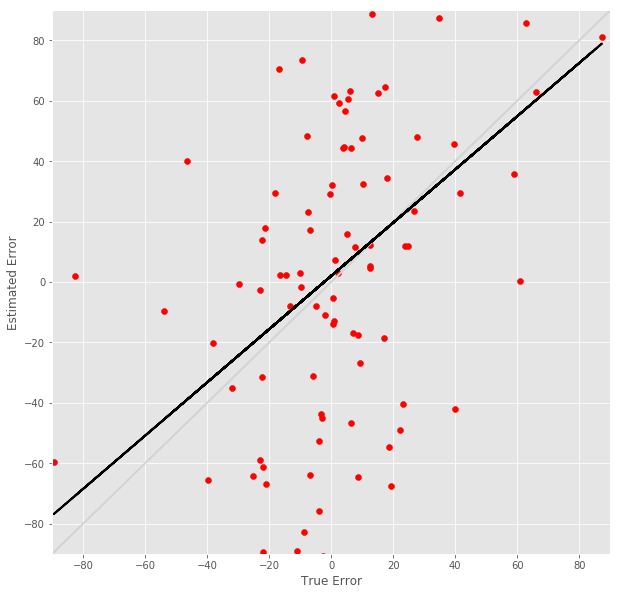

R^2 score for regression on RT: 0.0515
k = 0.2334


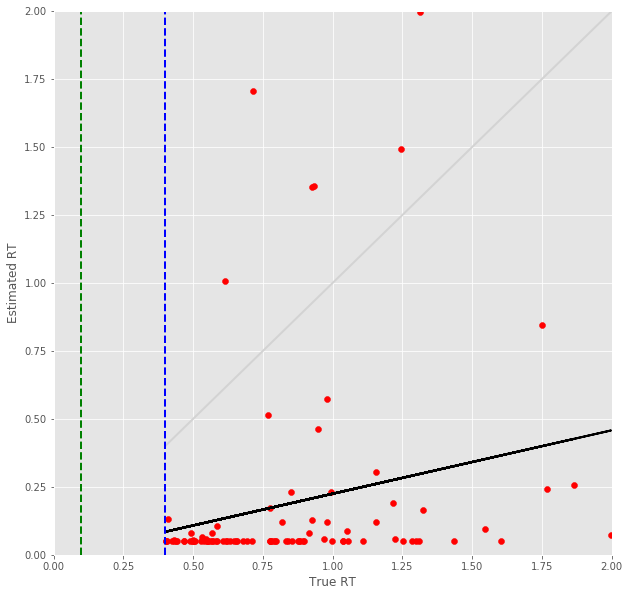

21 -step(s) forecast:
Test Score for 21 -steps forecast: 5.2209 RMSE
Predict Score for 21 -steps forecast: 5.9390 RMSE
Error Test Score for 21 -steps forecast: 0.7962 RMSE
RT Test Score for 21 -steps forecast: 0.8198 RMSE
Error Test Corr for 21 -steps forecast: 0.4612
RT Test Corr for 21 -steps forecast: -0.0590


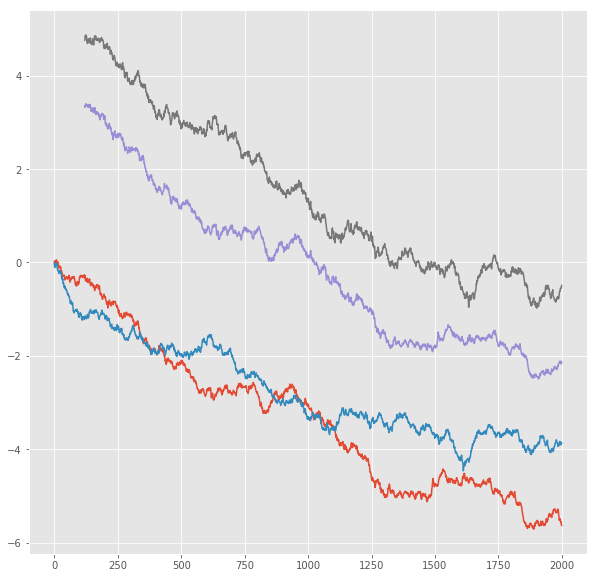

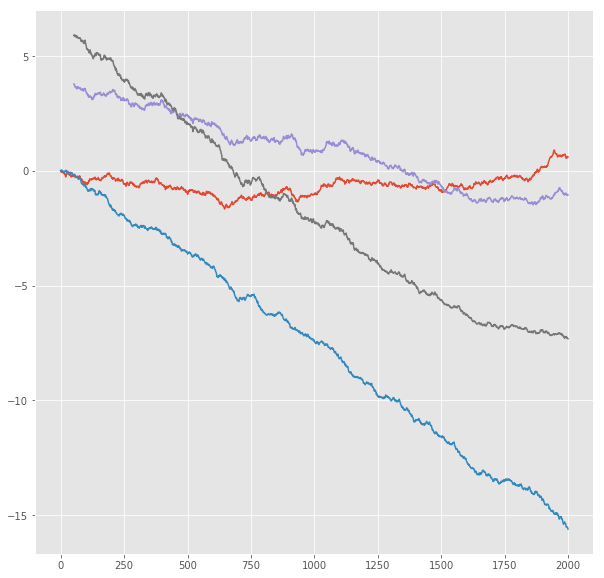

R^2 score for regression on Error: 0.2127
k = 0.8938


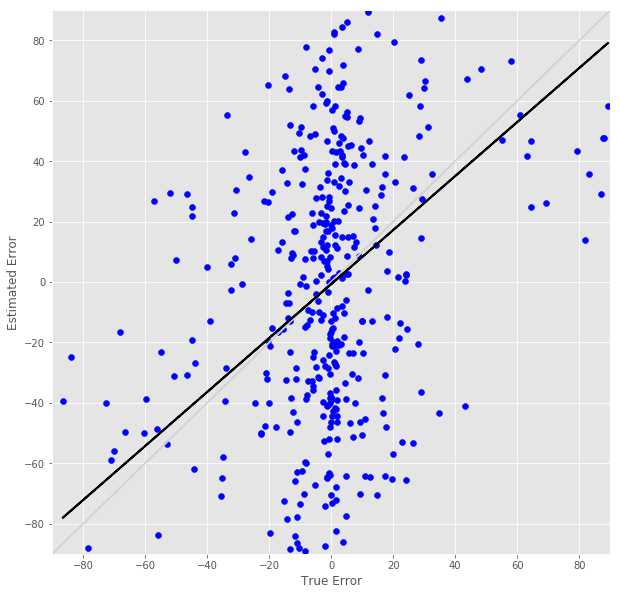

R^2 score for regression on RT: 0.0035
k = -0.0331


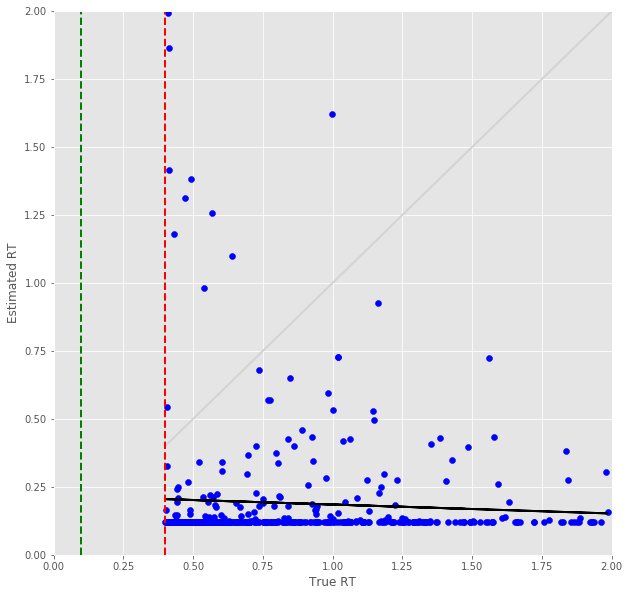

Error Prediction Score: 0.8436 RMSE
RT Prediction Score: 0.8061 RMSE
Error Prediction Corr: 0.4856
RT Prediction Corr: 0.1740
R^2 score for regression on Error: 0.2358
k = 0.8933


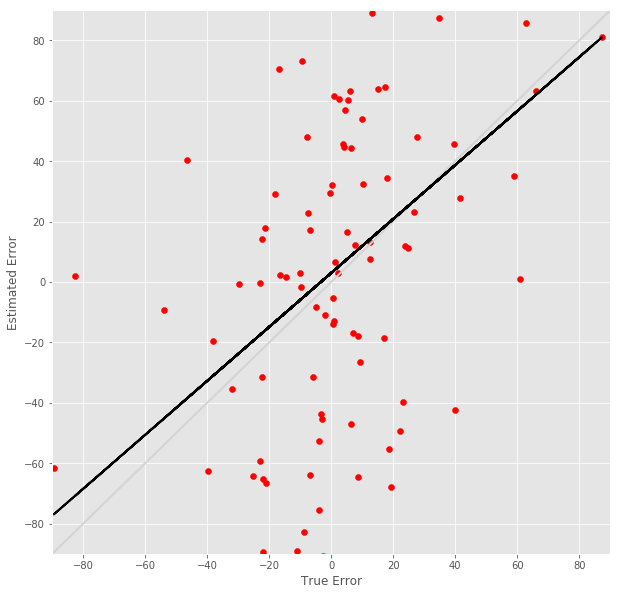

R^2 score for regression on RT: 0.0303
k = 0.1466


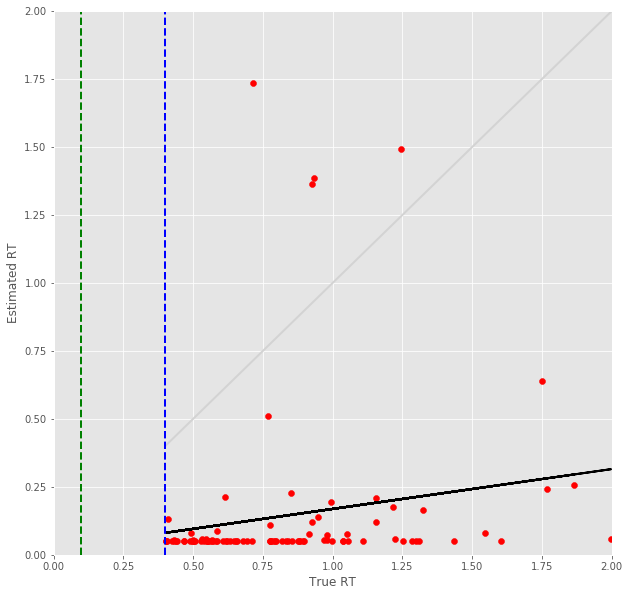

22 -step(s) forecast:
Test Score for 22 -steps forecast: 5.4773 RMSE
Predict Score for 22 -steps forecast: 6.1855 RMSE
Error Test Score for 22 -steps forecast: 0.8008 RMSE
RT Test Score for 22 -steps forecast: 0.8168 RMSE
Error Test Corr for 22 -steps forecast: 0.4585
RT Test Corr for 22 -steps forecast: -0.0138


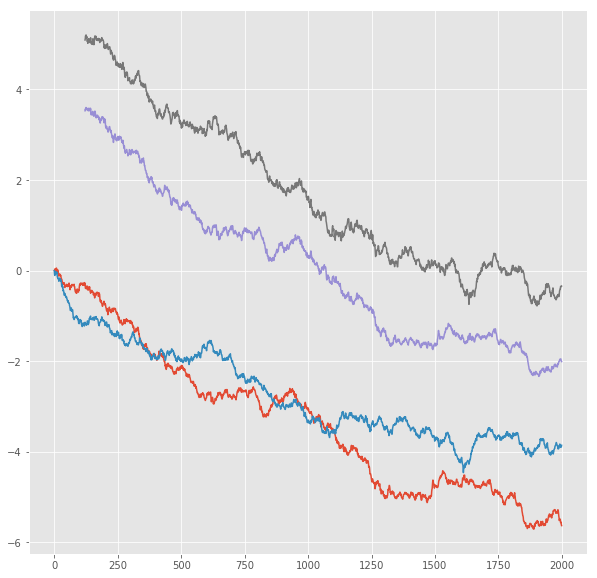

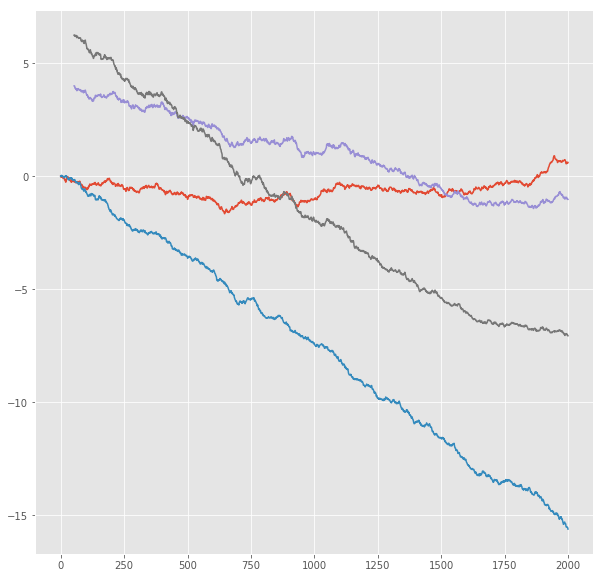

R^2 score for regression on Error: 0.2102
k = 0.8954


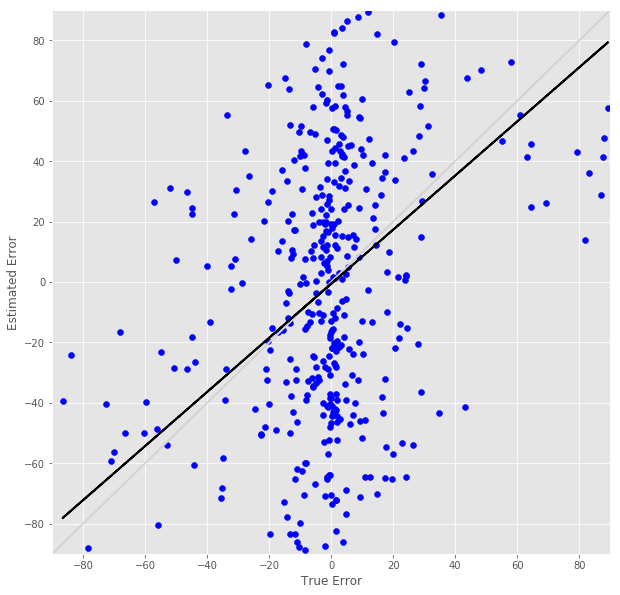

R^2 score for regression on RT: 0.0002
k = -0.0058


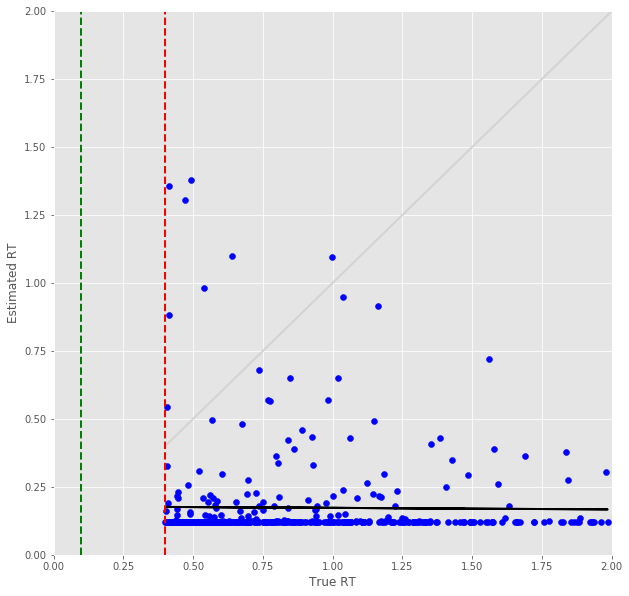

Error Prediction Score: 0.8581 RMSE
RT Prediction Score: 0.8163 RMSE
Error Prediction Corr: 0.4716
RT Prediction Corr: 0.1884
R^2 score for regression on Error: 0.2224
k = 0.8830


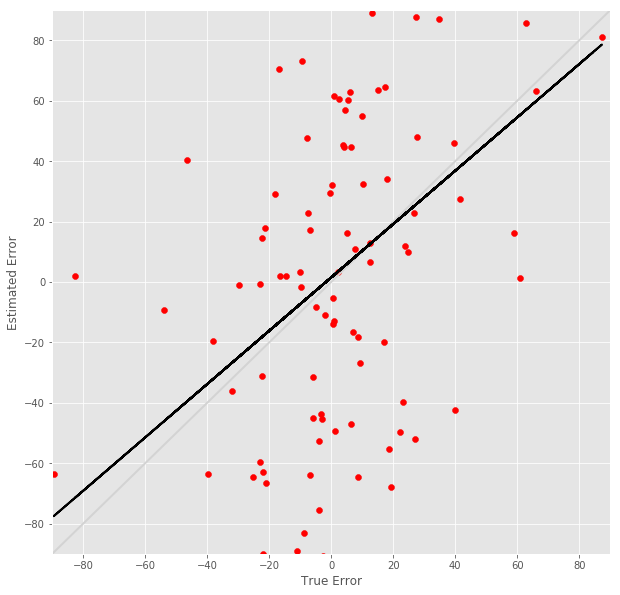

R^2 score for regression on RT: 0.0355
k = 0.1147


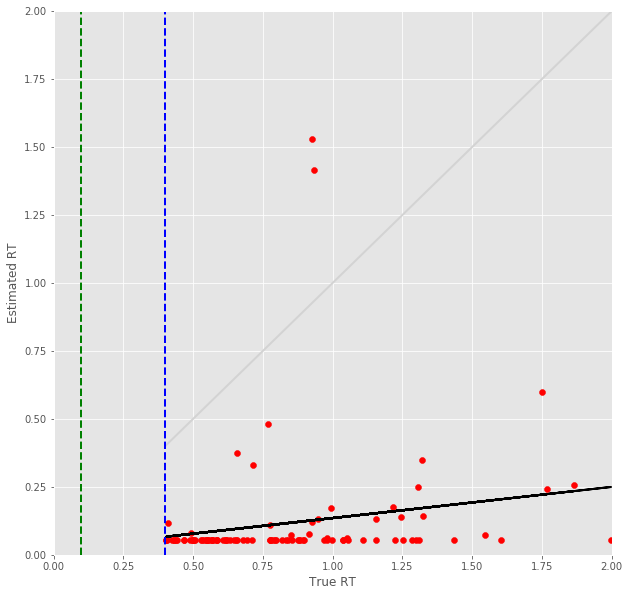

23 -step(s) forecast:
Test Score for 23 -steps forecast: 5.7330 RMSE
Predict Score for 23 -steps forecast: 6.4303 RMSE
Error Test Score for 23 -steps forecast: 0.8095 RMSE
RT Test Score for 23 -steps forecast: 0.8195 RMSE
Error Test Corr for 23 -steps forecast: 0.4544
RT Test Corr for 23 -steps forecast: -0.0139


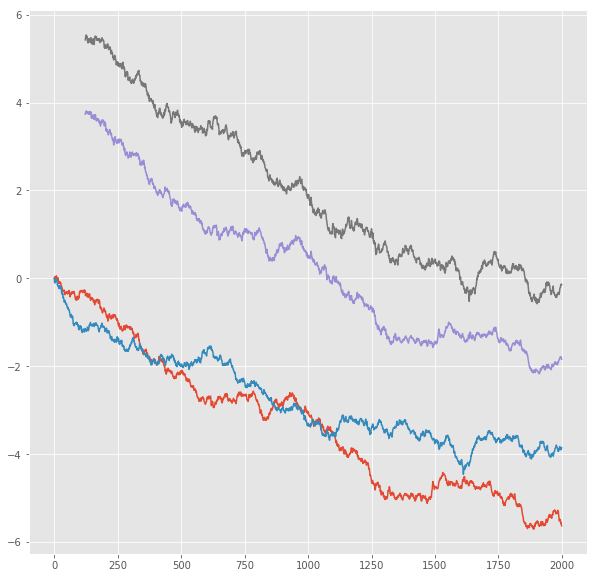

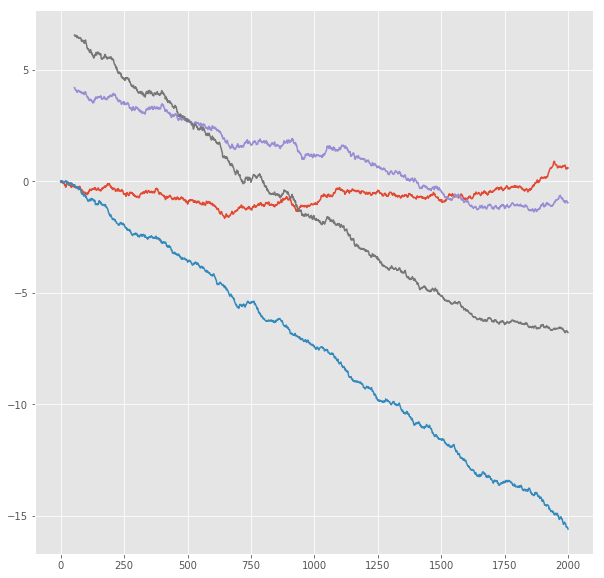

R^2 score for regression on Error: 0.2065
k = 0.9007


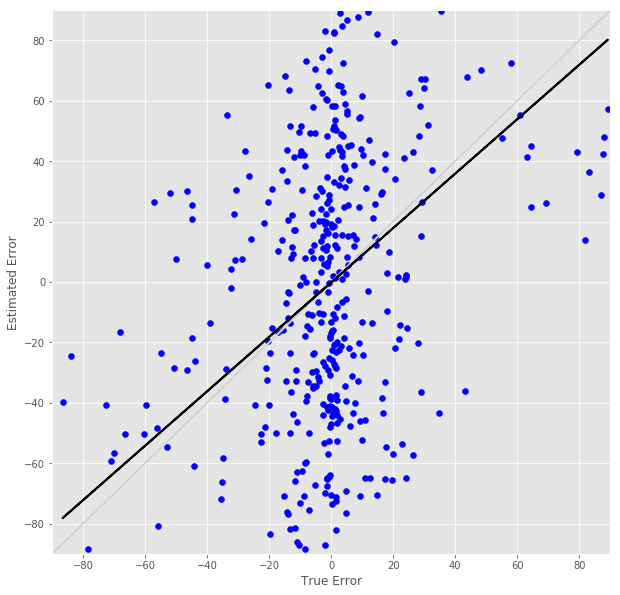

R^2 score for regression on RT: 0.0002
k = -0.0053


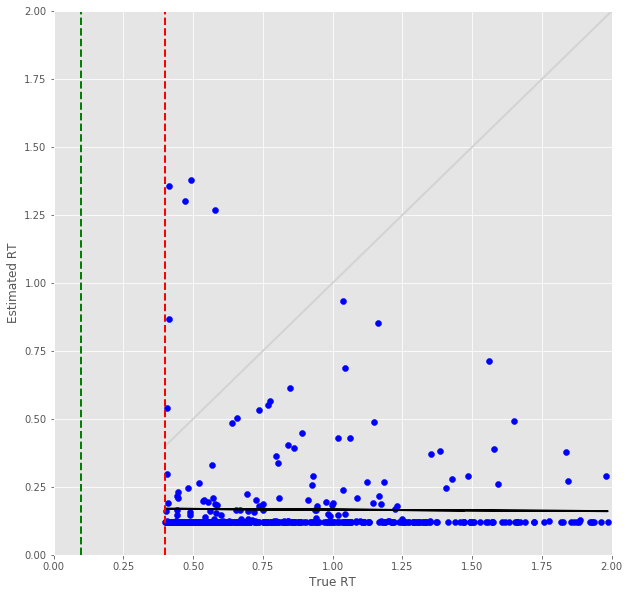

Error Prediction Score: 0.8702 RMSE
RT Prediction Score: 0.8352 RMSE
Error Prediction Corr: 0.4687
RT Prediction Corr: 0.1104
R^2 score for regression on Error: 0.2197
k = 0.8888


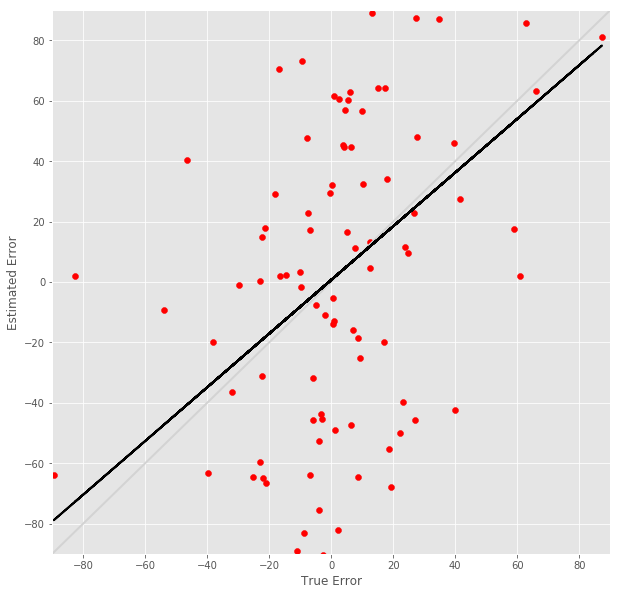

R^2 score for regression on RT: 0.0122
k = 0.0511


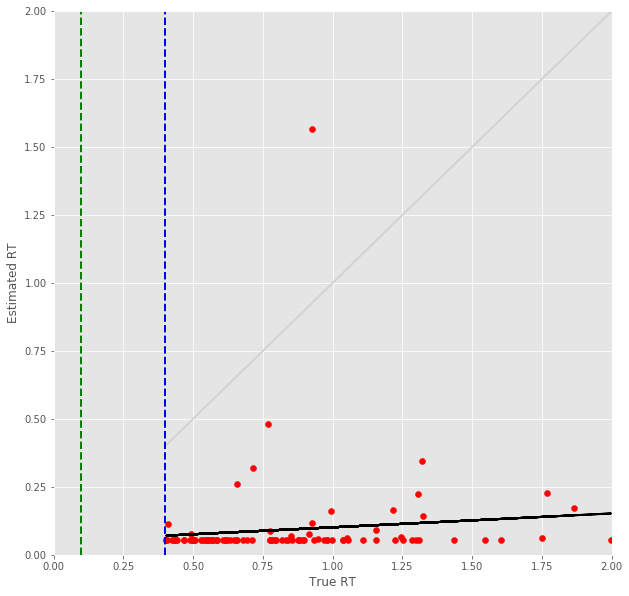

24 -step(s) forecast:
Test Score for 24 -steps forecast: 5.9876 RMSE
Predict Score for 24 -steps forecast: 6.6733 RMSE
Error Test Score for 24 -steps forecast: 0.8272 RMSE
RT Test Score for 24 -steps forecast: 0.8217 RMSE
Error Test Corr for 24 -steps forecast: 0.4373
RT Test Corr for 24 -steps forecast: -0.0115


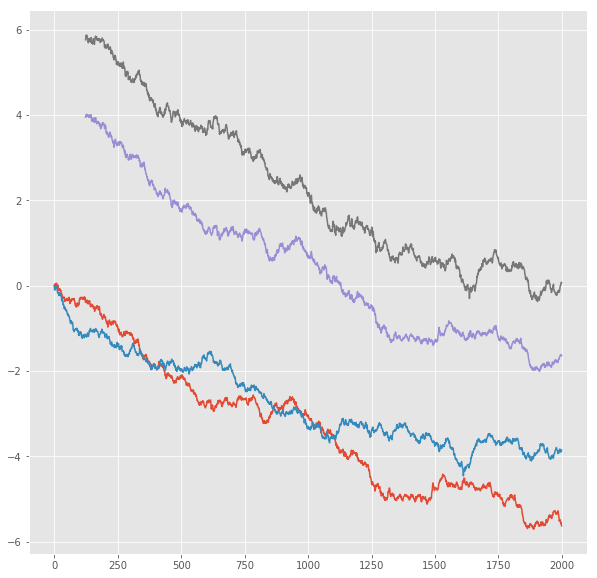

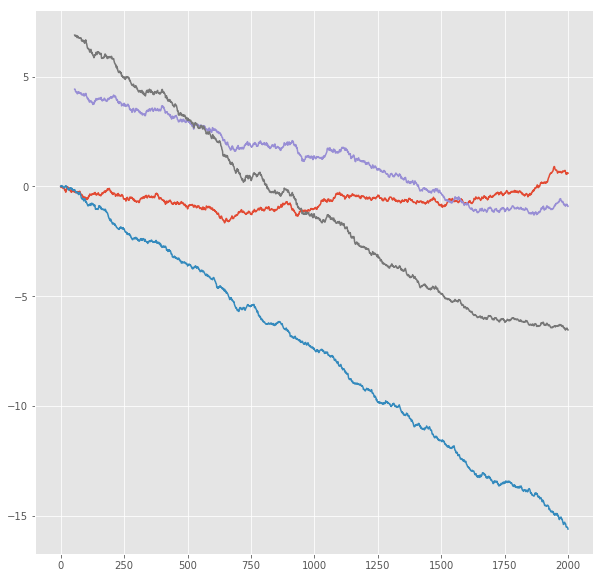

R^2 score for regression on Error: 0.1912
k = 0.8853


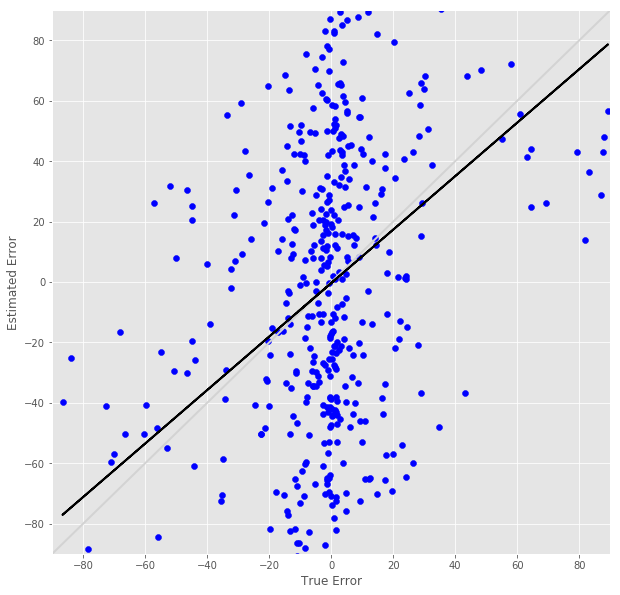

R^2 score for regression on RT: 0.0001
k = -0.0061


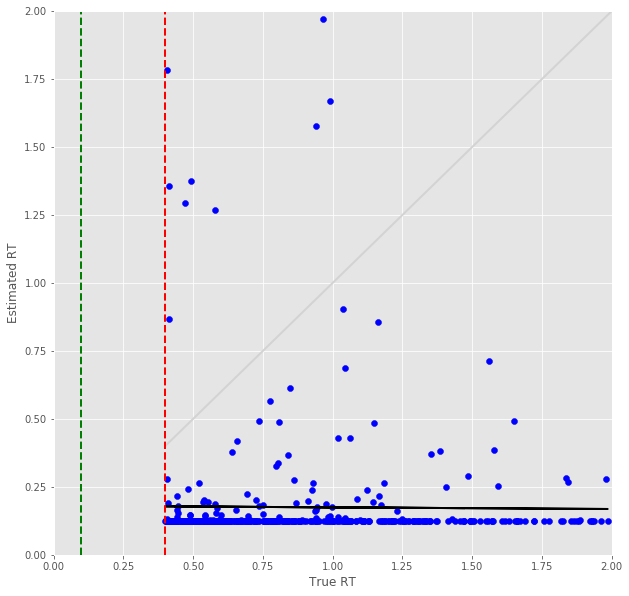

Error Prediction Score: 0.8719 RMSE
RT Prediction Score: 0.8388 RMSE
Error Prediction Corr: 0.4689
RT Prediction Corr: 0.0950
R^2 score for regression on Error: 0.2198
k = 0.8912


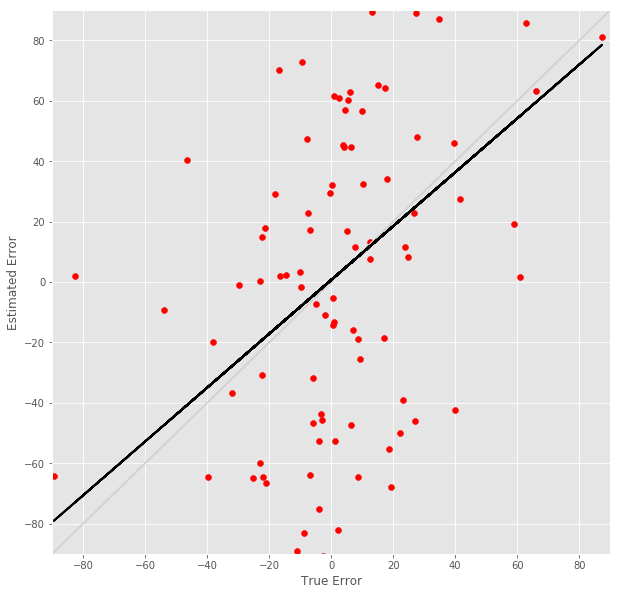

R^2 score for regression on RT: 0.0090
k = 0.0442


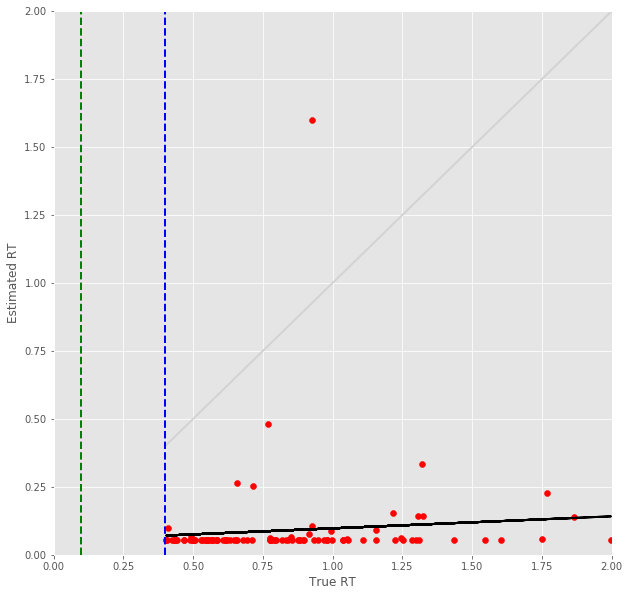

25 -step(s) forecast:
Test Score for 25 -steps forecast: 6.2411 RMSE
Predict Score for 25 -steps forecast: 6.9144 RMSE
Error Test Score for 25 -steps forecast: 0.8371 RMSE
RT Test Score for 25 -steps forecast: 0.8269 RMSE
Error Test Corr for 25 -steps forecast: 0.4212
RT Test Corr for 25 -steps forecast: -0.0470


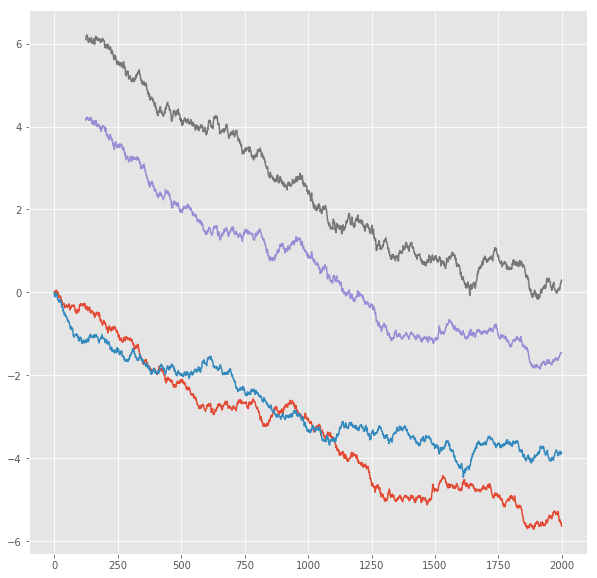

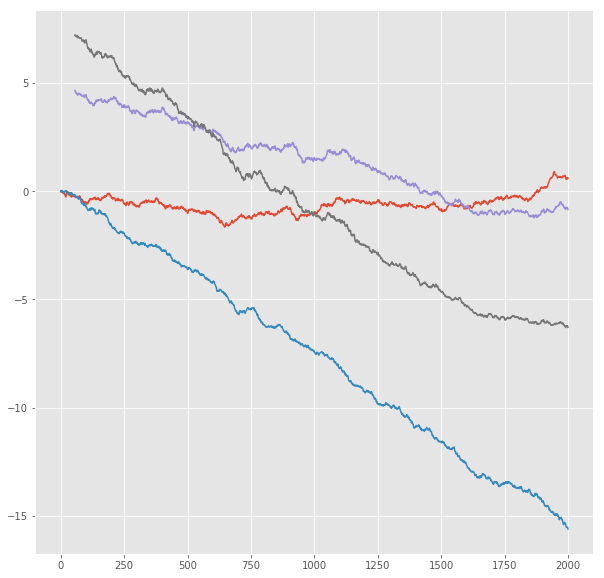

R^2 score for regression on Error: 0.1774
k = 0.8597


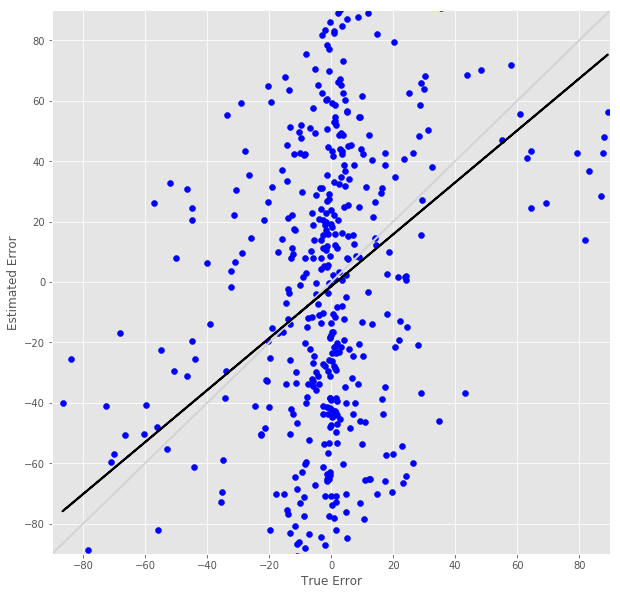

R^2 score for regression on RT: 0.0022
k = -0.0239


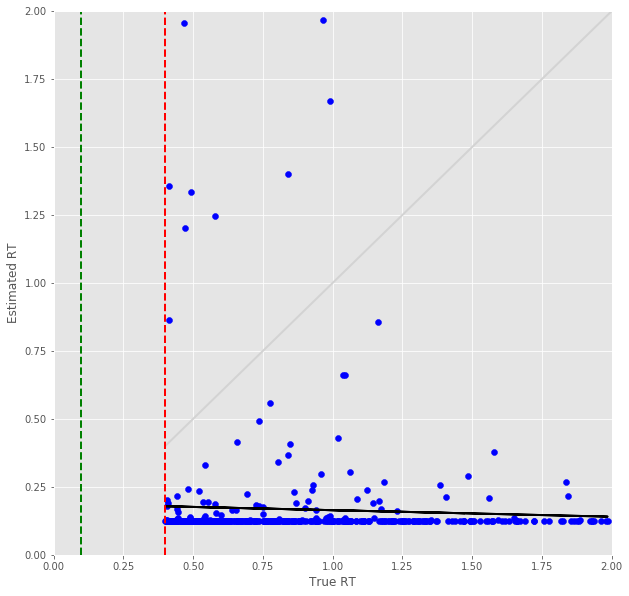

Error Prediction Score: 0.8733 RMSE
RT Prediction Score: 0.8501 RMSE
Error Prediction Corr: 0.4667
RT Prediction Corr: 0.0559
R^2 score for regression on Error: 0.2178
k = 0.8872


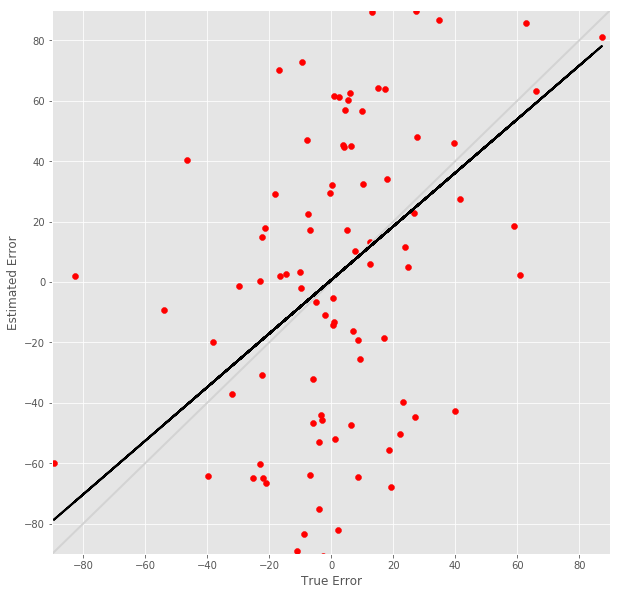

R^2 score for regression on RT: 0.0031
k = 0.0306


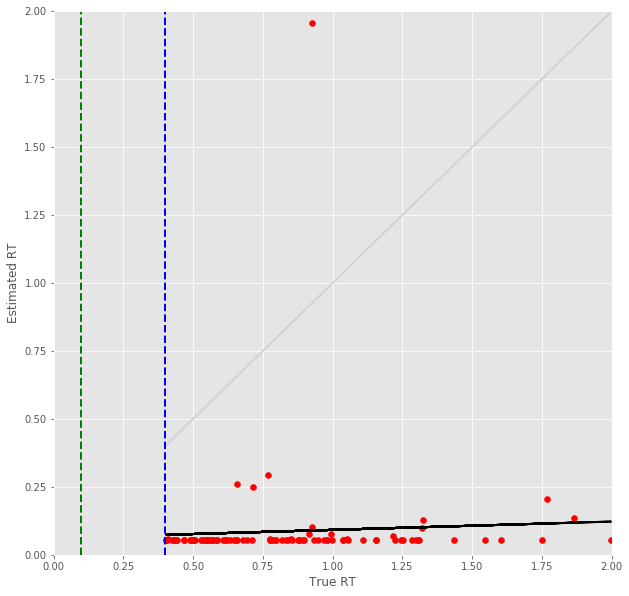

26 -step(s) forecast:
Test Score for 26 -steps forecast: 6.4932 RMSE
Predict Score for 26 -steps forecast: 7.1536 RMSE
Error Test Score for 26 -steps forecast: 0.8419 RMSE
RT Test Score for 26 -steps forecast: 0.8247 RMSE
Error Test Corr for 26 -steps forecast: 0.4184
RT Test Corr for 26 -steps forecast: -0.0505


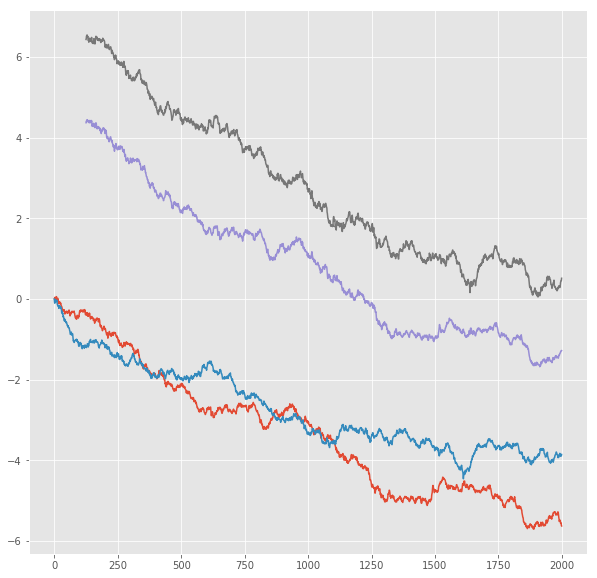

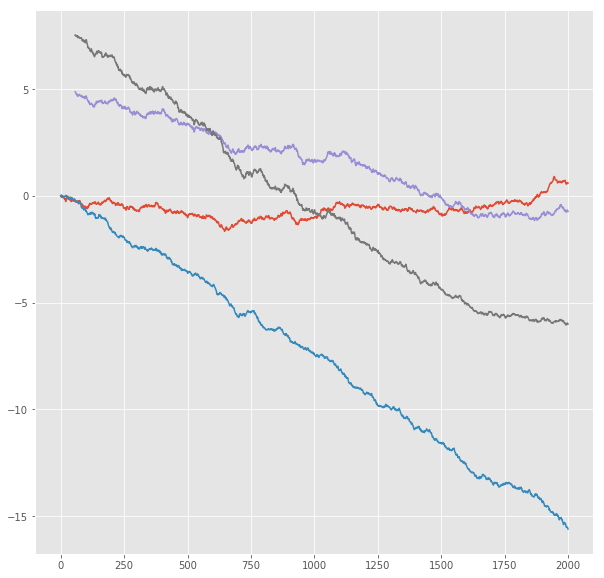

R^2 score for regression on Error: 0.1751
k = 0.8606


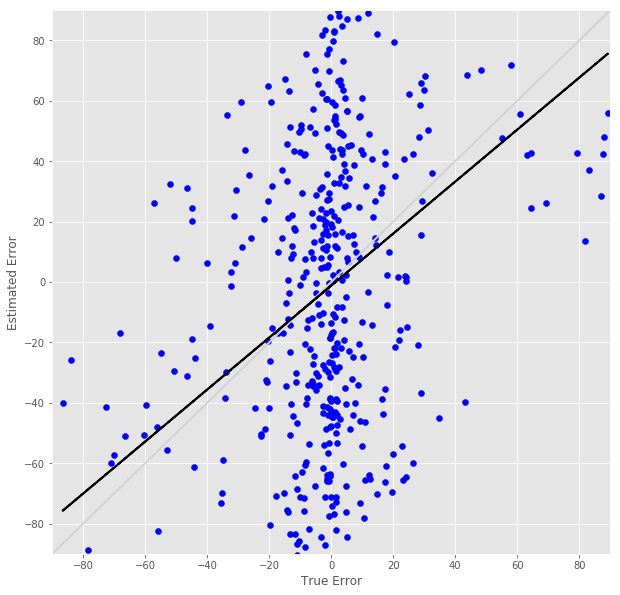

R^2 score for regression on RT: 0.0026
k = -0.0200


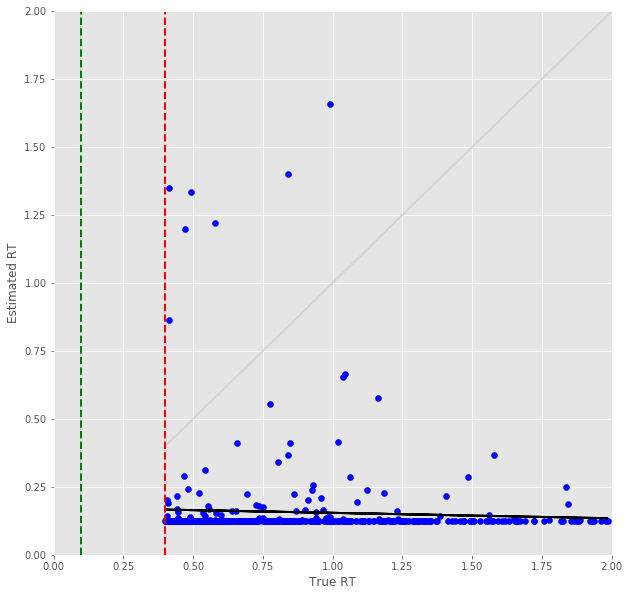

Error Prediction Score: 0.8961 RMSE
RT Prediction Score: 0.8579 RMSE
Error Prediction Corr: 0.4469
RT Prediction Corr: 0.1071
R^2 score for regression on Error: 0.1997
k = 0.8687


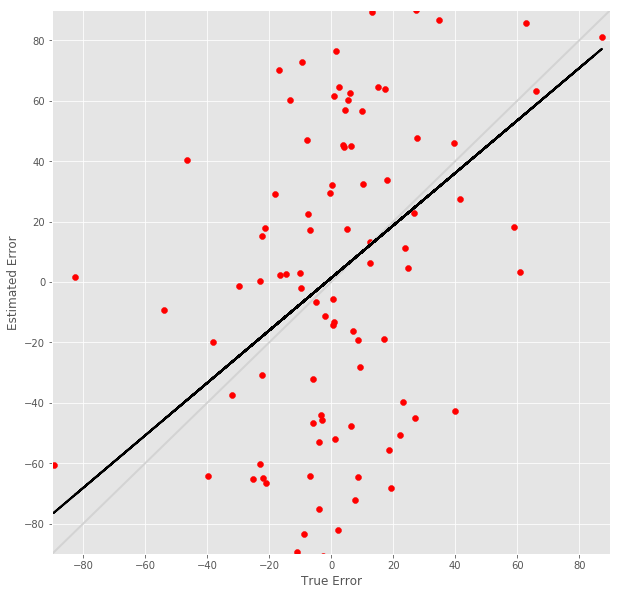

R^2 score for regression on RT: 0.0115
k = 0.0112


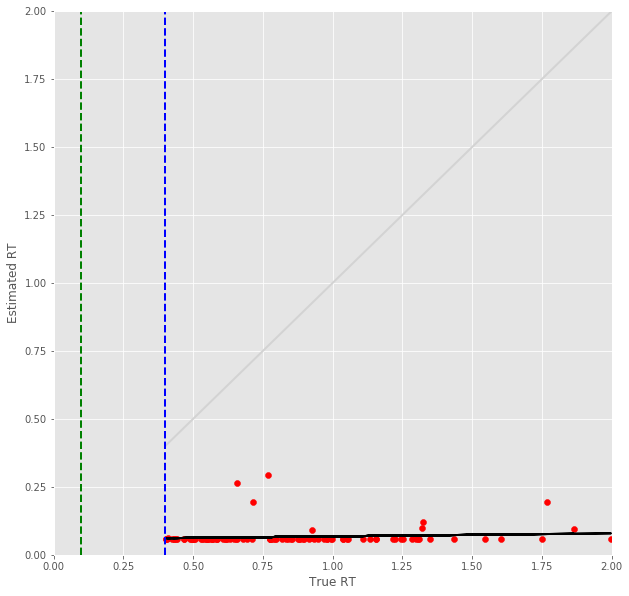

27 -step(s) forecast:
Test Score for 27 -steps forecast: 6.7438 RMSE
Predict Score for 27 -steps forecast: 7.3908 RMSE
Error Test Score for 27 -steps forecast: 0.8453 RMSE
RT Test Score for 27 -steps forecast: 0.8267 RMSE
Error Test Corr for 27 -steps forecast: 0.4137
RT Test Corr for 27 -steps forecast: -0.0409


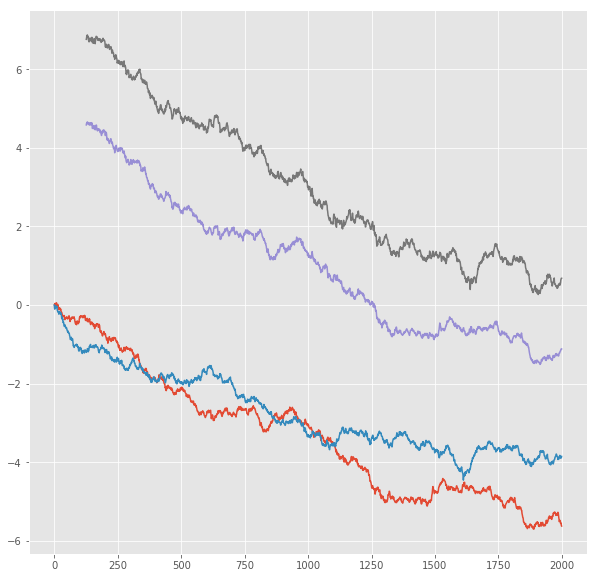

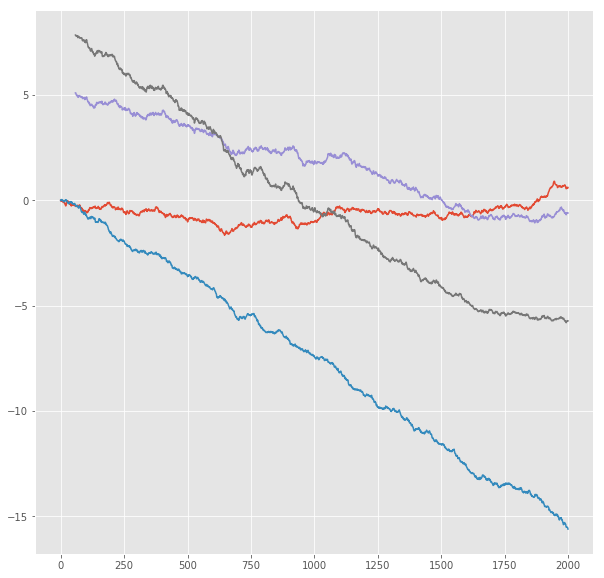

R^2 score for regression on Error: 0.1712
k = 0.8542


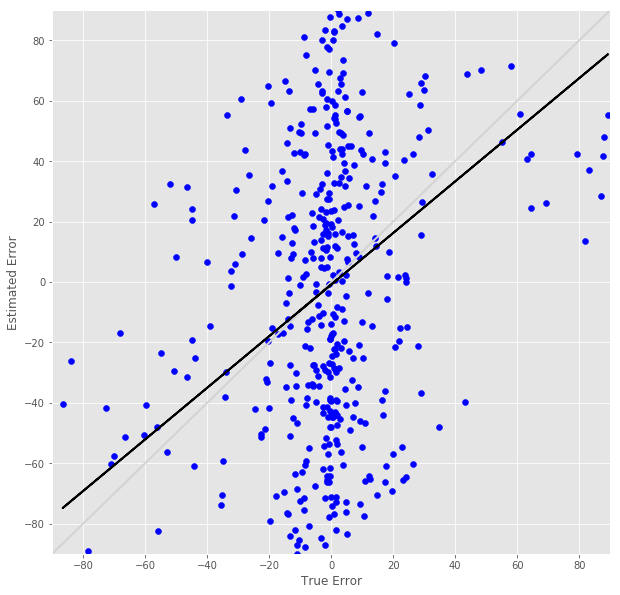

R^2 score for regression on RT: 0.0017
k = -0.0148


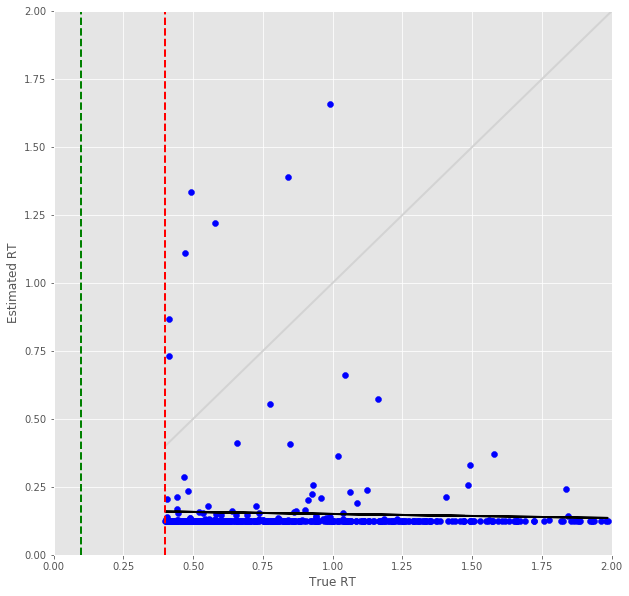

Error Prediction Score: 0.9076 RMSE
RT Prediction Score: 0.8658 RMSE
Error Prediction Corr: 0.4473
RT Prediction Corr: 0.0287
R^2 score for regression on Error: 0.2001
k = 0.8847


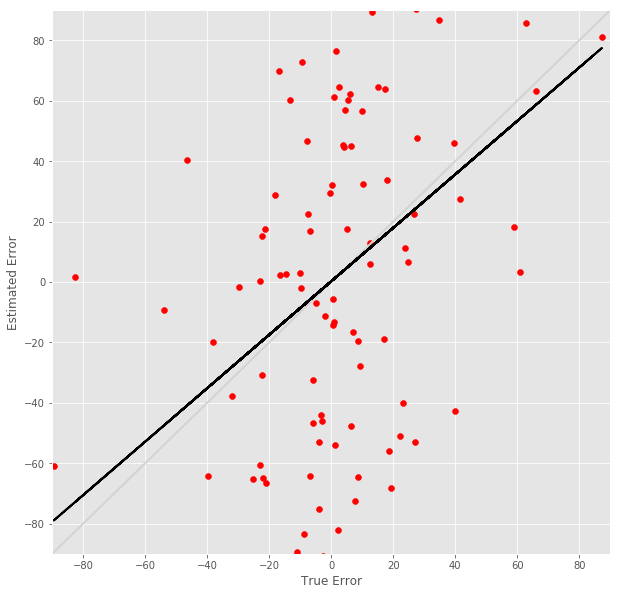

R^2 score for regression on RT: 0.0008
k = 0.0022


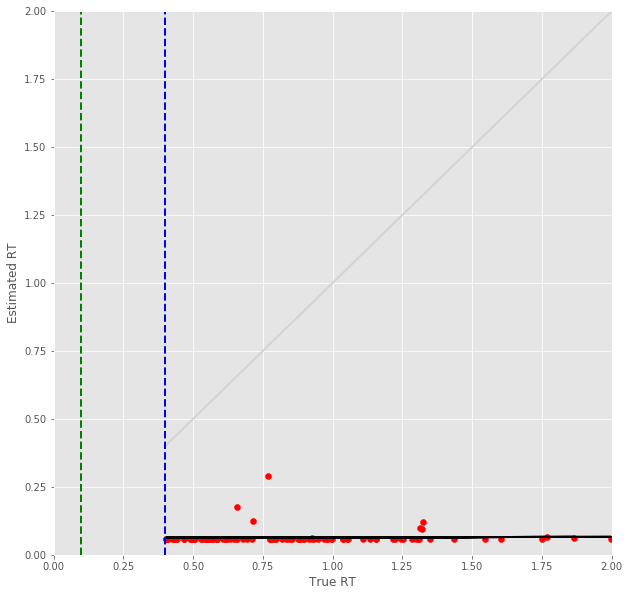

28 -step(s) forecast:
Test Score for 28 -steps forecast: 6.9926 RMSE
Predict Score for 28 -steps forecast: 7.6259 RMSE
Error Test Score for 28 -steps forecast: 0.8534 RMSE
RT Test Score for 28 -steps forecast: 0.8334 RMSE
Error Test Corr for 28 -steps forecast: 0.4159
RT Test Corr for 28 -steps forecast: -0.0404


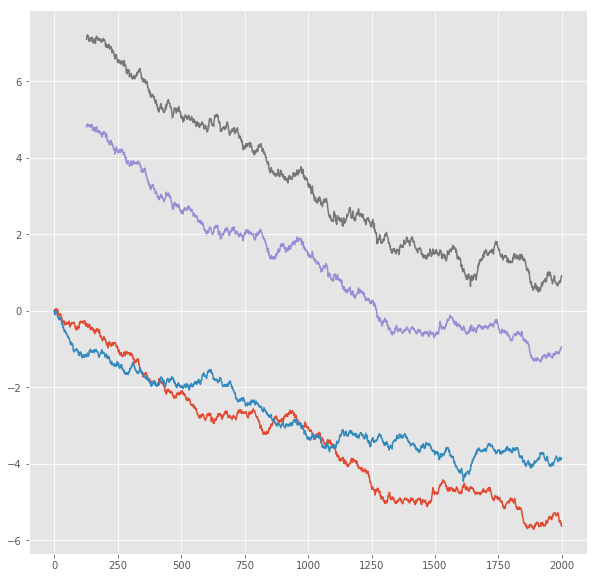

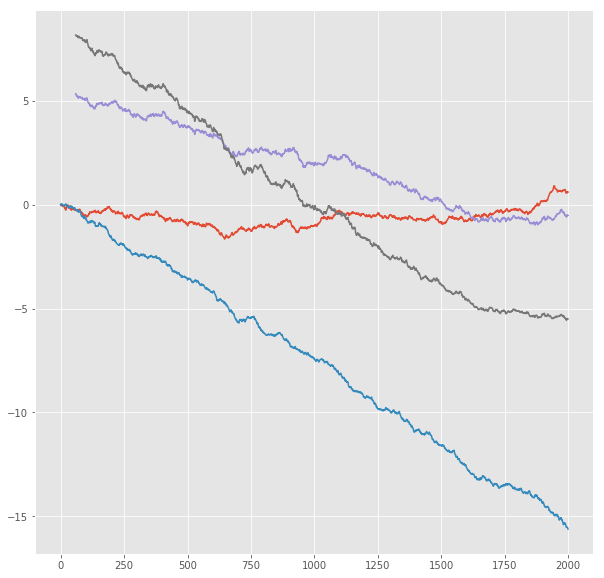

R^2 score for regression on Error: 0.1730
k = 0.8730


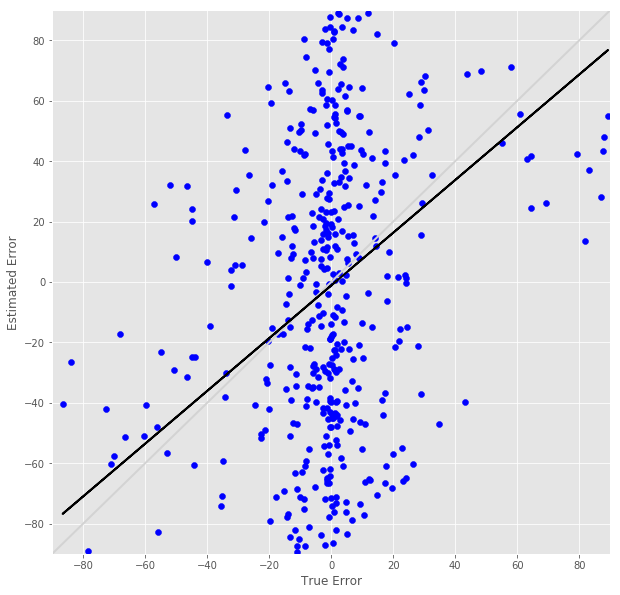

R^2 score for regression on RT: 0.0016
k = -0.0133


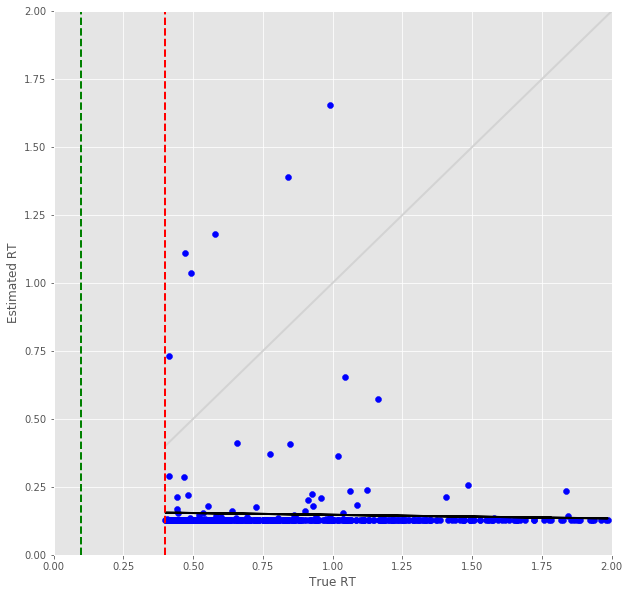

Error Prediction Score: 0.9069 RMSE
RT Prediction Score: 0.8680 RMSE
Error Prediction Corr: 0.4491
RT Prediction Corr: 0.0411
R^2 score for regression on Error: 0.2017
k = 0.8885


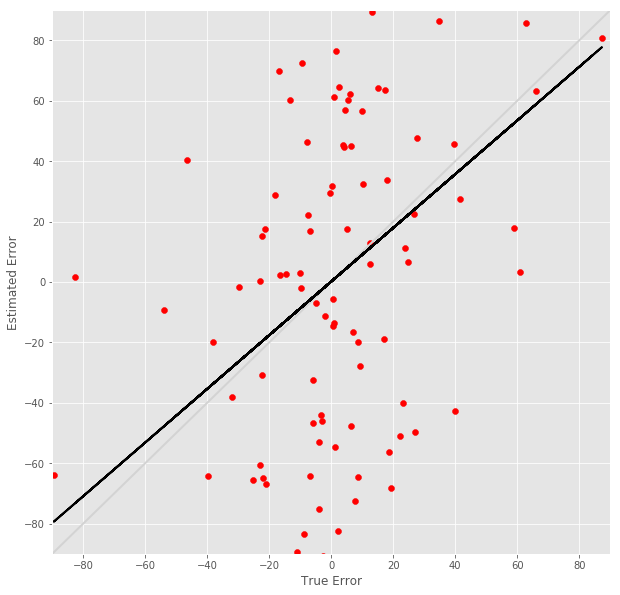

R^2 score for regression on RT: 0.0017
k = 0.0010


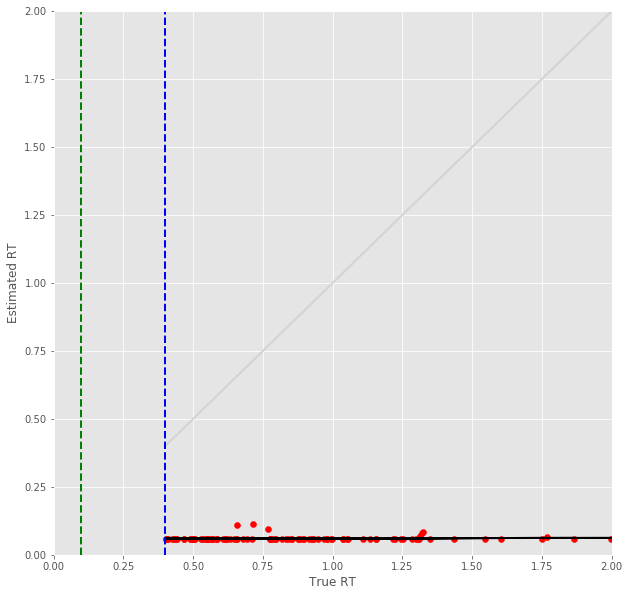

29 -step(s) forecast:
Test Score for 29 -steps forecast: 7.2396 RMSE
Predict Score for 29 -steps forecast: 7.8589 RMSE
Error Test Score for 29 -steps forecast: 0.8570 RMSE
RT Test Score for 29 -steps forecast: 0.8344 RMSE
Error Test Corr for 29 -steps forecast: 0.4122
RT Test Corr for 29 -steps forecast: -0.0500


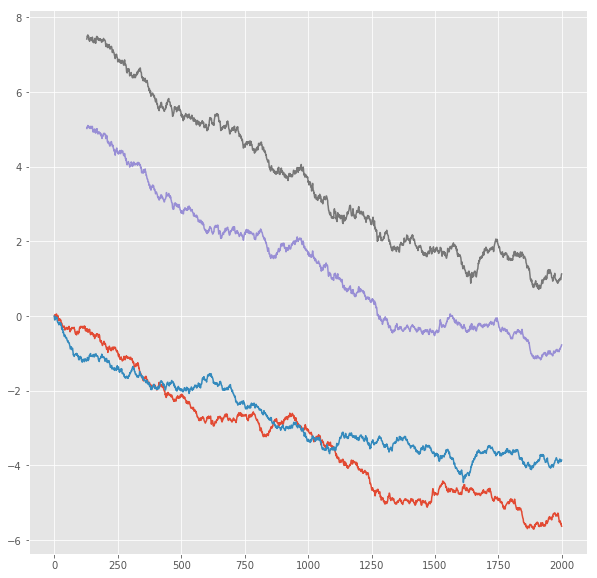

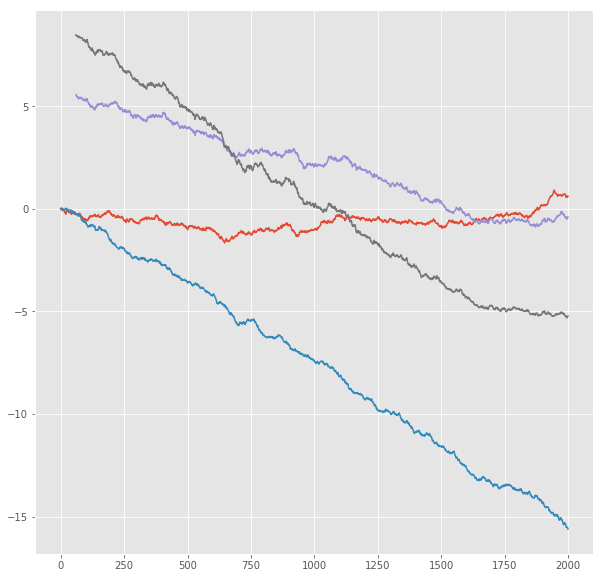

R^2 score for regression on Error: 0.1699
k = 0.8695


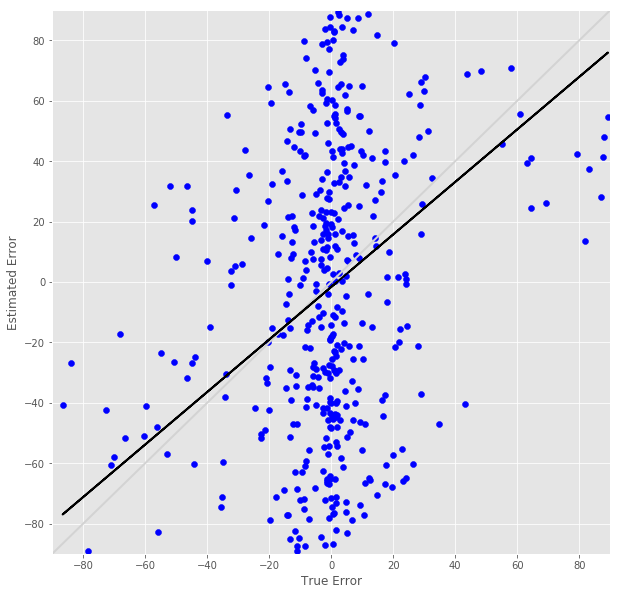

R^2 score for regression on RT: 0.0025
k = -0.0189


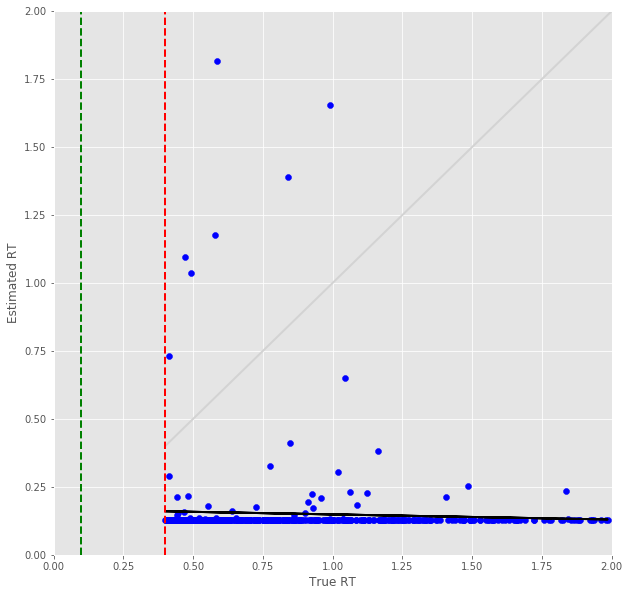

Error Prediction Score: 0.9090 RMSE
RT Prediction Score: 0.8684 RMSE
Error Prediction Corr: 0.4479
RT Prediction Corr: 0.0398
R^2 score for regression on Error: 0.2006
k = 0.8874


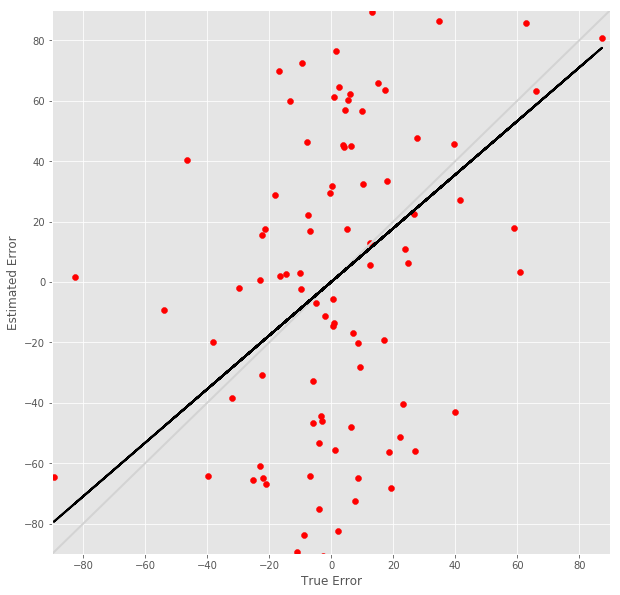

R^2 score for regression on RT: 0.0016
k = 0.0004


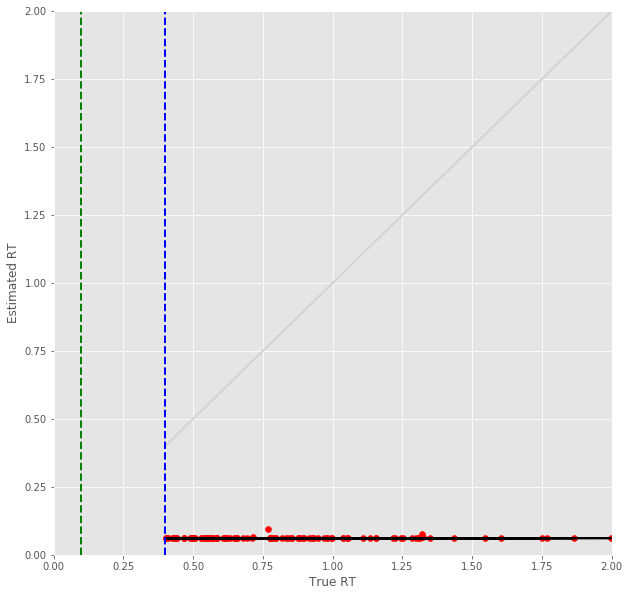

30 -step(s) forecast:
Test Score for 30 -steps forecast: 7.4847 RMSE
Predict Score for 30 -steps forecast: 8.0895 RMSE
Error Test Score for 30 -steps forecast: 0.8629 RMSE
RT Test Score for 30 -steps forecast: 0.8320 RMSE
Error Test Corr for 30 -steps forecast: 0.4063
RT Test Corr for 30 -steps forecast: -0.0630


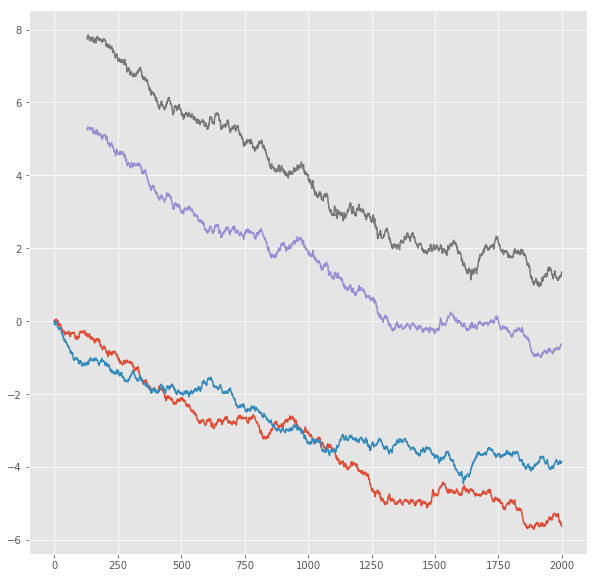

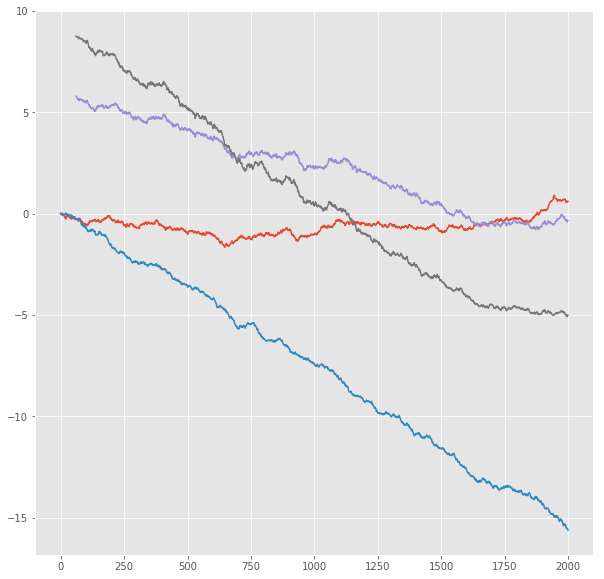

R^2 score for regression on Error: 0.1651
k = 0.8643


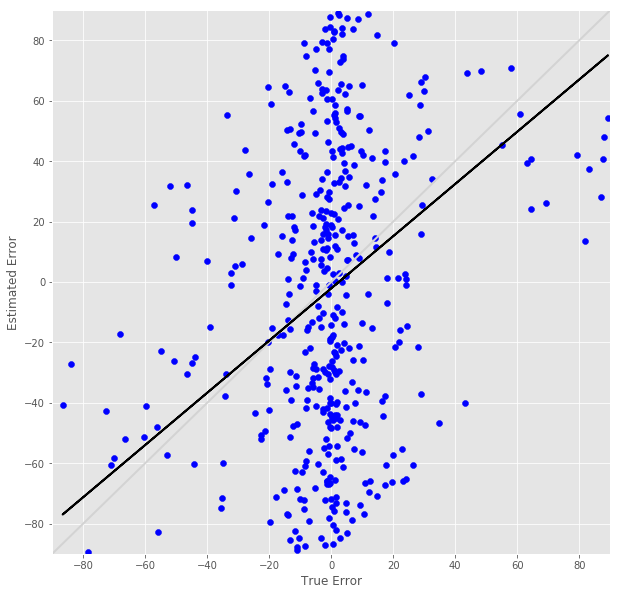

R^2 score for regression on RT: 0.0040
k = -0.0119


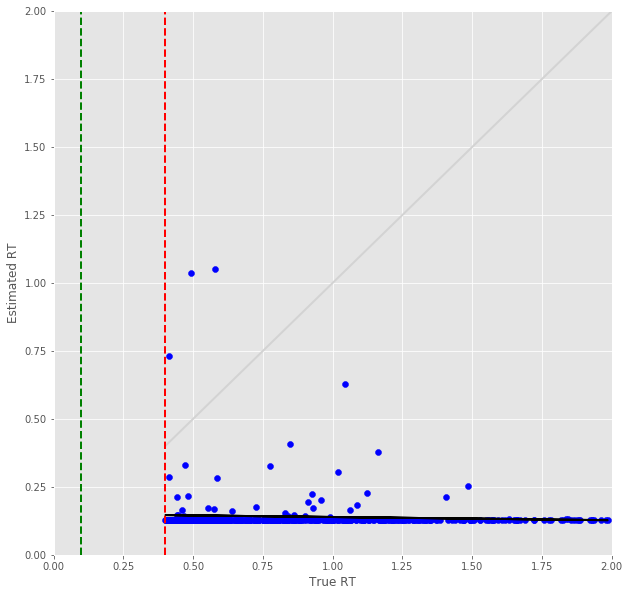

Error Prediction Score: 0.9092 RMSE
RT Prediction Score: 0.8677 RMSE
Error Prediction Corr: 0.4478
RT Prediction Corr: 0.0247
R^2 score for regression on Error: 0.2005
k = 0.8875


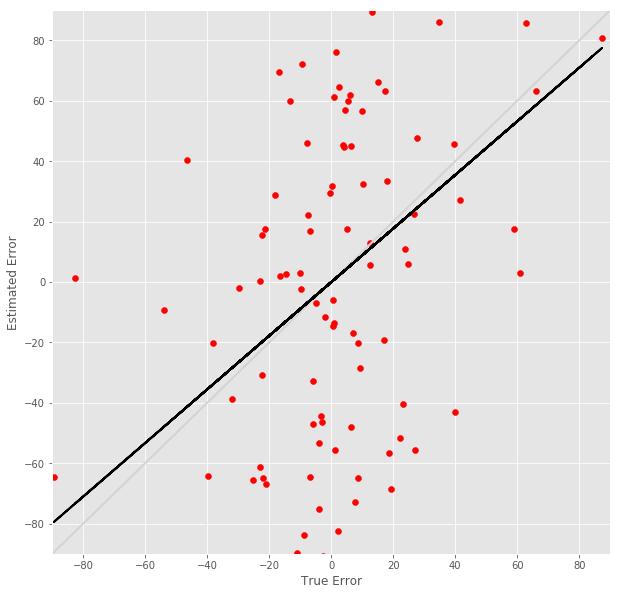

R^2 score for regression on RT: 0.0006
k = 0.0002


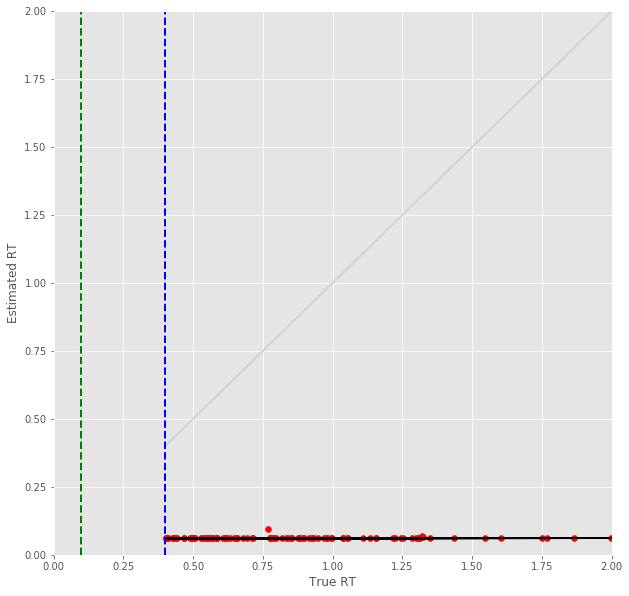

31 -step(s) forecast:
Test Score for 31 -steps forecast: 7.7276 RMSE
Predict Score for 31 -steps forecast: 8.3179 RMSE
Error Test Score for 31 -steps forecast: 0.8655 RMSE
RT Test Score for 31 -steps forecast: 0.8310 RMSE
Error Test Corr for 31 -steps forecast: 0.3993
RT Test Corr for 31 -steps forecast: -0.0362


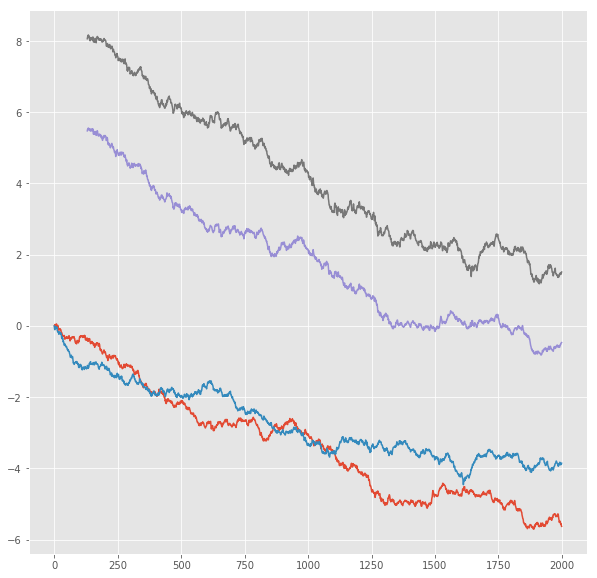

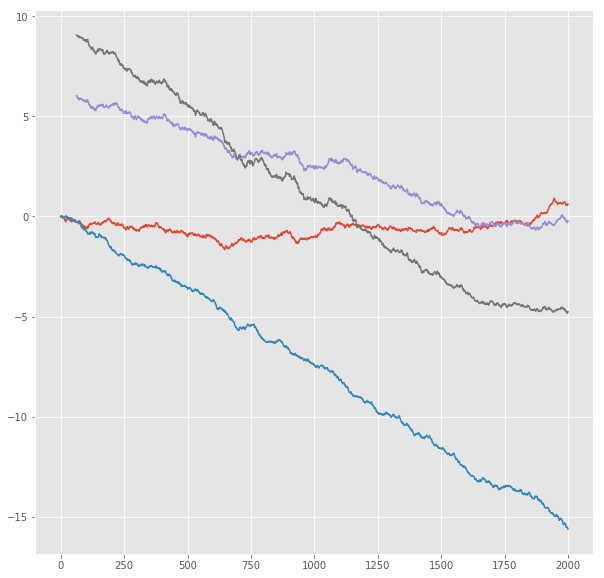

R^2 score for regression on Error: 0.1594
k = 0.8506


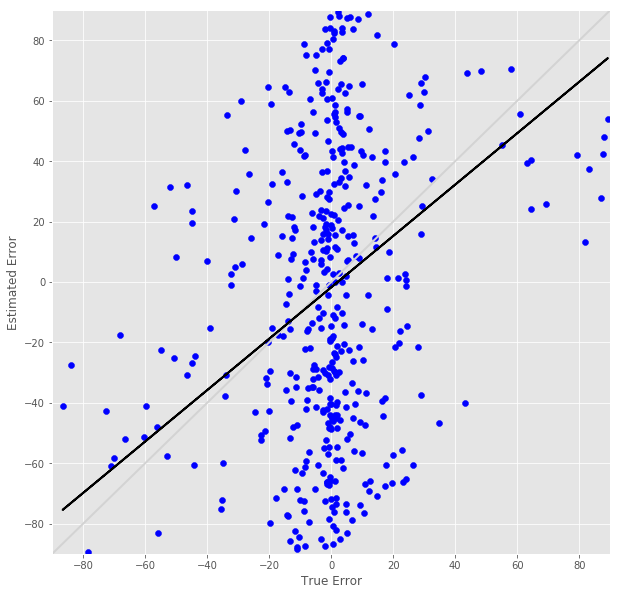

R^2 score for regression on RT: 0.0013
k = -0.0054


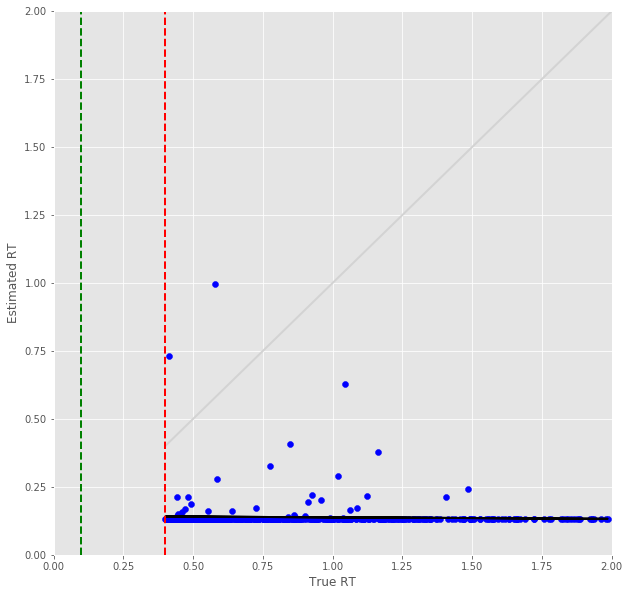

Error Prediction Score: 0.9096 RMSE
RT Prediction Score: 0.8670 RMSE
Error Prediction Corr: 0.4475
RT Prediction Corr: -0.0231
R^2 score for regression on Error: 0.2002
k = 0.8871


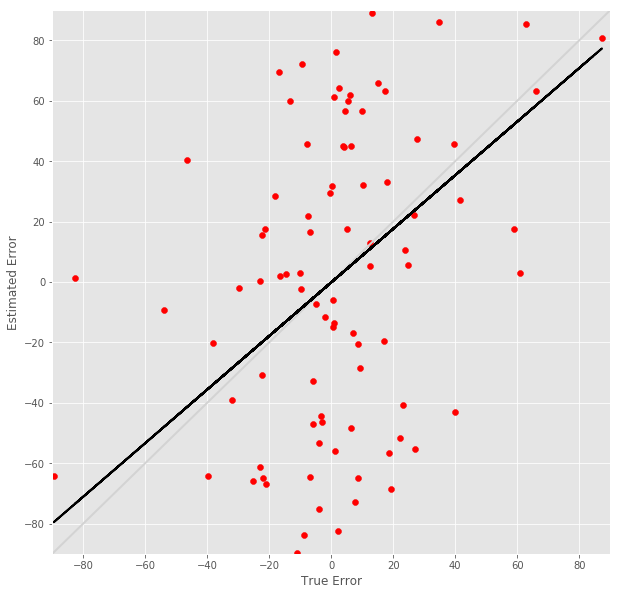

R^2 score for regression on RT: 0.0005
k = -0.0002


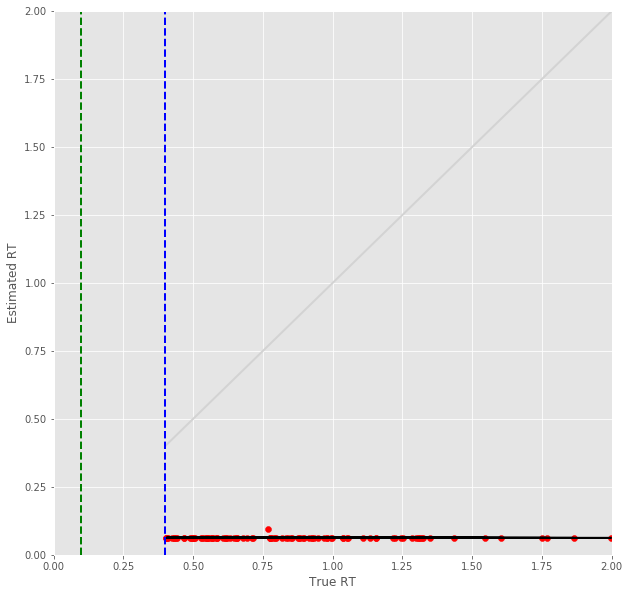

32 -step(s) forecast:
Test Score for 32 -steps forecast: 7.9683 RMSE
Predict Score for 32 -steps forecast: 8.5439 RMSE
Error Test Score for 32 -steps forecast: 0.8676 RMSE
RT Test Score for 32 -steps forecast: 0.8310 RMSE
Error Test Corr for 32 -steps forecast: 0.3965
RT Test Corr for 32 -steps forecast: -0.0481


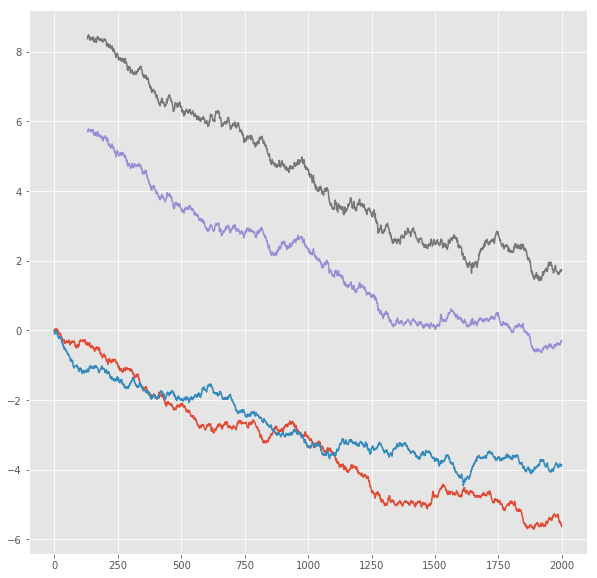

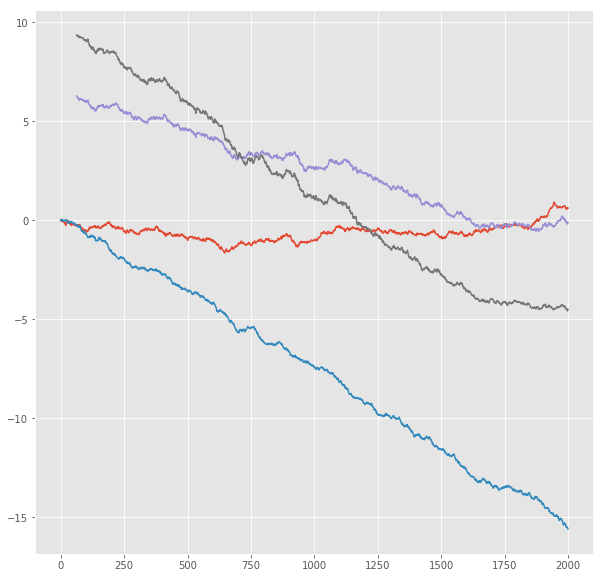

R^2 score for regression on Error: 0.1572
k = 0.8479


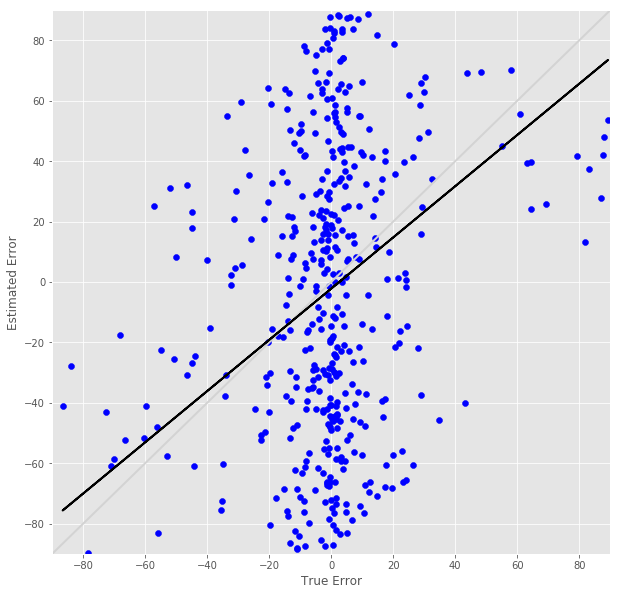

R^2 score for regression on RT: 0.0023
k = -0.0041


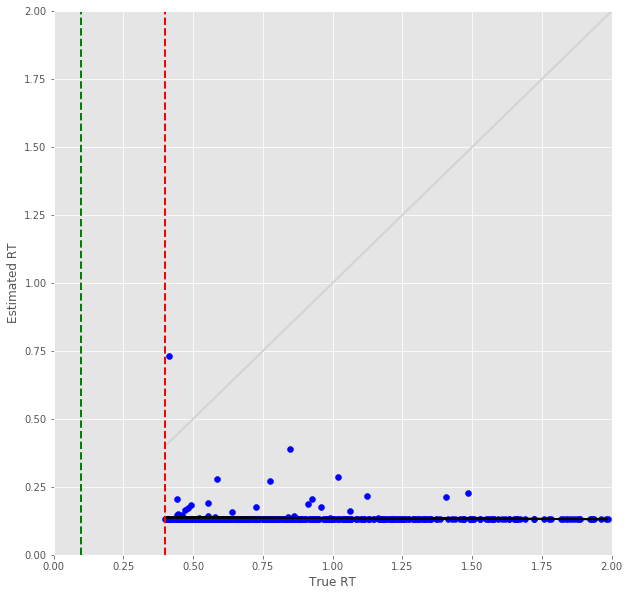

Error Prediction Score: 0.9098 RMSE
RT Prediction Score: 0.8661 RMSE
Error Prediction Corr: 0.4474
RT Prediction Corr: -0.0231
R^2 score for regression on Error: 0.2002
k = 0.8870


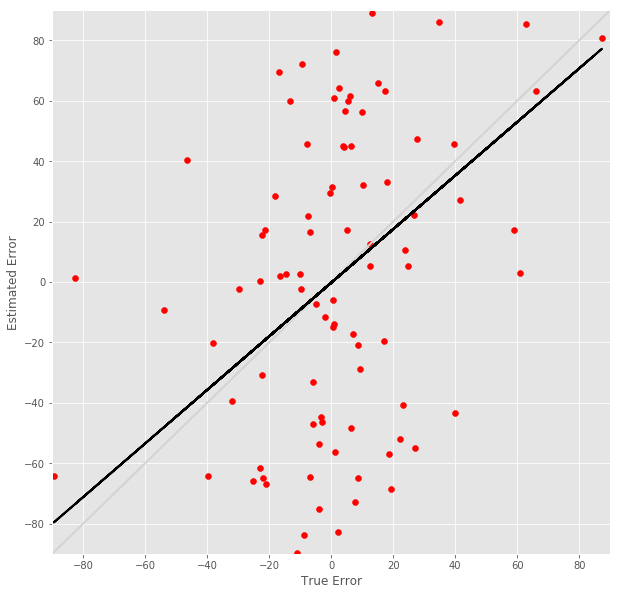

R^2 score for regression on RT: 0.0005
k = -0.0002


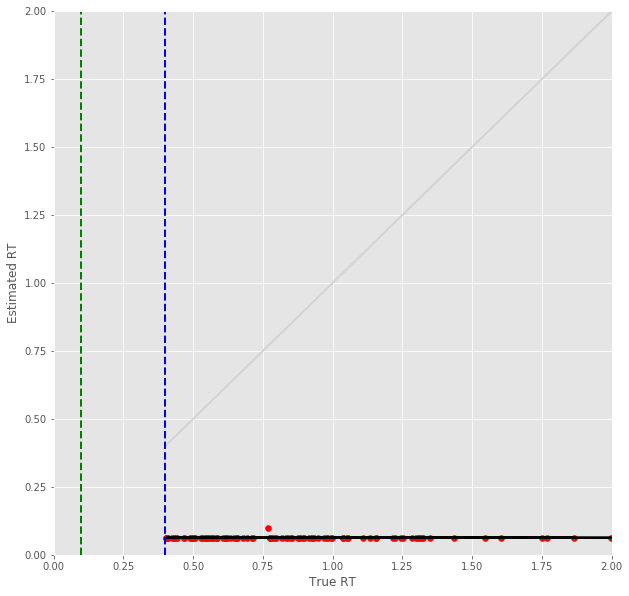

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

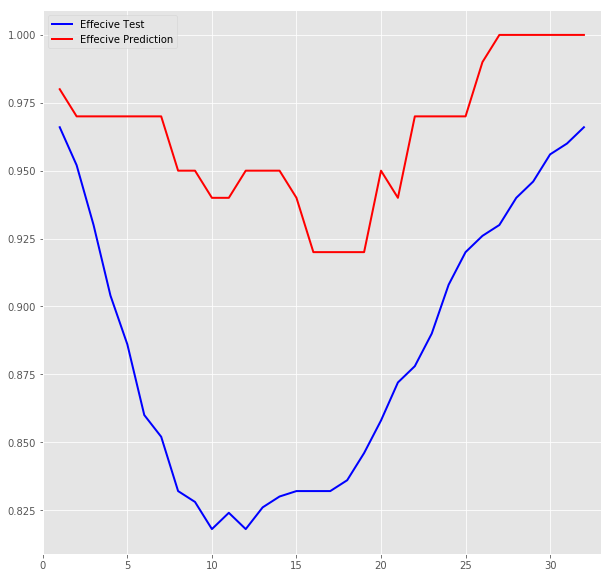

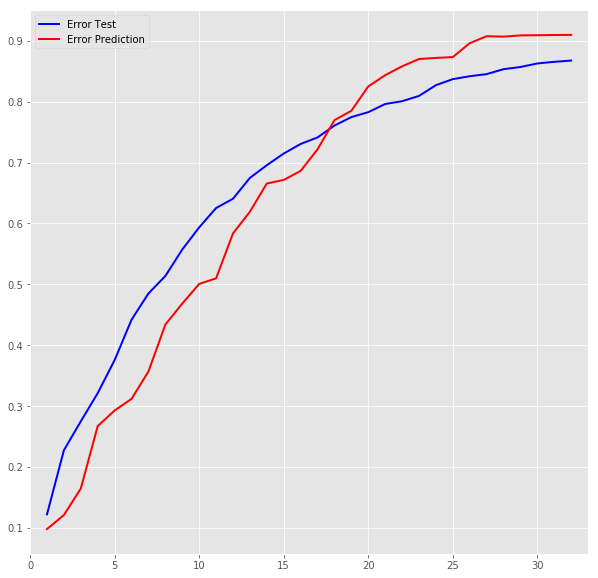

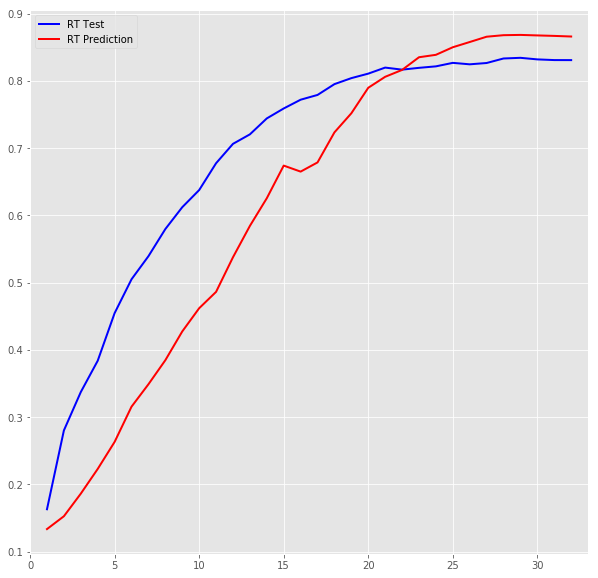

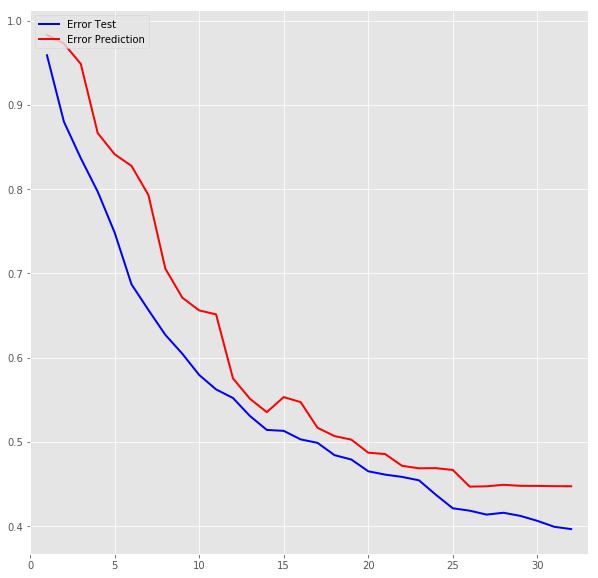

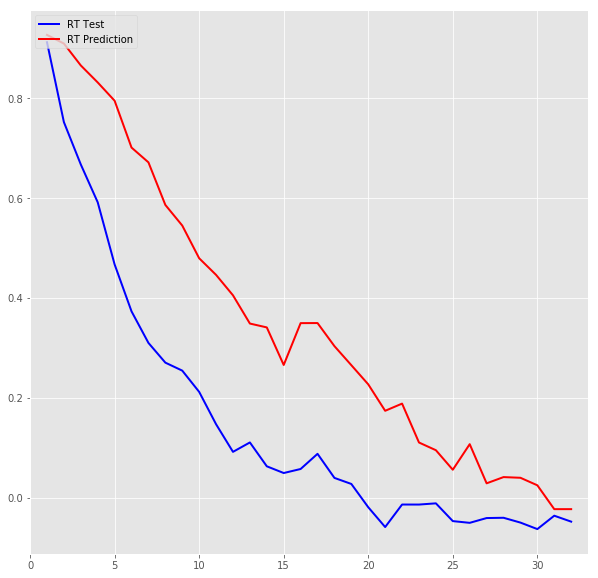

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
